###  <center> ULTRASOUND NERVE SEGMENTATION

<h5>- Venkatesh

<p style='text-align: justify;'> In Medical Field there are enormous facilities that has been never thought
before, they done more improvements in the field of surgery, x-rays, medicine and
lot more but still people are facing difficulties or pain in facing the treatment of
ultrasound images. These ultrasound scans are very important to detect any kind of
injury of disease in human body because it used to scan the internal tissues of the
body</p>

<p style='text-align: justify;'> Now, in this Case Study am going identify the nerve structures in ultrasound
images of various patients which is useful to decrease the pain of the patient after
surgery and speedy recover.</p>

### Data

<p style='text-align: justify;'>This Data contains the images of Ultrasound nerves of neck of patients
which are manually by the experts identified the Brachial plexus where
the patient finds pain.</p>

- The Data can be downloaded from here https://www.kaggle.com/c/ultrasound-nerve-segmentation/data
- <b> Files:</b>
    - Train :1.08GB
    - Contains 5635 images of 47 patients with their corresponding masks images.
    - Test :1.05GB
    - Contains 5508 images which are to be segmented.
    - Train masks :2.14MB
    - Sample submission :48KB

### Problem Statement

- To Detect the presence of Brachial plexus (BP) nerve where the patient is finding the pain with best possible score.

### Type

- Binary Image Classification Problem 

### Objectives and Constraints

- No Low Latency Constraints.
- Predictions have to be very accurate

### Performance Metrics

- <b>Dice Coefficient</b>
 
<p style='text-align: justify;'> As it is mentioned in the Kaggle Competetion, but in production we can use <b>Recall Score</b> because the prediction should be accurate otherwise it will effect the patient. 

### Importing Packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
import seaborn as sb

from glob import glob 
import os
import shutil

from tqdm import tqdm_notebook as tqdm

import warnings
warnings.filterwarnings("ignore")
import cv2

from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score


import time
import datetime

import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras import models, layers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Activation, Flatten, MaxPooling2D, Dense, GlobalMaxPooling2D, GlobalAveragePooling2D, Concatenate, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras import Input
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint,TensorBoard
from tensorflow.keras import backend as K
AT = tf.data.experimental.AUTOTUNE

physical_devices = tf.config.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(physical_devices[0], True)

### Reading and Understanding train_masks data

In [2]:
train_masks = pd.read_csv("train_masks.csv")

In [3]:
train_masks.head()

,subject,img,pixels
0,1,1,168153 9 168570 15 168984 22 169401 26 169818 ...
1,1,2,96346 7 96762 16 97179 27 97595 35 98012 40 98...
2,1,3,121957 2 122365 26 122784 28 123202 31 123618 ...
3,1,4,110980 9 111393 21 111810 33 112228 43 112647 ...
4,1,5,NaN


In [4]:
train_masks.shape

(5635, 3)

In [5]:
train_masks.isna().sum()

subject       0
img           0
pixels     3312
dtype: int64

In [6]:
nerve_with_BP = (train_masks['pixels'][train_masks['pixels']!='NaN'].count())
print(nerve_with_BP)

2323


In [7]:
nerve_wo_BP=(train_masks.shape[0]-nerve_with_BP)
print(nerve_wo_BP)

3312


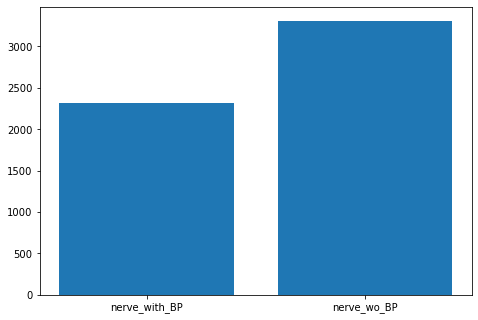

In [8]:
import matplotlib.pyplot as plt
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
lables = ['nerve_with_BP', 'nerve_wo_BP']
lables_values = [2323,3312]
ax.bar(lables,lables_values)
plt.show()

In [9]:
print("% of nerve with BP : {:.3f} %".format((nerve_with_BP*100/train_masks.shape[0])))
print("% of nerve without BP : {:.3f} %".format((nerve_wo_BP*100/train_masks.shape[0])))

% of nerve with BP : 41.224 %
% of nerve without BP : 58.776 %


- Here we can observe that Data set is Partially Imbalanced
- Data is in 60:40 Ratio i.e Images with BP nerve are 41.22% and Images without BP nerve are 58.77%

### Reading and Understanding train data

In [10]:
def fimg_to_fmask(img_path):
    # convert an image file path into a corresponding mask file path 
    dirname, basename = os.path.split(img_path)
    maskname = basename.replace(".jpeg", "_mask.jpeg")
    return os.path.join(dirname, maskname)

In [11]:
f_ultrasounds = [img for img in glob("train/*.jpeg") if 'mask' not in img]
# f_ultrasounds.sort()  
f_masks       = [fimg_to_fmask(fimg) for fimg in f_ultrasounds]

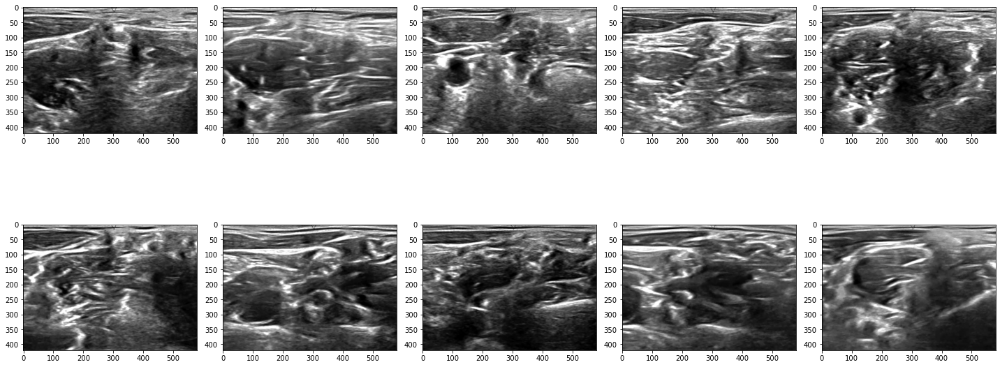

In [12]:

fig = plt.figure(figsize = (20,10))
Plot_loc = 1
for i in np.random.randint(low = 0, high = len(f_ultrasounds), size = 10):
    Image_Path=f_ultrasounds[i]
    img = cv2.imread(Image_Path)
    ax = fig.add_subplot(2, 5, Plot_loc)
    ax.imshow(img, cmap = 'gray')
    Plot_loc+= 1
    

plt.tight_layout()
plt.show()

In [13]:
len(f_ultrasounds)

5635

In [14]:
len(f_masks)

5635

### Cleaning Data

- Checking for the Images that are completely bright or Completely Dark. As, these images do not infer anything.

In [15]:
# Setting the Thresholds for Segregation

DImg_T=(10/255)
BImg_T=(245/255)

DImg=[]
BImg=[]

for idx in tqdm(f_ultrasounds):
    
    #path = os.path.join(Train_Data_Dir, idx)
    
    # Reading The Image
    bgr_img = cv2.imread(idx)
    
    # Splitting into Intensities
    b,g,r = cv2.split(bgr_img)
    rgb_img = cv2.merge([r,g,b])
    
    # Saving as Image Intensity Array
    Imarray = rgb_img / 255

    # Comparing With The Threshold Values
    if(Imarray.max() < DImg_T):
        DImg.append(idx)
        continue 
         
    elif(Imarray.min() > BImg_T):
        BImg.append(idx)
        continue

In [16]:
print("Number of Images That are Too Dark : ",len(DImg))
print("Number of Images That are Too Bright : ",len(BImg))

Number of Images That are Too Dark :  0
Number of Images That are Too Bright :  0


- There are no Too Dark and Too Bright images in train dataset.

In [17]:
img = cv2.imread(f_ultrasounds[0])
height, width, channels = img.shape
print('Image dimensions: ' + str(height) + 'h x ' + str(width) + 'w - ' + str(channels) + ' channels')

Image dimensions: 420h x 580w - 3 channels


### Splitting the image and mask path files

In [18]:
x=pd.DataFrame({"Img_Path":f_ultrasounds,"Mask_Path":f_masks})

In [19]:
x.head()

,Img_Path,Mask_Path
0,train\10_1.jpeg,train\10_1_mask.jpeg
1,train\10_10.jpeg,train\10_10_mask.jpeg
2,train\10_100.jpeg,train\10_100_mask.jpeg
3,train\10_101.jpeg,train\10_101_mask.jpeg
4,train\10_102.jpeg,train\10_102_mask.jpeg


### Splitting the Data

- Here we are splitting the Data in the Ratio 90:10

In [20]:
y=[]
for i in range(0,train_masks.shape[0]):
    if str(train_masks['pixels'][i])=='nan':
        y.append(0)
    else:
        y.append(1)
          

In [21]:
from sklearn.model_selection import train_test_split
xx=x['Img_Path'].tolist()
x_train,x_test,y_train,y_test=train_test_split(xx,y,test_size=.10,stratify=y)

In [22]:
pd.Series(y_train).value_counts()

0    2981
1    2090
dtype: int64

In [23]:
pd.Series(y).value_counts()

0    3312
1    2323
dtype: int64

In [24]:
pd.Series(y_test).value_counts()

0    331
1    233
dtype: int64

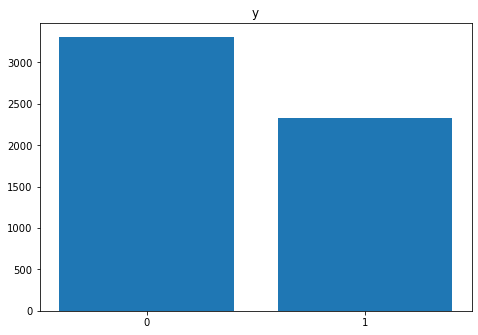

In [25]:
import matplotlib.pyplot as plt
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
lables = ['0', '1']
lables_values = [3312,2323,]
ax.bar(lables,lables_values)
plt.title('y')
plt.show()

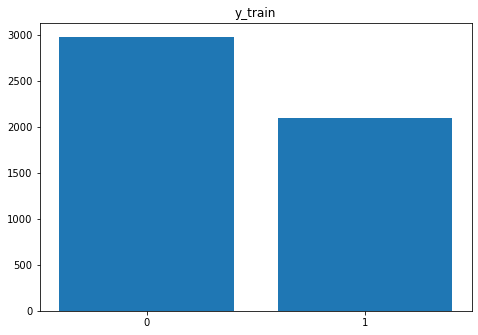

In [26]:
import matplotlib.pyplot as plt
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
lables = ['0', '1']
lables_values = [2981,2090,]
ax.bar(lables,lables_values)
plt.title('y_train')
plt.show()

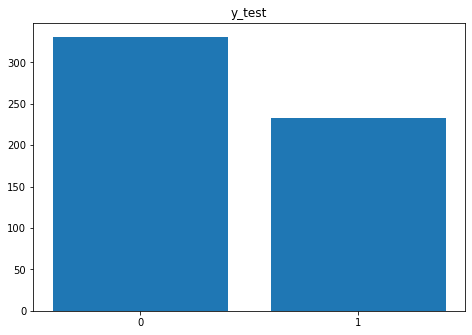

In [27]:
import matplotlib.pyplot as plt
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
lables = ['0', '1']
lables_values = [331,233,]
ax.bar(lables,lables_values)
plt.title('y_test')
plt.show()

In [28]:
print(len(x_train))

5071


In [29]:
len(x_train)

5071

In [36]:
import os, sys
from PIL import Image
for infile in tqdm(x['Img_Path']):
    if infile[-3:] == "tif" or infile[-3:] == "bmp" :
        outfile = infile[:-3] + "jpeg"
        im = Image.open(infile)
        out = im.convert("RGB")
        out.save(outfile, "JPEG", quality=100)

In [37]:
import os, sys
from PIL import Image
for infile in tqdm(x['Mask_Path']):
    if infile[-3:] == "tif" or infile[-3:] == "bmp" :
        outfile = infile[:-3] + "jpeg"
        im = Image.open(infile)
        out = im.convert("RGB")
        out.save(outfile, "JPEG", quality=100)

### Model Architecture

#### Input Data Pipeline Using tf.data

<b>Referred:</b>

 - https://cs230.stanford.edu/blog/datapipeline/
 - https://www.youtube.com/watch?v=uIcqeP7MFH0
 - https://www.tensorflow.org/api_docs/python/tf/data
 - https://www.youtube.com/watch?v=oFFbKogYdfc
 - https://www.wouterbulten.nl/blog/tech/data-augmentation-using-tensorflow-data-dataset/

In [38]:
# Parse Function

def _parse_fn(ImgFile, Label):
    Img_Path = tf.io.read_file(ImgFile)
    Img_Dec = tf.image.decode_jpeg(Img_Path)
    Img_Nor = (tf.cast(Img_Dec, tf.float32)/255)
    Final_Img = tf.image.resize(Img_Nor, (Img_Height, Img_Width))
    return Final_Img, Label

In [39]:
Img_Height=96
Img_Width=96
Batch_Size = 128

In [40]:
# Creating Dataset from slices of Image Path's and Labels Using tf.Data
T_Data = tf.data.Dataset.from_tensor_slices((tf.constant(x_train), tf.constant(y_train)))
V_Data=tf.data.Dataset.from_tensor_slices((tf.constant(x_test), tf.constant(y_test)))

# Parsing The Images to Pixel Values
T_Data=T_Data.map(_parse_fn,num_parallel_calls=AT)
V_Data=V_Data.map(_parse_fn,num_parallel_calls=AT)

# Batch the Images
T_Data=T_Data.batch(Batch_Size)
V_Data =V_Data.batch(Batch_Size)

# Prefetching Batch
T_Data=T_Data.prefetch(buffer_size=AT)
V_Data=V_Data.prefetch(buffer_size=AT)

#### Metric Function

In [44]:
# ROC-AUC Score
def AUC(y_true, y_pred):
    return tf.py_function(roc_auc_score, (y_true, y_pred), tf.double)

#### Gradient Tape

#### Referred :
 - https://www.tensorflow.org/api_docs/python/tf/GradientTape
 - https://en.wikipedia.org/wiki/Automatic_differentiation
 - https://www.pyimagesearch.com/2020/03/23/using-tensorflow-and-gradienttape-to-train-a-keras-model/ 

In [45]:
K.clear_session()
Init_LR=0.0001
loss = tf.keras.losses.BinaryCrossentropy()

optimizer = Adam(lr=Init_LR)
Opt_Adam =Adam(lr=Init_LR)

train_loss = tf.keras.metrics.Mean(name='train_loss')
train_accuracy = tf.keras.metrics.BinaryAccuracy(name='train_accuracy')

val_loss = tf.keras.metrics.Mean(name='val_loss')
val_accuracy = tf.keras.metrics.BinaryAccuracy(name='val_accuracy')

test_loss = tf.keras.metrics.Mean(name='test_loss')
test_accuracy = tf.keras.metrics.BinaryAccuracy(name='test_accuracy')

### CNN Based Model

#### Modeling with binary cross entropy as loss function and metric as AUC 

In [46]:
class MP2(tf.keras.layers.Layer):   
    def __init__(self):
        super(MP2,self).__init__()
        self.MP=tf.keras.layers.MaxPool2D(2)              
    def call(self,inputs):
        return self.MP(inputs)
    
class Dr_Den(tf.keras.layers.Layer):
    def __init__(self,rate,**kwargs):
        super(Dr_Den,self).__init__(**kwargs)
        self.rate=rate
        self.Dens=tf.keras.layers.Dense(1,activation='sigmoid')
    def call(self,inputs):
        lay= tf.nn.dropout(inputs,rate=self.rate)
        lay= self.Dens(lay)
        return lay   

class CNNModel(tf.keras.Model):
    def __init__(self,rate,**kwargs):
        super(CNNModel,self).__init__()
        self.conv2D1 = tf.keras.layers.Conv2D(16,kernel_size=3, input_shape=(None,Img_Height,Img_Width,3),activation='relu') 
        self.Flat=tf.keras.layers.Flatten()
        self.MP2D=MP2()
        self.rate=rate
        self.Dens=Dr_Den(rate)
        
    def call(self, inputs, **kwargs):
        model=self.conv2D1(inputs)
        model=self.MP2D(model)
        model=self.Flat(model)
        model=self.Dens(model)
        return model

In [99]:
def UNSModelGTCNN(Epochs,checkpoint,manager,File_Name,modelc):
    
    start_time=time.clock()
    
    print("\nInitializing Parameters . . .")


    train_loss_results = []
    train_accuracy_results = []

    val_loss_results = []
    val_accuracy_results = []
    
    train_auc=[]
    val_auc=[]
   
    iepoch=0
    T_step=0
    V_step=0
    
    # Defining GradientTape
    
    @tf.function
    def GT(modelc,X_batch,Y_batch):    
        with tf.GradientTape() as tape:
            Y_Pred=modelc(X_batch, training=True)
            #Y_Pred=tf.cast(Y_Pred,tf.int32)
            #Y_batch=tf.cast(Y_batch,tf.int32)
            loss_values=loss(Y_batch, Y_Pred)
            gradients=tape.gradient(loss_values, modelc.trainable_weights)
            Opt_Adam.apply_gradients(zip(gradients, modelc.trainable_weights))
        
            return loss_values,Y_Pred
    
    # Initializing the Identifiers
    
    train_log_dir = 'logs/GT/UNS_D169_' + File_Name + '/train'
    val_log_dir = 'logs/GT/UNS_D169_' + File_Name + '/val'
    summary_writer = tf.summary.FileWriter(train_log_dir)
    val_summary_writer = tf.summaryFileWriter(train_log_dir)
    save_path='ModelsGT/UNS_D169_' + File_Name
    Los=tf.Variable(0.0)
    tf.summary.scalar('Loss',Los)
    msummary=tf.summary.merge_all()
    # Training the Model
    
    print("\nTraining the Model . . .")
    print("\nChecking for the Checkpoint Files . . .")
    
    # Checking for the Checkpoints
    checkpoint.restore(manager.latest_checkpoint)
    if manager.latest_checkpoint:
        print("\nFound . .  !\nRestoring . . ")
        print("\nRestored from {}".format(manager.latest_checkpoint))
        ind=manager.latest_checkpoint.find("ckpt")
        iepoch=int(manager.latest_checkpoint[(ind+5):])
        print("\nTraining from Epoch {}".format(int(iepoch)+1))
        T_step=iepoch*(len(x_train)//Batch_Size)
        V_step=iepoch*(len(x_test)//Batch_Size)
    else:
        print("\nNot Found . . !")
        print("\nTraining the Model From Scratch . . .")
    
    Epochs=Epochs+int(iepoch)
    for epoch in range(int(iepoch),Epochs):
       
        print("\nEpoch {}/{}".format(epoch+1, Epochs))
        print("[", end ="")
        c=0
        # for loop iterate over batches
        for (X_batch, y_batch) in (T_Data):
        
                
        
            # GradientTape
            loss_values,y_pred=GT(modelc,X_batch,y_batch)
           

            #train_loss(loss_values)
            train_accuracy(y_batch, y_pred)
            train_AUC=AUC(y_batch,y_pred)
            

            #train_loss_results.append(loss_values)
            train_accuracy_results.append(train_accuracy.result())
            train_auc.append(train_AUC)
            
            c+=1
            #train_accuracy.reset_states
            T_step+=1
        # Tensorboard Summary Writer    
            #with summary_writer.as_default():
             #   tf.summary.scalar(f'Step Loss/Train', loss_values, step=T_step)
              #  tf.summary.scalar(f'Step Accuracy/Train', train_accuracy.result(), step=T_step)
               # tf.summary.scalar('Step AUC/Train', train_AUC, step=T_step)
                
       # with summary_writer.as_default():
            #tf.summary.scalar(f'Epoch Loss/Train', loss_values, step=epoch+1)
            #tf.summary.scalar(f'Epoch Accuracy/Train', train_accuracy.result(), step=epoch+1)
            #tf.summary.scalar(f'Epoch AUC/Train', train_AUC, step=epoch+1)
            
        # For Loop Iterating ove Validation Data Batches
        for (X_batch, y_batch) in (V_Data):
        
           
                

            # GradientTape
            val_loss_values,y_pred=GT(modelc,X_batch,y_batch)

            val_loss(val_loss_values)
            val_accuracy(y_batch, y_pred)
            val_AUC=AUC(y_batch,y_pred)


            val_loss_results.append(val_loss_values)
            val_accuracy_results.append(val_accuracy.result())
            val_auc.append(val_AUC)
            
            c+=1
            #val_accuracy.reset_states
            V_step+=1
        # Tensorboard Summary Writer
            #with summary_writer.as_default():
             #   tf.summary.scalar(f'Step Loss/Validation', val_loss_values, step=V_step)
              #  tf.summary.scalar(f'Step Accuracy/Validation', val_accuracy.result(), step=V_step)
               # tf.summary.scalar(f'Step AUC/Validation', val_AUC, step=V_step)
        #with tf.name_scope("per_epoch_params"):
        #with summary_writer.as_default():
        summary=session.run(msummary,{Los:loss_values})
        summary_writer.add_summary(loss_values,epoch+1)
        summary_writer.flush()
        
        summary=session.run(msummary,{Los:loss_values})
        val_summary_writer.add_summary(loss_values,epoch+1)
        val_summary_writer.flush()
                #tf.summary.scalar('Epoch Loss', val_loss_values, step=epoch+1)

                #tf.summary.scalar(f'Epoch Accuracy', train_accuracy.result(), step=epoch+1)
                #tf.summary.scalar(f'Epoch AUC', train_AUC, step=epoch+1)
          #      summary_writer.flush()
        #    with val_summary_writer.as_default():
                #tf.summary.scalar('Epoch Loss', val_loss_values, step=epoch+1)
                #tf.summary.scalar(f'Epoch Accuracy', val_accuracy.result(), step=epoch+1)
                #tf.summary.scalar(f'Epoch AUC', val_AUC, step=epoch+1)
         #       val_summary_writer.flush()
            
        # Creating Checkpoint using tf.train.Checkpoint
        checkpoint = tf.train.Checkpoint(optimizer=Opt_Adam, model=modelc)
        print("]")
        Epoch_Stats = 'Training loss: {:.4f}, Training accuracy: {:.4f}, Train AUC: {:.4f} Validation loss: {:.4f}, Validation accuracy: {:.4f}, Validation AUC: {:.4f}'
        print(Epoch_Stats.format(loss_values,train_accuracy.result() * 100,train_AUC,val_loss_values,val_accuracy.result()*100,val_AUC))
    
        Checkpoint_save_path = manager.save()
        print("Saved Checkpoint for Epoch {}: {}".format(epoch+1, Checkpoint_save_path))
    #checkpoint.save(checkpoint_path+'/')
    z=modelc.predict(V_Data)
    # Saving the Model using tf.saved_model
    tf.saved_model.save(modelc,save_path+'/')
    
    # Displaying Information related to this run
    print("\n\nCorresponding Files to this Run : ")
    print("\nTensorBoard Log Files : logs/GT/UNS_D169_{}".format(File_Name))
    print("\nCheckpoint Files : CheckponitsGT/{}".format(File_Name))
    print("\nModel Files : {}".format(save_path))
        
    print("\n\nTime Taken For This Process : "+ str((time.clock()-start_time)) + " Sec")

In [100]:
def UNS_CNN(Init_LR,Dropout_Rate,Img_Height,Img_Width,Epochs,File_Name):
    
    # Initializing Optimizer
    
    print("\nInitializing Optimizer . . .")
    Opt_Adam =Adam(lr=Init_LR)
    
    # Building Model
    print("\nBuilding Model . . .")
    modelx = CNNModel(rate=Dropout_Rate)
    modelx.build(input_shape=(None, Img_Height,Img_Width,3))
    
    # Creating Checkpoint Objects
    checkpoint = tf.train.Checkpoint(optimizer=Opt_Adam,model=modelx)
    manager = tf.train.CheckpointManager(checkpoint, 'CheckponitsGT/UNS_D169_' + File_Name, max_to_keep=None)
    
    # Calling the Training Module
    K.clear_session()
    UNSModelGTCNN(Epochs=Epochs,checkpoint=checkpoint,manager=manager,File_Name=File_Name,modelc=modelx)

#### Model Using Dropout_Rate=0.5, Learning Rate=0.0001 and Epochs=7

In [101]:
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_CNN(Init_LR=0.0001,Dropout_Rate=0.5,Img_Height=96,Img_Width=96,Epochs=3,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .


AttributeError: module 'tensorflow_core.summary' has no attribute 'FileWriter'

#### Tensor logs

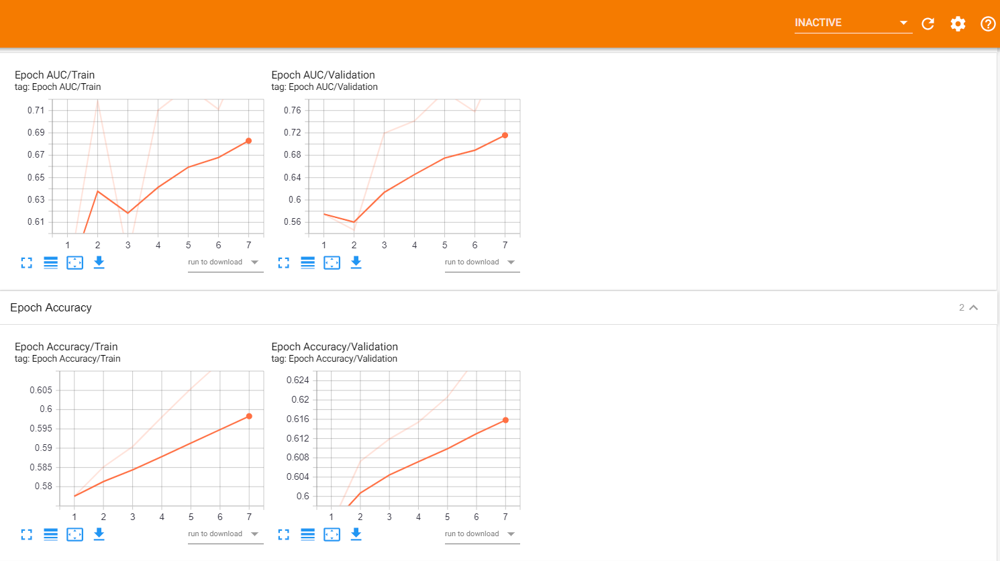

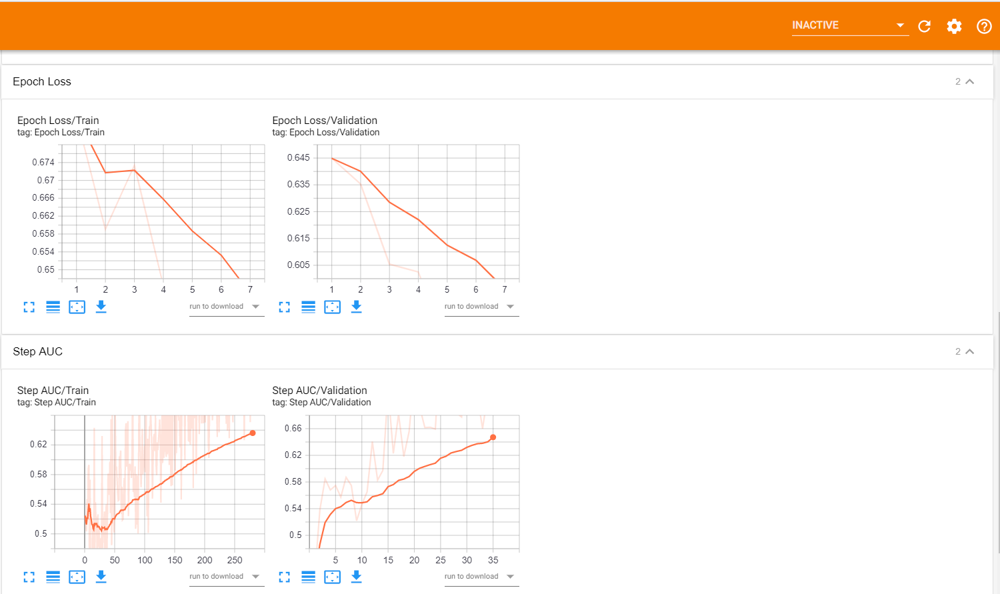

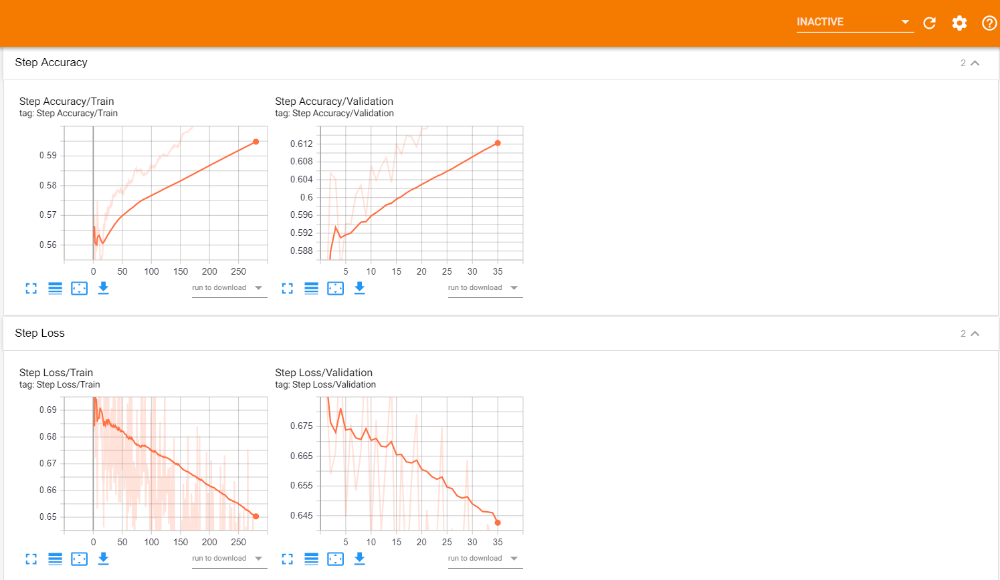

#### Modeling with binary cross entropy as loss function and metric as F1SCORE 

In [38]:
import tensorflow_addons as tfa
from tensorflow_addons.metrics import F1Score
F1S=F1Score(num_classes=2)

In [39]:
class MP2(tf.keras.layers.Layer):   
    def __init__(self):
        super(MP2,self).__init__()
        self.MP=tf.keras.layers.MaxPool2D(2)              
    def call(self,inputs):
        return self.MP(inputs)
    
class Dr_Den(tf.keras.layers.Layer):
    def __init__(self,rate,**kwargs):
        super(Dr_Den,self).__init__(**kwargs)
        self.rate=rate
        self.Dens=tf.keras.layers.Dense(1,activation='sigmoid')
    def call(self,inputs):
        lay= tf.nn.dropout(inputs,rate=self.rate)
        lay= self.Dens(lay)
        return lay   

class CNNModel(tf.keras.Model):
    def __init__(self,rate,**kwargs):
        super(CNNModel,self).__init__()
        self.conv2D1 = tf.keras.layers.Conv2D(16,kernel_size=3, input_shape=(None,Img_Height,Img_Width,3),activation='relu') 
        self.Flat=tf.keras.layers.Flatten()
        self.MP2D=MP2()
        self.rate=rate
        self.Dens=Dr_Den(rate)
        
    def call(self, inputs, **kwargs):
        model=self.conv2D1(inputs)
        model=self.MP2D(model)
        model=self.Flat(model)
        model=self.Dens(model)
        return model

In [40]:
F1S=tfa.metrics.F1Score(
    num_classes=2,
    average= "micro",
    name = 'f1_score'
)

In [41]:
def UNSModelGTCNN(Epochs,checkpoint,manager,File_Name,modelc):
    
    start_time=time.clock()
    
    print("\nInitializing Parameters . . .")


    train_loss_results = []
    train_accuracy_results = []

    val_loss_results = []
    val_accuracy_results = []
    
    train_f1_score=[]
    val_f1_score=[]
   
    iepoch=0
    T_step=0
    V_step=0
    
    # Defining GradientTape
    
    @tf.function
    def GT(modelc,X_batch,Y_batch):    
        with tf.GradientTape() as tape:
            Y_Pred=modelc(X_batch, training=True)
            #Y_Pred=tf.cast(Y_Pred,tf.int32)
            #Y_batch=tf.cast(Y_batch,tf.int32)
            loss_values=loss(Y_batch, Y_Pred)
            gradients=tape.gradient(loss_values, modelc.trainable_weights)
            Opt_Adam.apply_gradients(zip(gradients, modelc.trainable_weights))
        
            return loss_values,Y_Pred
    
    # Initializing the Identifiers
    
    train_log_dir = 'logs/GT/UNS_D169_' + File_Name + '/train'
    val_log_dir = 'logs/GT/UNS_D169_' + File_Name + '/val'
    summary_writer = tf.summary.create_file_writer(train_log_dir)
    #val_summary_writer = tf.summary.create_file_writer(val_log_dir)
    save_path='ModelsGT/UNS_D169_' + File_Name
    
    # Training the Model
    
    print("\nTraining the Model . . .")
    print("\nChecking for the Checkpoint Files . . .")
    
    # Checking for the Checkpoints
    checkpoint.restore(manager.latest_checkpoint)
    if manager.latest_checkpoint:
        print("\nFound . .  !\nRestoring . . ")
        print("\nRestored from {}".format(manager.latest_checkpoint))
        ind=manager.latest_checkpoint.find("ckpt")
        iepoch=int(manager.latest_checkpoint[(ind+5):])
        print("\nTraining from Epoch {}".format(int(iepoch)+1))
        T_step=iepoch*(len(x_train)//Batch_Size)
        V_step=iepoch*(len(x_test)//Batch_Size)
    else:
        print("\nNot Found . . !")
        print("\nTraining the Model From Scratch . . .")
    
    Epochs=Epochs+int(iepoch)
    for epoch in range(int(iepoch),Epochs):
       
        print("\nEpoch {}/{}".format(epoch+1, Epochs))
        print("[", end ="")
        c=0
        # for loop iterate over batches
        for (X_batch, y_batch) in (T_Data):
        
                
        
            # GradientTape
            loss_values,y_pred=GT(modelc,X_batch,y_batch)
            #print(loss_values)
            #print(tf.reshape(y_batch,[1,-1]))
            #print(tf.reshape(y_pred,[-1,1]))

            #train_loss(loss_values)
            train_accuracy(y_batch, y_pred)
            
            #y_batch = tf.cast(y_batch, tf.float64)
            #y_pred = tf.cast(y_pred, tf.float64)

            train_f1_SCORE=F1S(y_batch,y_pred)
            

            #train_loss_results.append(loss_values)
            train_accuracy_results.append(train_accuracy.result())
            train_f1_score.append(train_f1_SCORE)
            
            c+=1
            #train_accuracy.reset_states
            T_step+=1
        # Tensorboard Summary Writer    
            with summary_writer.as_default():
                tf.summary.scalar(f'Step Loss/Train', loss_values, step=T_step)
                tf.summary.scalar(f'Step Accuracy/Train', train_accuracy.result(), step=T_step)
                tf.summary.scalar('Step AUC/Train', train_f1_SCORE, step=T_step)
                
        with summary_writer.as_default():
            tf.summary.scalar(f'Epoch Loss/Train', loss_values, step=epoch+1)
            tf.summary.scalar(f'Epoch Accuracy/Train', train_accuracy.result(), step=epoch+1)
            tf.summary.scalar(f'Epoch AUC/Train', train_f1_SCORE, step=epoch+1)
            
        # For Loop Iterating ove Validation Data Batches
        for (X_batch, y_batch) in (V_Data):
        
           
                

            # GradientTape
            val_loss_values,y_pred=GT(modelc,X_batch,y_batch)

            val_loss(val_loss_values)
            val_accuracy(y_batch, y_pred)
            val_f1_SCORE=F1S(y_batch,y_pred)


            val_loss_results.append(val_loss_values)
            val_accuracy_results.append(val_accuracy.result())
            val_f1_score.append(val_f1_SCORE)
            
            c+=1
            #val_accuracy.reset_states
            V_step+=1
        # Tensorboard Summary Writer
            with summary_writer.as_default():
                tf.summary.scalar(f'Step Loss/Validation', val_loss_values, step=V_step)
                tf.summary.scalar(f'Step Accuracy/Validation', val_accuracy.result(), step=V_step)
                tf.summary.scalar(f'Step AUC/Validation', val_f1_SCORE, step=V_step)
        with summary_writer.as_default():
            tf.summary.scalar(f'Epoch Loss/Validation', val_loss_values, step=epoch+1)
            tf.summary.scalar(f'Epoch Accuracy/Validation', val_accuracy.result(), step=epoch+1)
            tf.summary.scalar(f'Epoch AUC/Validation', val_f1_SCORE, step=epoch+1)
            
        # Creating Checkpoint using tf.train.Checkpoint
        checkpoint = tf.train.Checkpoint(optimizer=Opt_Adam, model=modelc)
        print("]")
        Epoch_Stats = 'Training loss: {:.4f}, Training accuracy: {:.4f}, Train 1! SCORE: {:.4f} Validation loss: {:.4f}, Validation accuracy: {:.4f}, Validation F1 SCORE: {:.4f}'
        print(Epoch_Stats.format(loss_values,train_accuracy.result() * 100,train_f1_SCORE,val_loss_values,val_accuracy.result()*100,val_f1_SCORE))
    
        Checkpoint_save_path = manager.save()
        print("Saved Checkpoint for Epoch {}: {}".format(epoch+1, Checkpoint_save_path))
    #checkpoint.save(checkpoint_path+'/')
    z=modelc.predict(V_Data)
    # Saving the Model using tf.saved_model
    tf.saved_model.save(modelc,save_path+'/')
    
    # Displaying Information related to this run
    print("\n\nCorresponding Files to this Run : ")
    print("\nTensorBoard Log Files : logs/GT/UNS_D169_{}".format(File_Name))
    print("\nCheckpoint Files : CheckponitsGT/{}".format(File_Name))
    print("\nModel Files : {}".format(save_path))
        
    print("\n\nTime Taken For This Process : "+ str((time.clock()-start_time)) + " Sec")

In [42]:
def UNS_CNN(Init_LR,Dropout_Rate,Img_Height,Img_Width,Epochs,File_Name):
    
    # Initializing Optimizer
    
    print("\nInitializing Optimizer . . .")
    Opt_Adam =Adam(lr=Init_LR)
    
    # Building Model
    print("\nBuilding Model . . .")
    modelx = CNNModel(rate=Dropout_Rate)
    modelx.build(input_shape=(None, Img_Height,Img_Width,3))
    
    # Creating Checkpoint Objects
    checkpoint = tf.train.Checkpoint(optimizer=Opt_Adam,model=modelx)
    manager = tf.train.CheckpointManager(checkpoint, 'CheckponitsGT/UNS_D169_' + File_Name, max_to_keep=None)
    
    # Calling the Training Module
    K.clear_session()
    UNSModelGTCNN(Epochs=Epochs,checkpoint=checkpoint,manager=manager,File_Name=File_Name,modelc=modelx)

#### Model Using Dropout_Rate=0.5, Learning Rate=0.0001 and Epochs=7

In [43]:
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_CNN(Init_LR=0.0001,Dropout_Rate=0.5,Img_Height=96,Img_Width=96,Epochs=7,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/7
[]
Training loss: 0.6717, Training accuracy: 61.1923, Train 1! SCORE: 0.5835 Validation loss: 0.6738, Validation accuracy: 62.4399, Validation F1 SCORE: 0.5841
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200815-204933\ckpt-1

Epoch 2/7
[]
Training loss: 0.6496, Training accuracy: 61.1269, Train 1! SCORE: 0.5838 Validation loss: 0.6080, Validation accuracy: 62.5601, Validation F1 SCORE: 0.5841
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200815-204933\ckpt-2

Epoch 3/7
[]
Training loss: 0.6203, Training accuracy: 61.3057, Train 1! SCORE: 0.5839 Validation loss: 0.6041, Validation accuracy: 62.7368, Validation F1 SCORE: 0.5841
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200815-204933\ckpt-3

Epoch 4/7
[]
Training loss: 0.5917, Training accurac

### Tensor logs

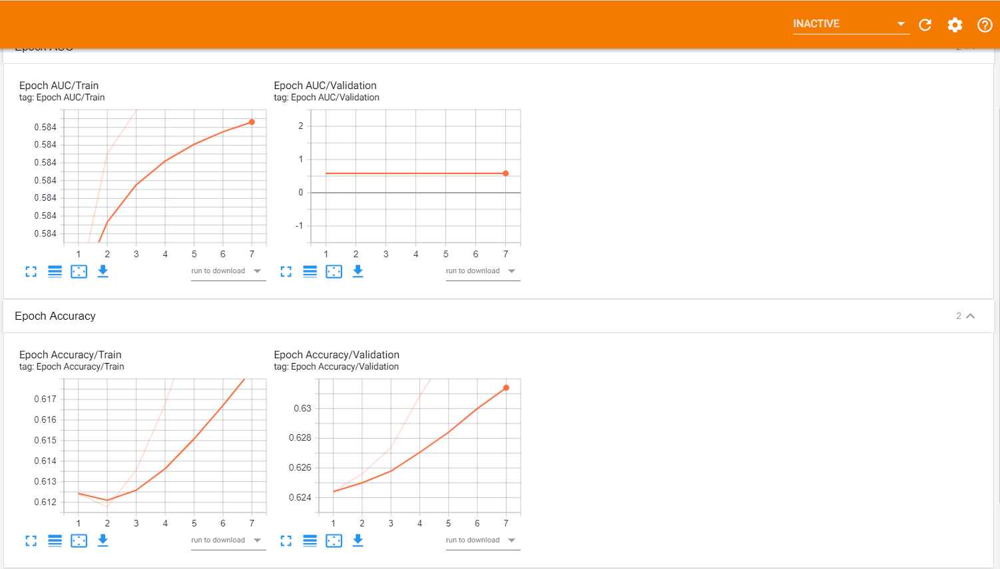

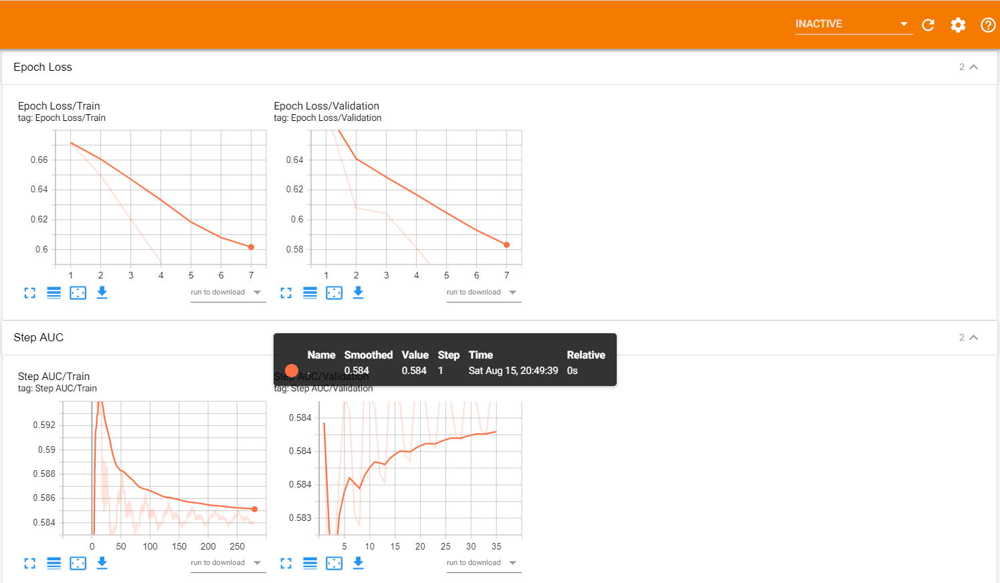

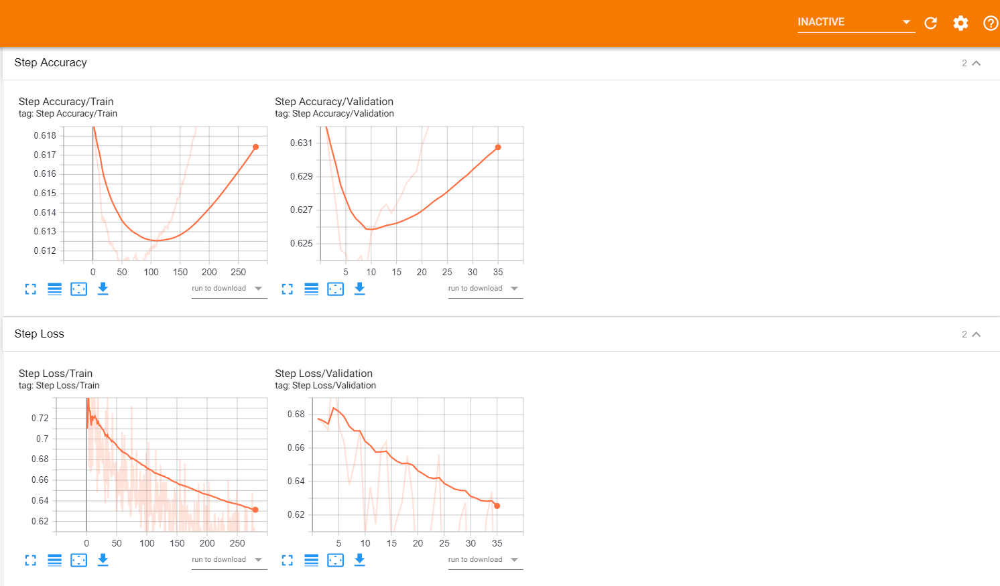

In [44]:
K.clear_session()
Init_LR=0.0001

loss_focal=tfa.losses.SigmoidFocalCrossEntropy(alpha = 0.25, gamma = 2.0,reduction=tf.keras.losses.Reduction.NONE)
optimizer = Adam(lr=Init_LR)
Opt_Adam =Adam(lr=Init_LR)

train_accuracy = tf.keras.metrics.BinaryAccuracy(name='train_accuracy')

val_accuracy = tf.keras.metrics.BinaryAccuracy(name='val_accuracy')

test_accuracy = tf.keras.metrics.BinaryAccuracy(name='test_accuracy')

In [77]:
# ROC-AUC Score
def AUC(y_true, y_pred):
    return tf.py_function(roc_auc_score, (y_true, y_pred), tf.double)

### CNN Based Model

#### Modeling with Focal cross entropy as loss function and metric as AUC 

In [45]:
class MP2(tf.keras.layers.Layer):   
    def __init__(self):
        super(MP2,self).__init__()
        self.MP=tf.keras.layers.MaxPool2D(2)              
    def call(self,inputs):
        return self.MP(inputs)
    
class Dr_Den(tf.keras.layers.Layer):
    def __init__(self,rate,**kwargs):
        super(Dr_Den,self).__init__(**kwargs)
        self.rate=rate
        self.Dens=tf.keras.layers.Dense(1,activation='sigmoid')
    def call(self,inputs):
        lay= tf.nn.dropout(inputs,rate=self.rate)
        lay= self.Dens(lay)
        return lay   

class CNNModel(tf.keras.Model):
    def __init__(self,rate,**kwargs):
        super(CNNModel,self).__init__()
        self.conv2D1 = tf.keras.layers.Conv2D(16,kernel_size=3, input_shape=(None,Img_Height,Img_Width,3),activation='relu') 
        self.Flat=tf.keras.layers.Flatten()
        self.MP2D=MP2()
        self.rate=rate
        self.Dens=Dr_Den(rate)
        
    def call(self, inputs, **kwargs):
        model=self.conv2D1(inputs)
        model=self.MP2D(model)
        model=self.Flat(model)
        model=self.Dens(model)
        return model

In [46]:
def UNSModelGTCNN(Epochs,checkpoint,manager,File_Name,modelc):
    
    start_time=time.clock()
    
    print("\nInitializing Parameters . . .")


    train_loss_results = []
    train_accuracy_results = []

    val_loss_results = []
    val_accuracy_results = []
    
    train_auc=[]
    val_auc=[]
   
    iepoch=0
    T_step=0
    V_step=0
    
    # Defining GradientTape
    
    @tf.function
    def GT(modelc,X_batch,Y_batch):    
        with tf.GradientTape() as tape:
            Y_Pred=modelc(X_batch, training=True)
            Y_batch=tf.cast(Y_batch,tf.float32)
            loss_values=loss_focal(Y_batch, Y_Pred)
            loss_values = tf.reduce_sum(loss_values) * (1. / 128)
            gradients=tape.gradient(loss_values, modelc.trainable_weights)
            Opt_Adam.apply_gradients(zip(gradients, modelc.trainable_weights))
        
            return loss_values,Y_Pred
    
    # Initializing the Identifiers
    
    train_log_dir = 'logs/GT/UNS_D169_' + File_Name + '/train'
    val_log_dir = 'logs/GT/UNS_D169_' + File_Name + '/val'
    summary_writer = tf.summary.create_file_writer(train_log_dir)
    #val_summary_writer = tf.summary.create_file_writer(val_log_dir)
    save_path='ModelsGT/UNS_D169_' + File_Name
    
    # Training the Model
    
    print("\nTraining the Model . . .")
    print("\nChecking for the Checkpoint Files . . .")
    
    # Checking for the Checkpoints
    checkpoint.restore(manager.latest_checkpoint)
    if manager.latest_checkpoint:
        print("\nFound . .  !\nRestoring . . ")
        print("\nRestored from {}".format(manager.latest_checkpoint))
        ind=manager.latest_checkpoint.find("ckpt")
        iepoch=int(manager.latest_checkpoint[(ind+5):])
        print("\nTraining from Epoch {}".format(int(iepoch)+1))
        T_step=iepoch*(len(x_train)//Batch_Size)
        V_step=iepoch*(len(x_test)//Batch_Size)
    else:
        print("\nNot Found . . !")
        print("\nTraining the Model From Scratch . . .")
    
    Epochs=Epochs+int(iepoch)
    for epoch in range(int(iepoch),Epochs):
       
        print("\nEpoch {}/{}".format(epoch+1, Epochs))
        print("[", end ="")
        c=0
        # for loop iterate over batches
        for (X_batch, y_batch) in (T_Data):
            
            y_batch=tf.reshape(y_batch, [-1,1])
                
            # GradientTape
            loss_values,y_pred=GT(modelc,X_batch,y_batch)
            
 
            train_accuracy(y_batch, y_pred)
            y_batch = tf.cast(y_batch, tf.float32)
            

            train_AUC=AUC(y_batch,y_pred)
            

            #train_loss_results.append(loss_values)
            train_accuracy_results.append(train_accuracy.result())
            train_auc.append(train_AUC)
            
            c+=1
            #train_accuracy.reset_states
            T_step+=1
        # Tensorboard Summary Writer    
            with summary_writer.as_default():
                tf.summary.scalar(f'Step Loss/Train', loss_values, step=T_step)
                tf.summary.scalar(f'Step Accuracy/Train', train_accuracy.result(), step=T_step)
                tf.summary.scalar('Step AUC/Train', train_AUC, step=T_step)
                
        with summary_writer.as_default():
            tf.summary.scalar(f'Epoch Loss/Train', loss_values, step=epoch+1)
            tf.summary.scalar(f'Epoch Accuracy/Train', train_accuracy.result(), step=epoch+1)
            tf.summary.scalar(f'Epoch AUC/Train', train_AUC, step=epoch+1)
            
        # For Loop Iterating ove Validation Data Batches
        for (X_batch, y_batch) in (V_Data):
        
           
                

            # GradientTape
            val_loss_values,y_pred=GT(modelc,X_batch,y_batch)

         
            val_accuracy(y_batch, y_pred)
            val_AUC=AUC(y_batch,y_pred)


            val_loss_results.append(val_loss_values)
            val_accuracy_results.append(val_accuracy.result())
            val_auc.append(val_AUC)
            
            c+=1
            #val_accuracy.reset_states
            V_step+=1
        # Tensorboard Summary Writer
            with summary_writer.as_default():
                tf.summary.scalar(f'Step Loss/Validation', val_loss_values, step=V_step)
                tf.summary.scalar(f'Step Accuracy/Validation', val_accuracy.result(), step=V_step)
                tf.summary.scalar(f'Step AUC/Validation', val_AUC, step=V_step)
        with summary_writer.as_default():
            tf.summary.scalar(f'Epoch Loss/Validation', val_loss_values, step=epoch+1)
            tf.summary.scalar(f'Epoch Accuracy/Validation', val_accuracy.result(), step=epoch+1)
            tf.summary.scalar(f'Epoch AUC/Validation', val_AUC, step=epoch+1)
            
        # Creating Checkpoint using tf.train.Checkpoint
        checkpoint = tf.train.Checkpoint(optimizer=Opt_Adam, model=modelc)
        print("]")
        Epoch_Stats = 'Training loss: {:.4f}, Training accuracy: {:.4f}, Train AUC: {:.4f} Validation loss: {:.4f}, Validation accuracy: {:.4f}, Validation AUC: {:.4f}'
        print(Epoch_Stats.format(loss_values,train_accuracy.result() * 100,train_AUC,val_loss_values,val_accuracy.result()*100,val_AUC))
    
        Checkpoint_save_path = manager.save()
        print("Saved Checkpoint for Epoch {}: {}".format(epoch+1, Checkpoint_save_path))
    #checkpoint.save(checkpoint_path+'/')
    z=modelc.predict(V_Data)
    # Saving the Model using tf.saved_model
    tf.saved_model.save(modelc,save_path+'/')
    
    # Displaying Information related to this run
    print("\n\nCorresponding Files to this Run : ")
    print("\nTensorBoard Log Files : logs/GT/UNS_D169_{}".format(File_Name))
    print("\nCheckpoint Files : CheckponitsGT/{}".format(File_Name))
    print("\nModel Files : {}".format(save_path))
        
    print("\n\nTime Taken For This Process : "+ str((time.clock()-start_time)) + " Sec")

In [47]:
def UNS_CNN(Init_LR,Dropout_Rate,Img_Height,Img_Width,Epochs,File_Name):
    
    # Initializing Optimizer
    
    print("\nInitializing Optimizer . . .")
    Opt_Adam =Adam(lr=Init_LR)
    
    # Building Model
    print("\nBuilding Model . . .")
    modelx = CNNModel(rate=Dropout_Rate)
    modelx.build(input_shape=(None, Img_Height,Img_Width,3))
    
    # Creating Checkpoint Objects
    checkpoint = tf.train.Checkpoint(optimizer=Opt_Adam,model=modelx)
    manager = tf.train.CheckpointManager(checkpoint, 'CheckponitsGT/UNS_D169_' + File_Name, max_to_keep=None)
    
    # Calling the Training Module
    K.clear_session()
    UNSModelGTCNN(Epochs=Epochs,checkpoint=checkpoint,manager=manager,File_Name=File_Name,modelc=modelx)

#### Model Using Dropout_Rate=0.5, Learning Rate=0.0001 and Epochs=7

In [48]:
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_CNN(Init_LR=0.0001,Dropout_Rate=0.5,Img_Height=96,Img_Width=96,Epochs=7,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/7
[]
Training loss: 0.0482, Training accuracy: 57.3457, Train AUC: 0.4974 Validation loss: 1.4410, Validation accuracy: 57.6082, Validation AUC: 0.5681
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200815-205054\ckpt-1

Epoch 2/7
[]
Training loss: 0.0418, Training accuracy: 57.3260, Train AUC: 0.6234 Validation loss: 1.4389, Validation accuracy: 58.2692, Validation AUC: 0.5832
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200815-205054\ckpt-2

Epoch 3/7
[]
Training loss: 0.0509, Training accuracy: 56.3597, Train AUC: 0.4506 Validation loss: 1.4184, Validation accuracy: 58.5417, Validation AUC: 0.4067
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200815-205054\ckpt-3

Epoch 4/7
[]
Training loss: 0.0465, Training accuracy: 55.6350, Train AUC: 0.5805 

### Tensor logs

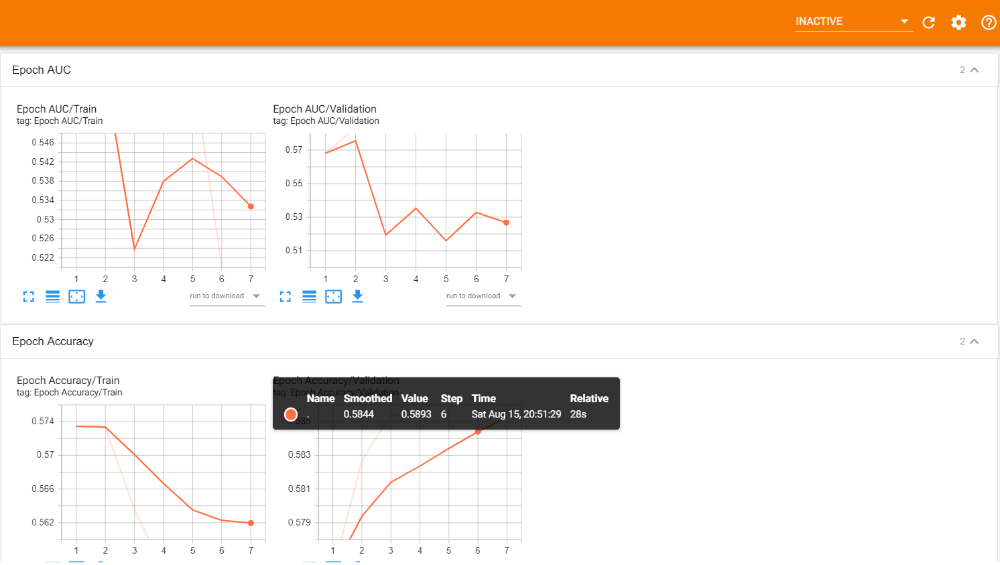

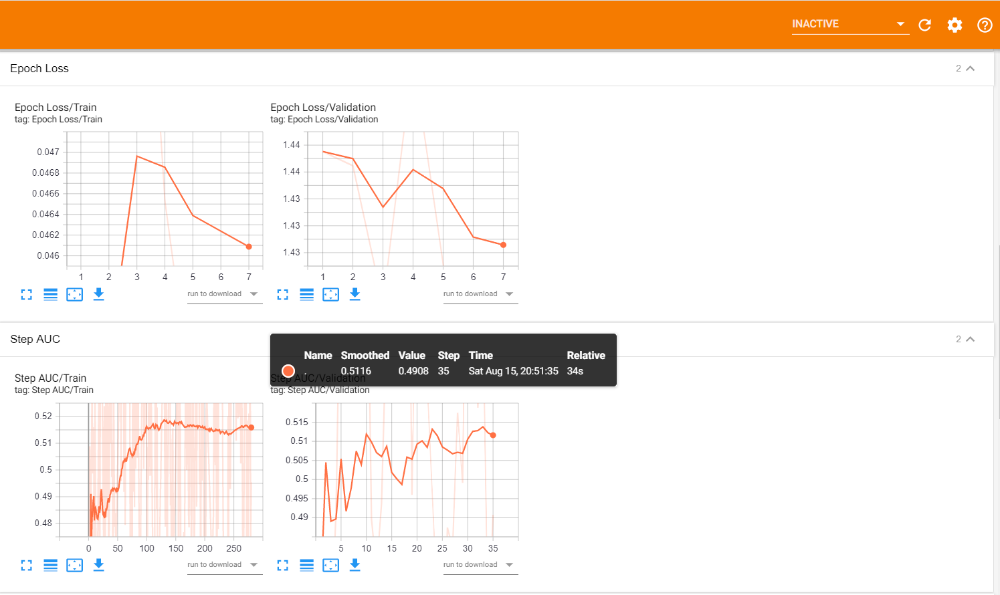

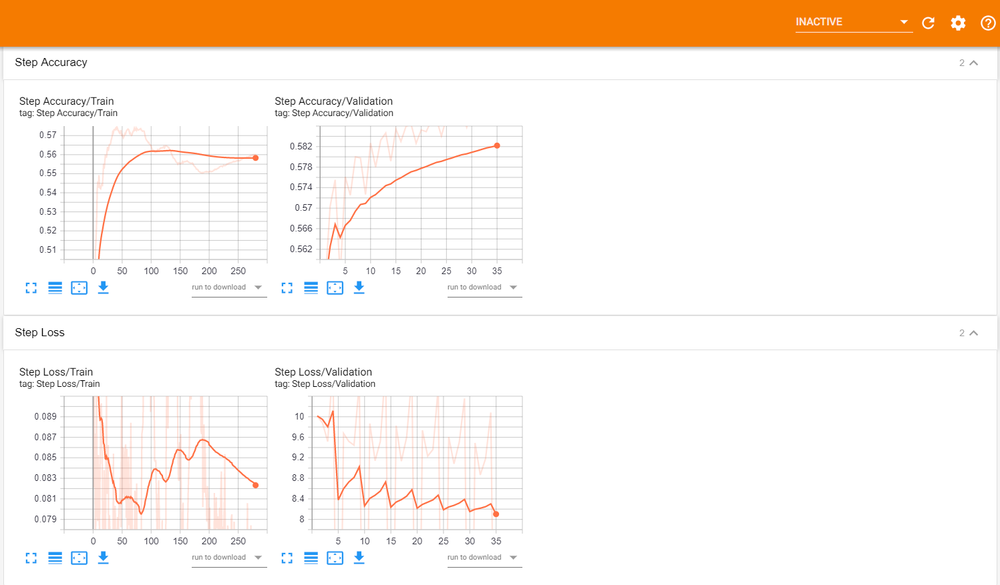

#### Modeling with focal cross entropy as loss function and metric as F1SCORE 

In [79]:
import tensorflow_addons as tfa
from tensorflow_addons.metrics import F1Score
F1S=tfa.metrics.F1Score(
    num_classes=2,
    average= "micro",
    name = 'f1_score'
)

In [50]:
class MP2(tf.keras.layers.Layer):   
    def __init__(self):
        super(MP2,self).__init__()
        self.MP=tf.keras.layers.MaxPool2D(2)              
    def call(self,inputs):
        return self.MP(inputs)
    
class Dr_Den(tf.keras.layers.Layer):
    def __init__(self,rate,**kwargs):
        super(Dr_Den,self).__init__(**kwargs)
        self.rate=rate
        self.Dens=tf.keras.layers.Dense(1,activation='sigmoid')
    def call(self,inputs):
        lay= tf.nn.dropout(inputs,rate=self.rate)
        lay= self.Dens(lay)
        return lay   

class CNNModel(tf.keras.Model):
    def __init__(self,rate,**kwargs):
        super(CNNModel,self).__init__()
        self.conv2D1 = tf.keras.layers.Conv2D(16,kernel_size=3, input_shape=(None,Img_Height,Img_Width,3),activation='relu') 
        self.Flat=tf.keras.layers.Flatten()
        self.MP2D=MP2()
        self.rate=rate
        self.Dens=Dr_Den(rate)
        
    def call(self, inputs, **kwargs):
        model=self.conv2D1(inputs)
        model=self.MP2D(model)
        model=self.Flat(model)
        model=self.Dens(model)
        return model

In [52]:
def UNSModelGTCNN(Epochs,checkpoint,manager,File_Name,modelc):
    
    start_time=time.clock()
    
    print("\nInitializing Parameters . . .")


    train_loss_results = []
    train_accuracy_results = []

    val_loss_results = []
    val_accuracy_results = []
    
    train_f1_score=[]
    val_f1_score=[]
   
    iepoch=0
    T_step=0
    V_step=0
    
    # Defining GradientTape
    
    @tf.function
    def GT(modelc,X_batch,Y_batch):    
        with tf.GradientTape() as tape:
            Y_Pred=modelc(X_batch, training=True)
            Y_batch=tf.cast(Y_batch,tf.float32)
            loss_values=loss_focal(Y_batch, Y_Pred)
            loss_values = tf.reduce_sum(loss_values) * (1. / 128)
            gradients=tape.gradient(loss_values, modelc.trainable_weights)
            Opt_Adam.apply_gradients(zip(gradients, modelc.trainable_weights))
        
            return loss_values,Y_Pred
    
    # Initializing the Identifiers
    
    train_log_dir = 'logs/GT/UNS_D169_' + File_Name + '/train'
    val_log_dir = 'logs/GT/UNS_D169_' + File_Name + '/val'
    summary_writer = tf.summary.create_file_writer(train_log_dir)
    #val_summary_writer = tf.summary.create_file_writer(val_log_dir)
    save_path='ModelsGT/UNS_D169_' + File_Name
    
    # Training the Model
    
    print("\nTraining the Model . . .")
    print("\nChecking for the Checkpoint Files . . .")
    
    # Checking for the Checkpoints
    checkpoint.restore(manager.latest_checkpoint)
    if manager.latest_checkpoint:
        print("\nFound . .  !\nRestoring . . ")
        print("\nRestored from {}".format(manager.latest_checkpoint))
        ind=manager.latest_checkpoint.find("ckpt")
        iepoch=int(manager.latest_checkpoint[(ind+5):])
        print("\nTraining from Epoch {}".format(int(iepoch)+1))
        T_step=iepoch*(len(x_train)//Batch_Size)
        V_step=iepoch*(len(x_test)//Batch_Size)
    else:
        print("\nNot Found . . !")
        print("\nTraining the Model From Scratch . . .")
    
    Epochs=Epochs+int(iepoch)
    for epoch in range(int(iepoch),Epochs):
       
        print("\nEpoch {}/{}".format(epoch+1, Epochs))
        print("[", end ="")
        c=0
        # for loop iterate over batches
        for (X_batch, y_batch) in (T_Data):
            y_batch=tf.reshape(y_batch, [-1,1])
                
        
            # GradientTape
            loss_values,y_pred=GT(modelc,X_batch,y_batch)
            
            

            #train_loss(loss_values)
            train_accuracy(y_batch, y_pred)
            y_batch = tf.cast(y_batch, tf.float32)
            

            train_f1_SCORE=F1S(y_batch,y_pred)
            

            #train_loss_results.append(loss_values)
            train_accuracy_results.append(train_accuracy.result())
            train_f1_score.append(train_f1_SCORE)
            
            c+=1
            #train_accuracy.reset_states
            T_step+=1
        # Tensorboard Summary Writer    
            with summary_writer.as_default():
                tf.summary.scalar(f'Step Loss/Train', loss_values, step=T_step)
                tf.summary.scalar(f'Step Accuracy/Train', train_accuracy.result(), step=T_step)
                tf.summary.scalar('Step AUC/Train', train_f1_SCORE, step=T_step)
                
        with summary_writer.as_default():
            tf.summary.scalar(f'Epoch Loss/Train', loss_values, step=epoch+1)
            tf.summary.scalar(f'Epoch Accuracy/Train', train_accuracy.result(), step=epoch+1)
            tf.summary.scalar(f'Epoch AUC/Train', train_f1_SCORE, step=epoch+1)
            
        # For Loop Iterating ove Validation Data Batches
        for (X_batch, y_batch) in (V_Data):
        
           
                

            # GradientTape
            val_loss_values,y_pred=GT(modelc,X_batch,y_batch)

            val_loss(val_loss_values)
            val_accuracy(y_batch, y_pred)
            val_f1_SCORE=F1S(y_batch,y_pred)


            val_loss_results.append(val_loss_values)
            val_accuracy_results.append(val_accuracy.result())
            val_f1_score.append(val_f1_SCORE)
            
            c+=1
            #val_accuracy.reset_states
            V_step+=1
        # Tensorboard Summary Writer
            with summary_writer.as_default():
                tf.summary.scalar(f'Step Loss/Validation', val_loss_values, step=V_step)
                tf.summary.scalar(f'Step Accuracy/Validation', val_accuracy.result(), step=V_step)
                tf.summary.scalar(f'Step AUC/Validation', val_f1_SCORE, step=V_step)
        with summary_writer.as_default():
            tf.summary.scalar(f'Epoch Loss/Validation', val_loss_values, step=epoch+1)
            tf.summary.scalar(f'Epoch Accuracy/Validation', val_accuracy.result(), step=epoch+1)
            tf.summary.scalar(f'Epoch AUC/Validation', val_f1_SCORE, step=epoch+1)
            
        # Creating Checkpoint using tf.train.Checkpoint
        checkpoint = tf.train.Checkpoint(optimizer=Opt_Adam, model=modelc)
        print("]")
        Epoch_Stats = 'Training loss: {:.4f}, Training accuracy: {:.4f}, Train 1! SCORE: {:.4f} Validation loss: {:.4f}, Validation accuracy: {:.4f}, Validation F1 SCORE: {:.4f}'
        print(Epoch_Stats.format(loss_values,train_accuracy.result() * 100,train_f1_SCORE,val_loss_values,val_accuracy.result()*100,val_f1_SCORE))
    
        Checkpoint_save_path = manager.save()
        print("Saved Checkpoint for Epoch {}: {}".format(epoch+1, Checkpoint_save_path))
    #checkpoint.save(checkpoint_path+'/')
    z=modelc.predict(V_Data)
    # Saving the Model using tf.saved_model
    tf.saved_model.save(modelc,save_path+'/')
    
    # Displaying Information related to this run
    print("\n\nCorresponding Files to this Run : ")
    print("\nTensorBoard Log Files : logs/GT/UNS_D169_{}".format(File_Name))
    print("\nCheckpoint Files : CheckponitsGT/{}".format(File_Name))
    print("\nModel Files : {}".format(save_path))
        
    print("\n\nTime Taken For This Process : "+ str((time.clock()-start_time)) + " Sec")

In [53]:
def UNS_CNN(Init_LR,Dropout_Rate,Img_Height,Img_Width,Epochs,File_Name):
    
    # Initializing Optimizer
    
    print("\nInitializing Optimizer . . .")
    Opt_Adam =Adam(lr=Init_LR)
    
    # Building Model
    print("\nBuilding Model . . .")
    modelx = CNNModel(rate=Dropout_Rate)
    modelx.build(input_shape=(None, Img_Height,Img_Width,3))
    
    # Creating Checkpoint Objects
    checkpoint = tf.train.Checkpoint(optimizer=Opt_Adam,model=modelx)
    manager = tf.train.CheckpointManager(checkpoint, 'CheckponitsGT/UNS_D169_' + File_Name, max_to_keep=None)
    
    # Calling the Training Module
    K.clear_session()
    UNSModelGTCNN(Epochs=Epochs,checkpoint=checkpoint,manager=manager,File_Name=File_Name,modelc=modelx)

#### Model Using Dropout_Rate=0.5, Learning Rate=0.0001 and Epochs=7

In [54]:
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_CNN(Init_LR=0.0001,Dropout_Rate=0.5,Img_Height=96,Img_Width=96,Epochs=7,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/7
[]
Training loss: 0.0441, Training accuracy: 56.2340, Train 1! SCORE: 0.5837 Validation loss: 1.5840, Validation accuracy: 59.0204, Validation F1 SCORE: 0.5893
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200815-205136\ckpt-1

Epoch 2/7
[]
Training loss: 0.0424, Training accuracy: 56.4342, Train 1! SCORE: 0.5889 Validation loss: 1.4237, Validation accuracy: 59.0625, Validation F1 SCORE: 0.5893
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200815-205136\ckpt-2

Epoch 3/7
[]
Training loss: 0.0463, Training accuracy: 56.6496, Train 1! SCORE: 0.5891 Validation loss: 1.4431, Validation accuracy: 59.0649, Validation F1 SCORE: 0.5893
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200815-205136\ckpt-3

Epoch 4/7
[]
Training loss: 0.0469, Training accurac

### Tensor logs

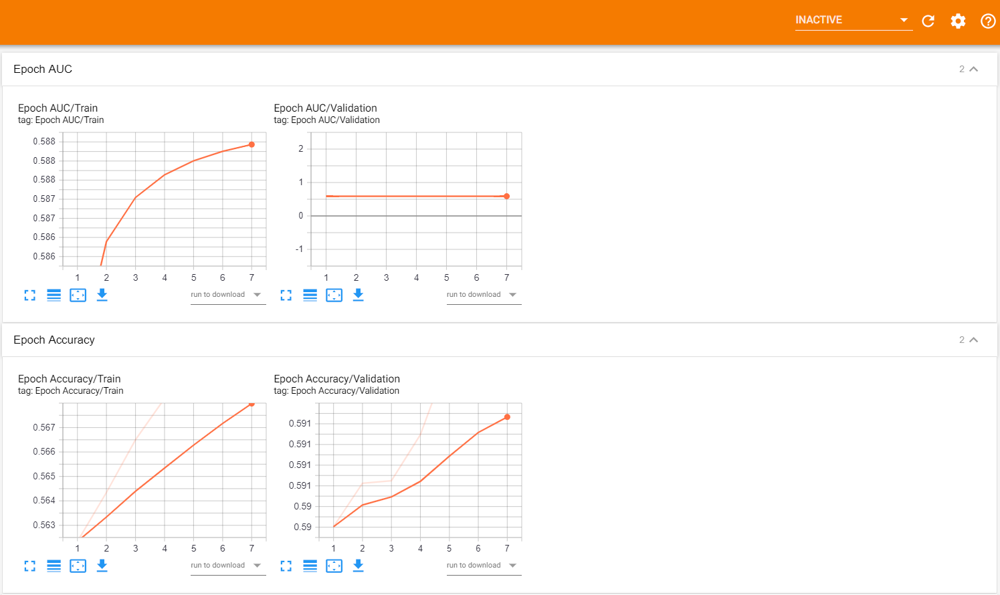

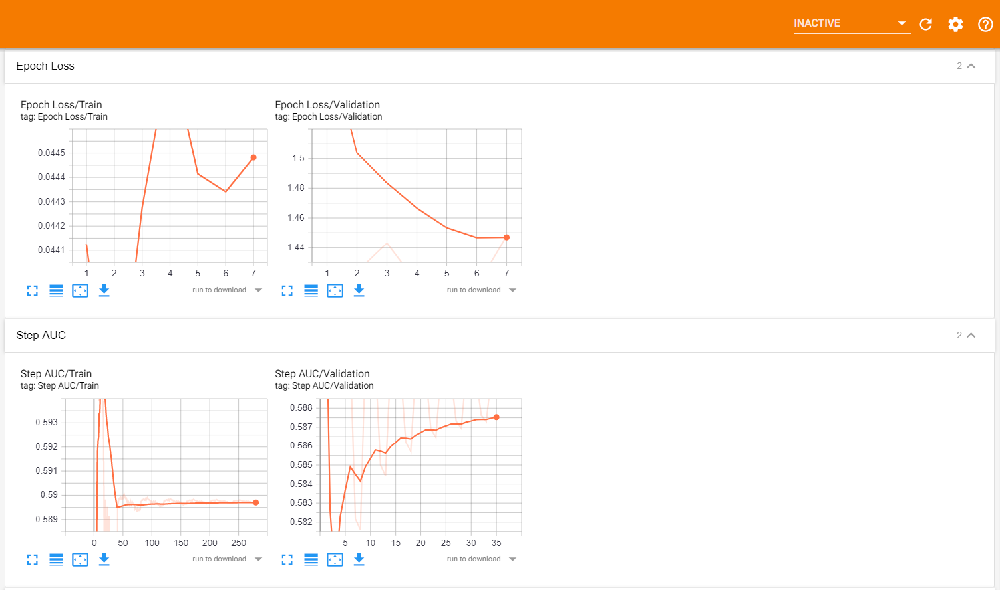

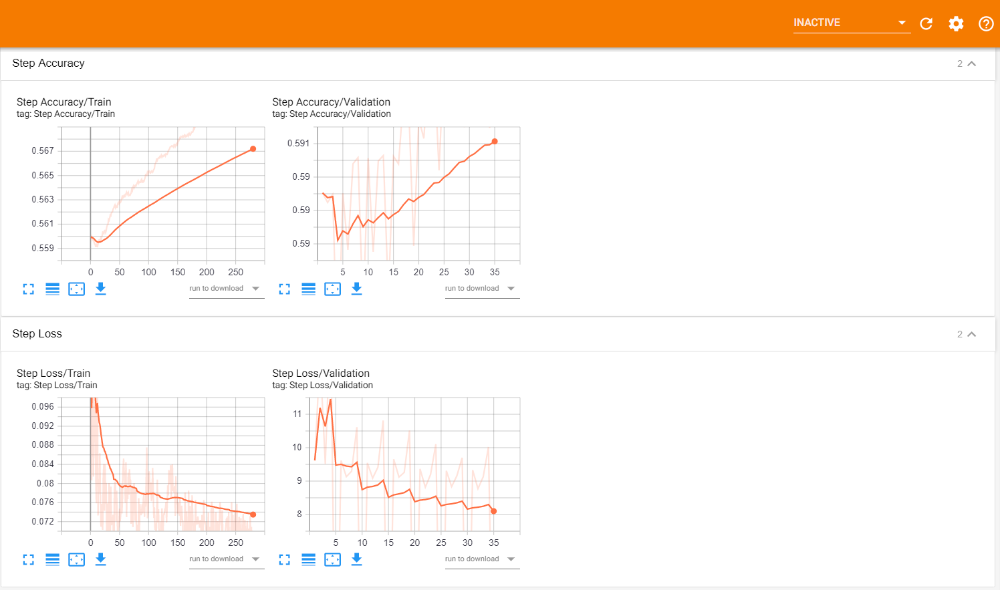

### Transfer Learning Based Model

- Densenet Model

<b>Referred : </b>

 - https://www.tensorflow.org/guide/keras/custom_layers_and_models
 - https://www.pyimagesearch.com/2019/10/28/3-ways-to-create-a-keras-model-with-tensorflow-2-0-sequential-functional-and-model-subclassing/
 - https://medium.com/tensorflow/what-are-symbolic-and-imperative-apis-in-tensorflow-2-0-dfccecb01021
 - https://github.com/tensorflow/tensorflow/issues/32895
 - https://github.com/flyyufelix/DenseNet-Keras/blob/master/densenet169.py
 - https://github.com/tensorflow/tensorflow/issues/25036

In [76]:
K.clear_session()
Init_LR=0.0001
loss = tf.keras.losses.BinaryCrossentropy()

optimizer = Adam(lr=Init_LR)
Opt_Adam =Adam(lr=Init_LR)

train_loss = tf.keras.metrics.Mean(name='train_loss')
train_accuracy = tf.keras.metrics.BinaryAccuracy(name='train_accuracy')

val_loss = tf.keras.metrics.Mean(name='val_loss')
val_accuracy = tf.keras.metrics.BinaryAccuracy(name='val_accuracy')

test_loss = tf.keras.metrics.Mean(name='test_loss')
test_accuracy = tf.keras.metrics.BinaryAccuracy(name='test_accuracy')

In [78]:
# ROC-AUC Score
def AUC(y_true, y_pred):
    return tf.py_function(roc_auc_score, (y_true, y_pred), tf.double)

### Modelling with Binary Cross Entropy as Loss Function and AUC as Metric

In [67]:
class GMP2(tf.keras.layers.Layer):   
    def __init__(self):
        super(GMP2,self).__init__()
        self.GMP=tf.keras.layers.GlobalMaxPooling2D()              
    def call(self,inputs):
        return self.GMP(inputs)
    
class GAP2(tf.keras.layers.Layer):   
    def __init__(self):
        super(GAP2,self).__init__()
        self.GAP=tf.keras.layers.GlobalAveragePooling2D()              
    def call(self,inputs):
        return self.GAP(inputs)
    
class Dr_Den(tf.keras.layers.Layer):
    def __init__(self,rate,**kwargs):
        super(Dr_Den,self).__init__(**kwargs)
        self.rate=rate
        self.Dens=tf.keras.layers.Dense(1,activation='sigmoid')
    def call(self,inputs):
        lay= tf.nn.dropout(inputs,rate=self.rate)
        lay= self.Dens(lay)
        return lay   

class MyModel(tf.keras.Model):
    def __init__(self,rate,**kwargs):
        super(MyModel,self).__init__()
        self.densenet = tf.keras.applications.DenseNet169(input_shape=(Img_Height,Img_Width,3),include_top=False,weights='imagenet')
        self.GMP2D=GMP2()
        self.GAP2D=GAP2()
        self.Flat=tf.keras.layers.Flatten()
        self.Concat=tf.keras.layers.Concatenate(axis=1)
        self.rate=rate
        self.Dens=Dr_Den(rate)
        
    def call(self, inputs, **kwargs):
        model=self.densenet(inputs)
        m1=self.GMP2D(model)
        m2=self.GAP2D(model)
        m3=self.Flat(model)
        model=self.Concat([m1,m2,m3])
        model=self.Dens(model)
        return model

In [68]:
#https://www.tensorflow.org/tutorials/distribute/save_and_load
def UNSModelGT(Epochs,checkpoint,manager,File_Name,modelc):
    
    start_time=time.clock()
    
    print("\nInitializing Parameters . . .")


    train_loss_results = []
    train_accuracy_results = []

    val_loss_results = []
    val_accuracy_results = []
    
    train_auc=[]
    val_auc=[]
    
    iepoch=0
    T_step=0
    V_step=0
    
    # Defining GradientTape
    
    @tf.function
    def GT(modelc,X_batch,Y_batch):    
        with tf.GradientTape() as tape:
            Y_Pred=modelc(X_batch, training=True)
            loss_values=loss(Y_batch, Y_Pred)
            gradients=tape.gradient(loss_values, modelc.trainable_weights)
            Opt_Adam.apply_gradients(zip(gradients, modelc.trainable_weights))
        
            return loss_values,Y_Pred
        
    
    
    # Initializing the Identifiers
    
    train_log_dir = 'logs/GT/UNS_D169_' + File_Name + '/train'
    summary_writer = tf.summary.create_file_writer(train_log_dir)
    save_path='ModelsGT/UNS_D169_' + File_Name
    
    # Training the Model
    
    print("\nTraining the Model . . .")
    print("\nChecking for the Checkpoint Files . . .")
    
    # Checking for the Checkpoints
    checkpoint.restore(manager.latest_checkpoint)
    if manager.latest_checkpoint:
        print("\nFound . .  !\nRestoring . . ")
        print("\nRestored from {}".format(manager.latest_checkpoint))
        ind=manager.latest_checkpoint.find("ckpt")
        iepoch=int(manager.latest_checkpoint[(ind+5):])
        print("\nTraining from Epoch {}".format(int(iepoch)+1))
        T_step=iepoch*(len(x_train)//Batch_Size)
        V_step=iepoch*(len(x_test)//Batch_Size)
    else:
        print("\nNot Found . . !")
        print("\nTraining the Model From Scratch . . .")
    
    Epochs=Epochs+int(iepoch)
    for epoch in range(int(iepoch),Epochs):

        print("\nEpoch {}/{}".format(epoch+1, Epochs))
        print("[", end ="")
        c=0
        # for loop iterate over batches
        for (X_batch, y_batch) in (T_Data):
        
            
               
        
            # GradientTape
            loss_values,y_pred=GT(modelc,X_batch,y_batch)

            train_loss(loss_values)
            train_accuracy(y_batch, y_pred)
            train_AUC=AUC(y_batch,y_pred)
            

            train_loss_results.append(loss_values)
            train_accuracy_results.append(train_accuracy.result())
            train_auc.append(train_AUC)
            
            c+=1
            T_step+=1
            #train_accuracy.reset_states
            with summary_writer.as_default():
                tf.summary.scalar(f'Step Loss/Train', loss_values, step=T_step)
                tf.summary.scalar(f'Step Accuracy/Train', train_accuracy.result(), step=T_step)
                tf.summary.scalar(f'Step AUC/Train', train_AUC, step=T_step)
        # Tensorboard Summary Writer    
        with summary_writer.as_default():
            tf.summary.scalar(f'Epoch Loss/Train', loss_values, step=epoch)
            tf.summary.scalar(f'Epoch Accuracy/Train', train_accuracy.result(), step=epoch+1)
            tf.summary.scalar(f'Epoch AUC/Train', train_AUC, step=epoch+1)
        
        # For Loop Iterating ove Validation Data Batches
        for (X_batch, y_batch) in (V_Data):

            # GradientTape
            val_loss_values,y_pred=GT(modelc,X_batch,y_batch)

            val_loss(val_loss_values)
            val_accuracy(y_batch, y_pred)
            val_AUC=AUC(y_batch,y_pred)


            val_loss_results.append(val_loss_values)
            val_accuracy_results.append(val_accuracy.result())
            val_auc.append(val_AUC)
            
            c+=1
            V_step+=1
            #val_accuracy.reset_states
            
            with summary_writer.as_default():
                tf.summary.scalar(f'Step Loss/Validation', val_loss_values, step=V_step)
                tf.summary.scalar(f'Step Accuracy/Validation', val_accuracy.result(), step=V_step)
                tf.summary.scalar(f'Step AUC/Validation', val_AUC, step=V_step)
        
        # Tensorboard Summary Writer
        with summary_writer.as_default():
            tf.summary.scalar(f'Epoch Loss/Validation', val_loss_values, step=epoch+1)
            tf.summary.scalar(f'Epoch Accuracy/Validation', val_accuracy.result(), step=epoch+1)
            tf.summary.scalar(f'Epoch AUC/Validation', val_AUC, step=epoch+1)

        # Creating Checkpoint using tf.train.Checkpoint
        checkpoint = tf.train.Checkpoint(optimizer=Opt_Adam, model=modelc)
        print("]")
        Epoch_Stats = 'Training loss: {:.4f}, Training accuracy: {:.4f}, Train AUC: {:.4f} Validation loss: {:.4f}, Validation accuracy: {:.4f}, Validation AUC: {:.4f}'
        print(Epoch_Stats.format(loss_values,train_accuracy.result() * 100,train_AUC,val_loss_values,val_accuracy.result()*100,val_AUC))
    
        Checkpoint_save_path = manager.save()
        print("Saved Checkpoint for Epoch {}: {}".format(epoch+1, Checkpoint_save_path))
    #checkpoint.save(checkpoint_path+'/')
    z=modelc.predict(V_Data)
    # Saving the Model using tf.saved_model
    tf.saved_model.save(modelc,save_path+'/')
    
    # Displaying Information related to this run
    print("\n\nCorresponding Files to this Run : ")
    print("\nTensorBoard Log Files : logs/GT/UNS_D169_{}".format(File_Name))
    print("\nCheckpoint Files : CheckponitsGT/{}".format(File_Name))
    print("\nModel Files : {}".format(save_path))
        
    print("\n\nTime Taken For This Process : "+ str((time.clock()-start_time)) + " Sec")

In [69]:
def UNS_D169(Init_LR,Dropout_Rate,Img_Height,Img_Width,Epochs,File_Name):
    
    # Initializing Optimizer
    
    print("\nInitializing Optimizer . . .")
    Opt_Adam =Adam(lr=Init_LR)
    
    # Building Model
    print("\nBuilding Model . . .")
    modelx = MyModel(rate=Dropout_Rate)
    modelx.build(input_shape=(None, Img_Height,Img_Width,3))
    
    # Creating Checkpoint Objects
    checkpoint = tf.train.Checkpoint(optimizer=Opt_Adam,model=modelx)
    manager = tf.train.CheckpointManager(checkpoint, 'CheckponitsGT/UNS_D169_' + File_Name, max_to_keep=None)
    
    # Calling the Training Module
    K.clear_session()
    UNSModelGT(Epochs=Epochs,checkpoint=checkpoint,manager=manager,File_Name=File_Name,modelc=modelx)

#### Model Using Dropout_Rate=0.5, Learning Rate=0.001 and Epochs=8

In [70]:
K.clear_session()
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_D169(Init_LR=0.001,Dropout_Rate=0.5,Img_Height=96,Img_Width=96,Epochs=8,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/8
[]
Training loss: 0.8840, Training accuracy: 56.1385, Train AUC: 0.5864 Validation loss: 0.6503, Validation accuracy: 58.9303, Validation AUC: 0.6437
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200815-213034\ckpt-1

Epoch 2/8
[]
Training loss: 0.3908, Training accuracy: 62.8551, Train AUC: 0.8955 Validation loss: 0.3173, Validation accuracy: 67.8425, Validation AUC: 0.9328
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200815-213034\ckpt-2

Epoch 3/8
[]
Training loss: 0.2211, Training accuracy: 69.1082, Train AUC: 0.9727 Validation loss: 0.1363, Validation accuracy: 74.2949, Validation AUC: 0.9933
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200815-213034\ckpt-3

Epoch 4/8
[]
Training loss: 0.1649, Training accuracy: 74.0847, Train AUC: 0.9857 

#### Tensor logs

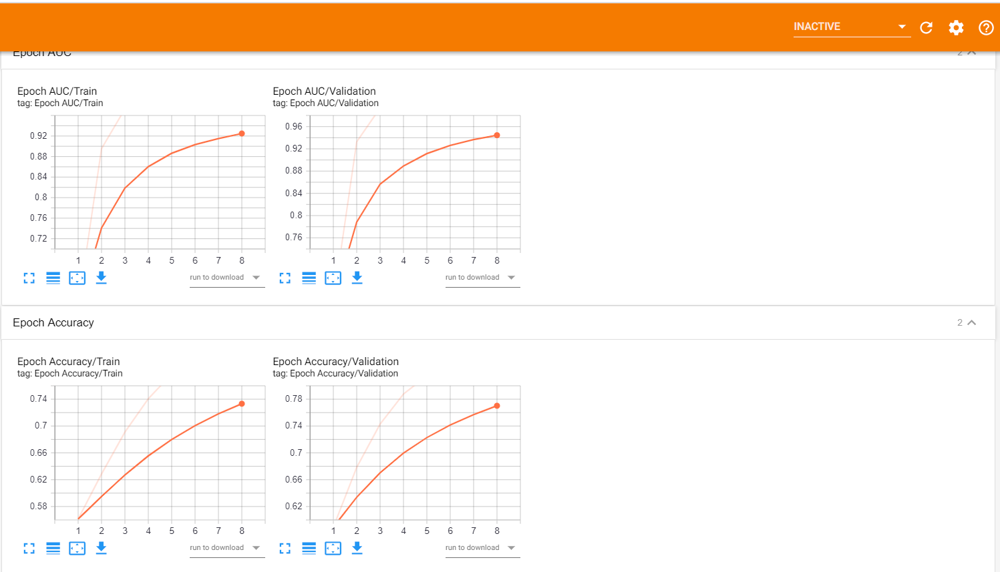

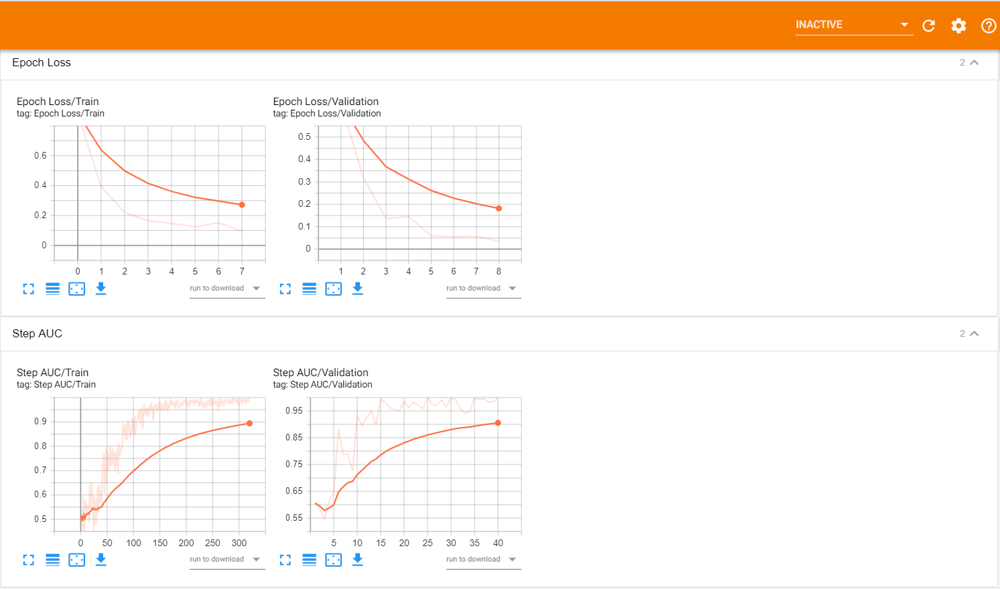

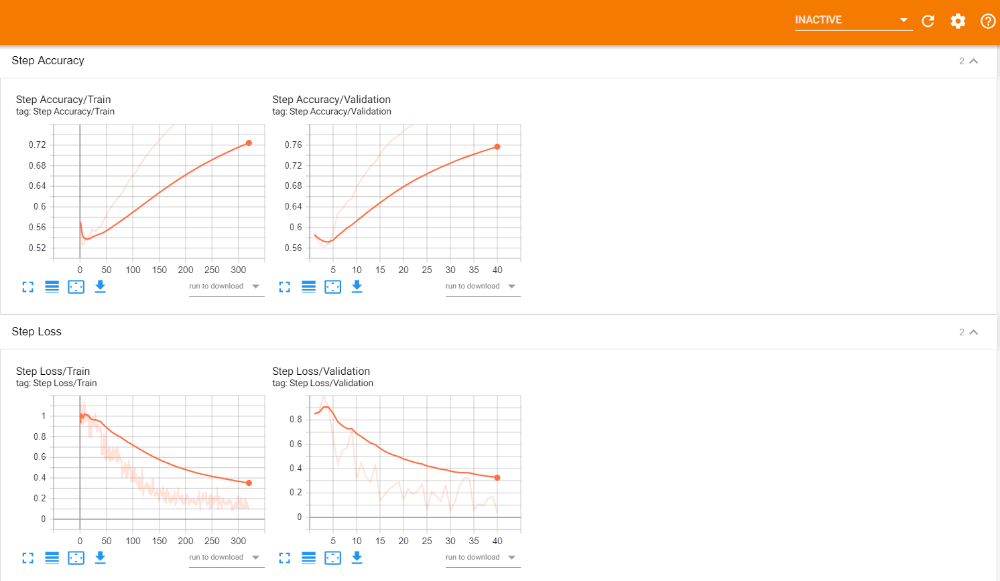

#### Model Using Dropout_Rate=0.5, Learning Rate=0.0001 and Epochs=10

In [71]:
K.clear_session()
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_D169(Init_LR=0.0001,Dropout_Rate=0.5,Img_Height=96,Img_Width=96,Epochs=10,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/10
[]
Training loss: 0.7891, Training accuracy: 80.8862, Train AUC: 0.6682 Validation loss: 0.8155, Validation accuracy: 83.4095, Validation AUC: 0.7025
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200815-213414\ckpt-1

Epoch 2/10
[]
Training loss: 0.6279, Training accuracy: 79.3325, Train AUC: 0.7766 Validation loss: 0.4416, Validation accuracy: 82.3558, Validation AUC: 0.8370
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200815-213414\ckpt-2

Epoch 3/10
[]
Training loss: 0.4910, Training accuracy: 78.7590, Train AUC: 0.8623 Validation loss: 0.2078, Validation accuracy: 82.2006, Validation AUC: 0.9782
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200815-213414\ckpt-3

Epoch 4/10
[]
Training loss: 0.2471, Training accuracy: 79.2537, Train AUC: 0.9

### Tensorboard Log files

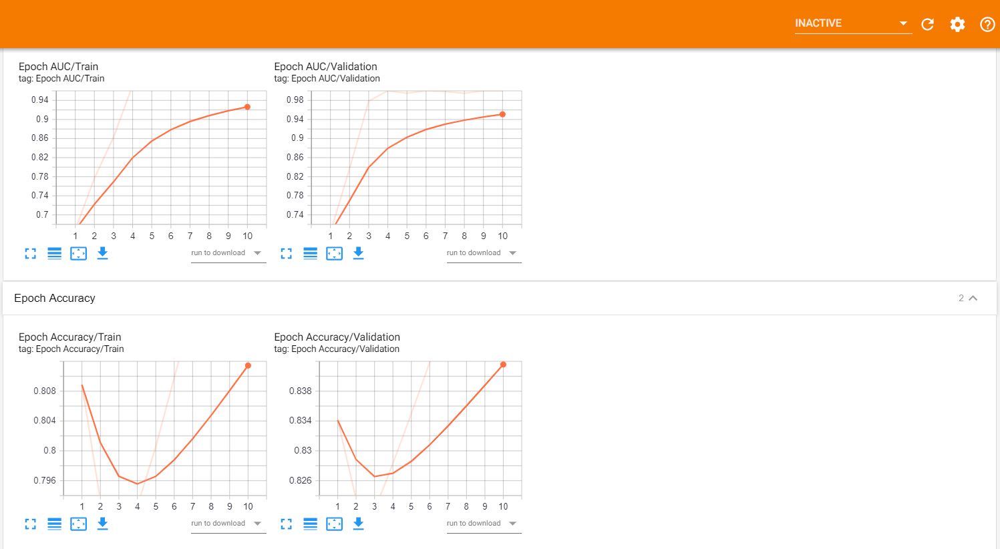

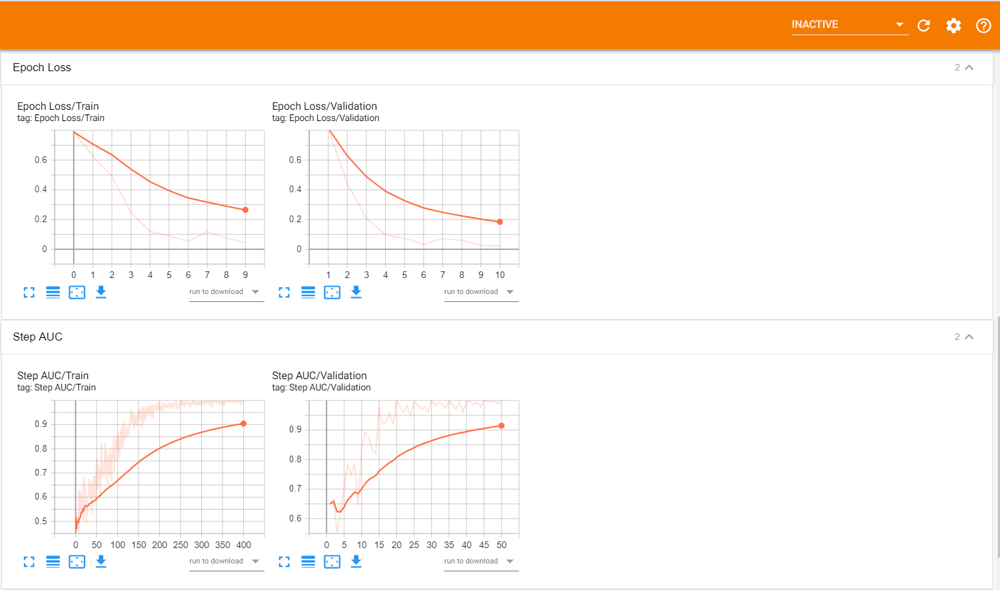

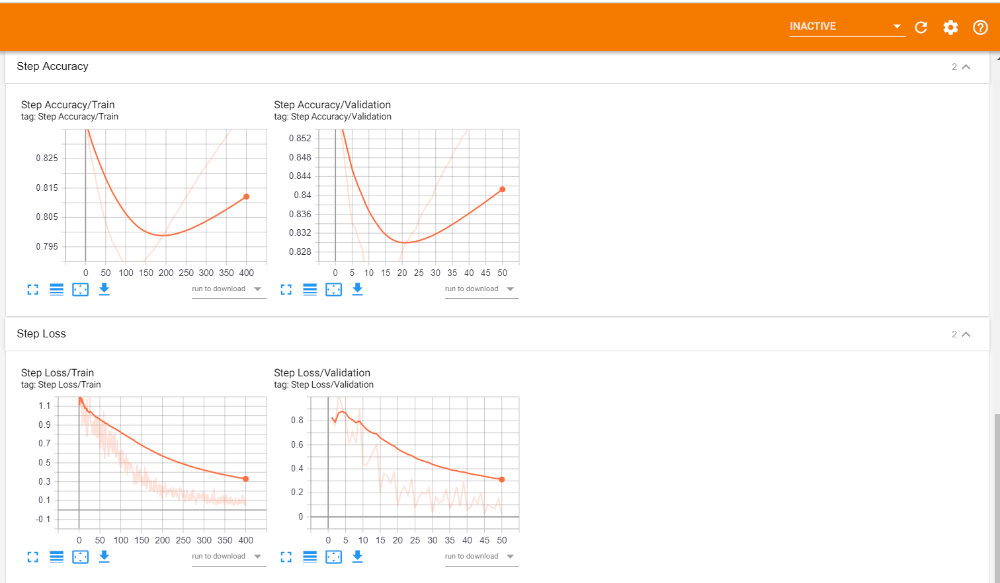

#### Model Using Dropout_Rate=0.5, Learning Rate=0.01 and Epochs=10

In [72]:
K.clear_session()
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_D169(Init_LR=0.01,Dropout_Rate=0.5,Img_Height=96,Img_Width=96,Epochs=15,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/15
[]
Training loss: 0.6700, Training accuracy: 82.7720, Train AUC: 0.6675 Validation loss: 0.8622, Validation accuracy: 85.3808, Validation AUC: 0.6252
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200815-213830\ckpt-1

Epoch 2/15
[]
Training loss: 0.5376, Training accuracy: 81.9367, Train AUC: 0.7877 Validation loss: 0.7028, Validation accuracy: 84.4141, Validation AUC: 0.7445
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200815-213830\ckpt-2

Epoch 3/15
[]
Training loss: 0.4697, Training accuracy: 81.4638, Train AUC: 0.8390 Validation loss: 0.2980, Validation accuracy: 84.0230, Validation AUC: 0.9815
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200815-213830\ckpt-3

Epoch 4/15
[]
Training loss: 0.2768, Training accuracy: 81.2730, Train AUC: 0.9

#### Tensorboard Log Files

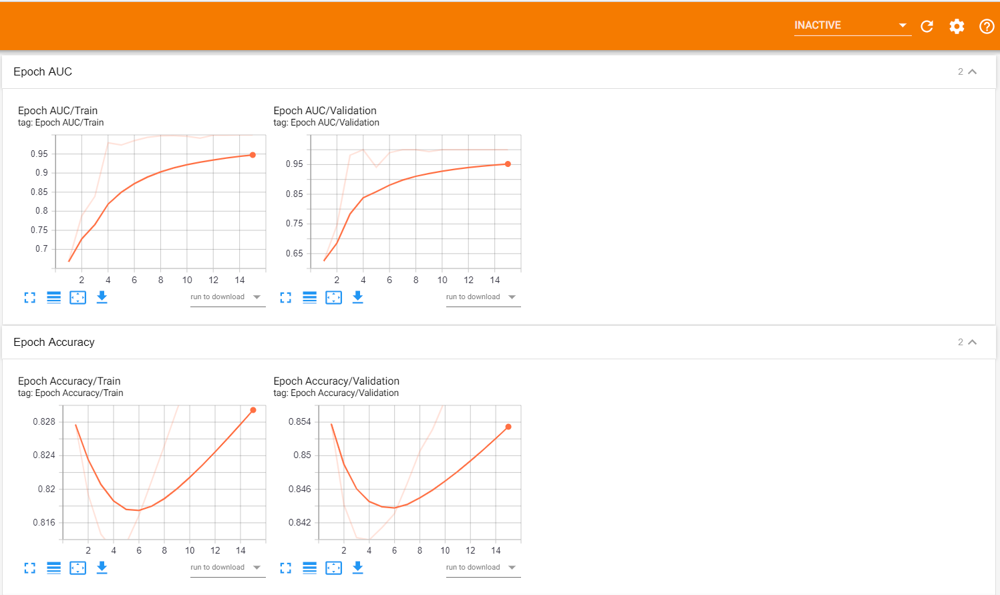

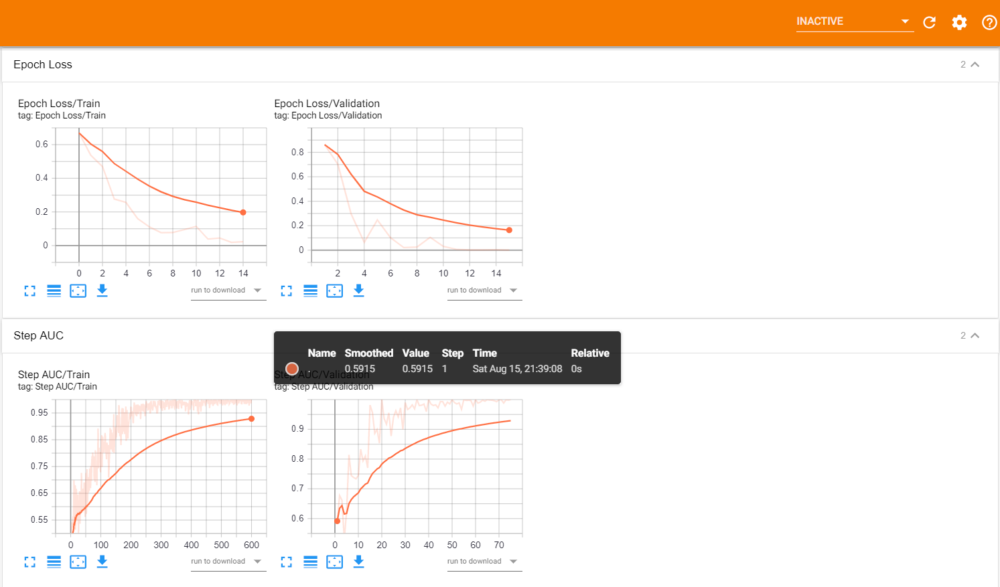

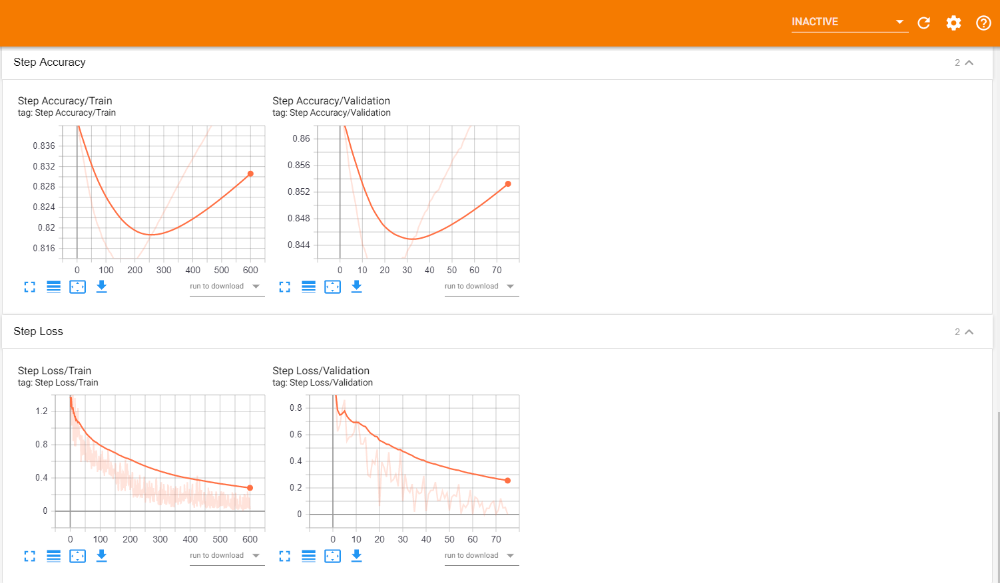

#### Model Using Dropout_Rate=0.4, Learning Rate=0.0001 and Epochs=10

In [73]:
K.clear_session()
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_D169(Init_LR=0.0001,Dropout_Rate=0.4,Img_Height=96,Img_Width=96,Epochs=10,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/10
[]
Training loss: 0.6678, Training accuracy: 84.5132, Train AUC: 0.6253 Validation loss: 0.6769, Validation accuracy: 86.5607, Validation AUC: 0.5479
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200815-214359\ckpt-1

Epoch 2/10
[]
Training loss: 0.7594, Training accuracy: 83.9047, Train AUC: 0.7377 Validation loss: 0.5785, Validation accuracy: 85.9612, Validation AUC: 0.7782
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200815-214359\ckpt-2

Epoch 3/10
[]
Training loss: 0.6831, Training accuracy: 83.4410, Train AUC: 0.8338 Validation loss: 0.3997, Validation accuracy: 85.5539, Validation AUC: 0.9025
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200815-214359\ckpt-3

Epoch 4/10
[]
Training loss: 0.7197, Training accuracy: 83.0362, Train AUC: 0.7

#### Tensorboard Log Files

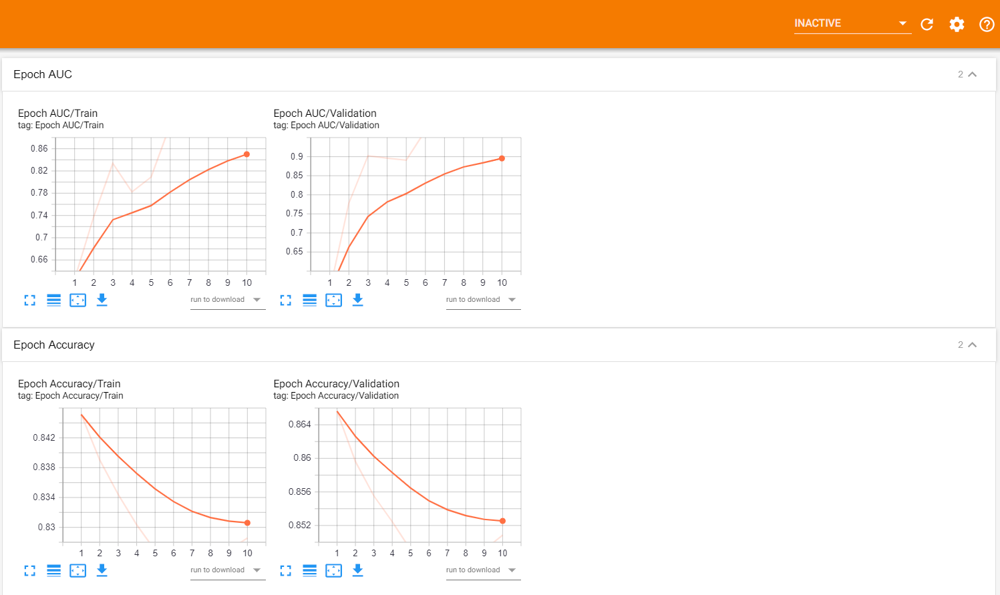

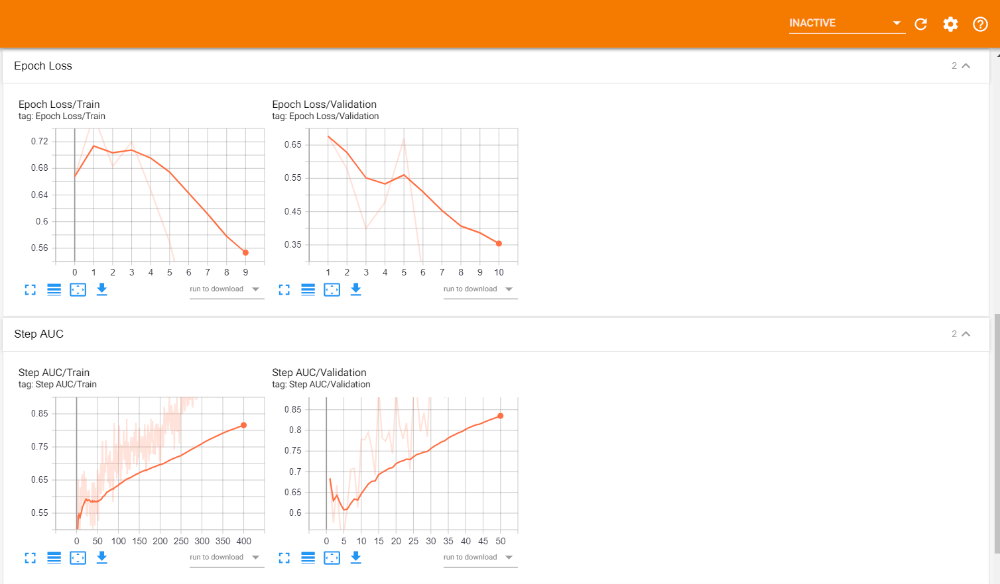

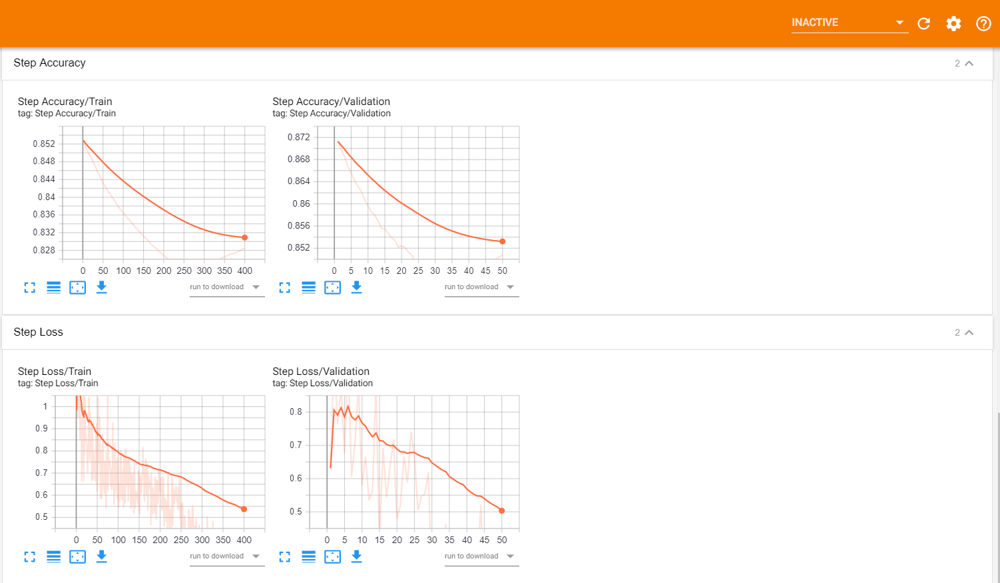

#### Model Using Dropout_Rate=0.4, Learning Rate=0.001 and Epochs=7

In [74]:
K.clear_session()
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_D169(Init_LR=0.001,Dropout_Rate=0.4,Img_Height=96,Img_Width=96,Epochs=7,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/7
[]
Training loss: 0.8199, Training accuracy: 82.2885, Train AUC: 0.7006 Validation loss: 0.7752, Validation accuracy: 84.4908, Validation AUC: 0.6252
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200815-214811\ckpt-1

Epoch 2/7
[]
Training loss: 0.5015, Training accuracy: 81.8806, Train AUC: 0.8383 Validation loss: 0.5300, Validation accuracy: 84.1223, Validation AUC: 0.7697
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200815-214811\ckpt-2

Epoch 3/7
[]
Training loss: 0.5350, Training accuracy: 81.6413, Train AUC: 0.8065 Validation loss: 0.3226, Validation accuracy: 83.9321, Validation AUC: 0.9479
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200815-214811\ckpt-3

Epoch 4/7
[]
Training loss: 0.3701, Training accuracy: 81.5279, Train AUC: 0.9234 

#### Tensorboard Log Files

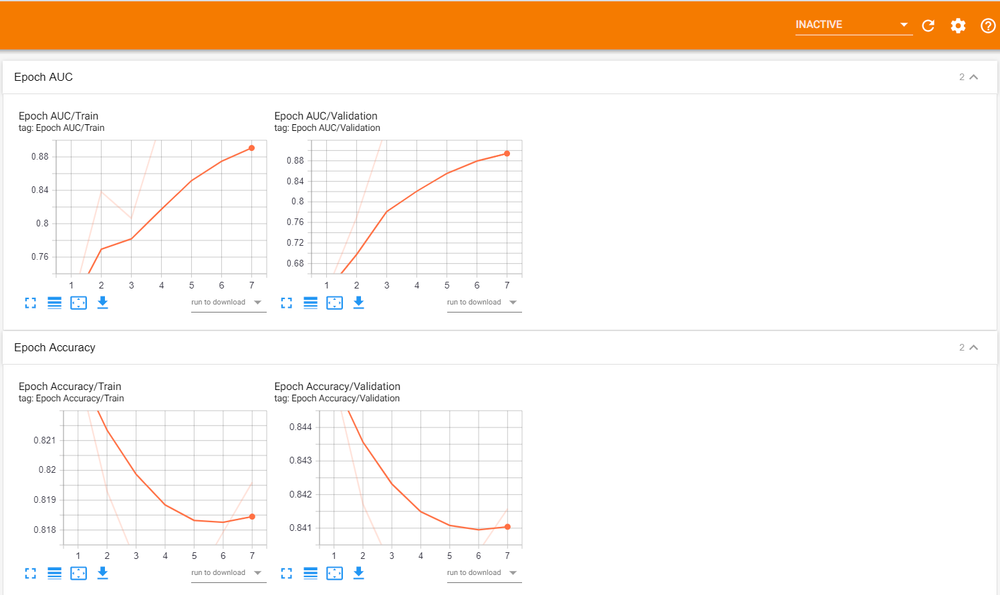

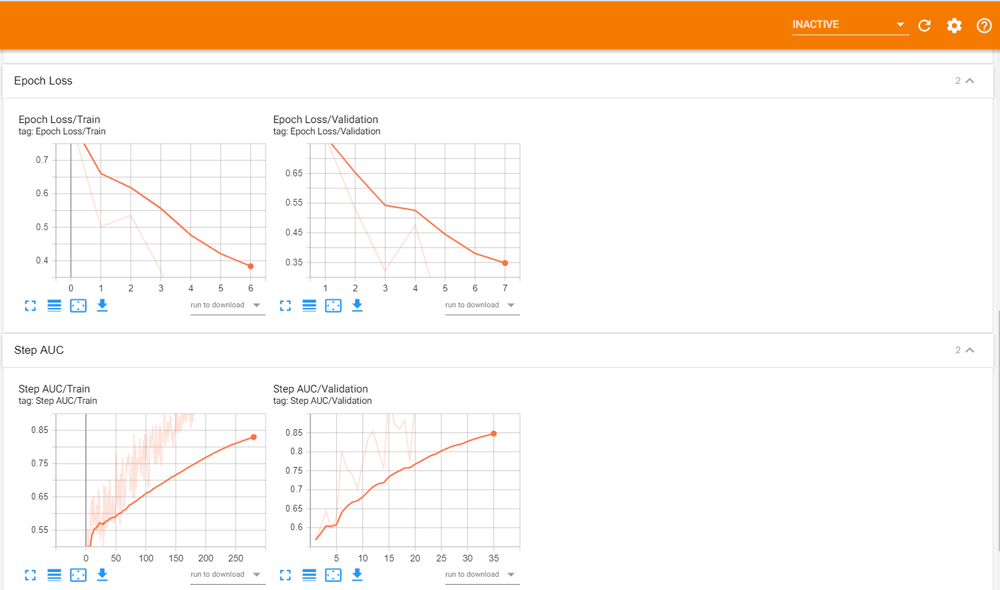

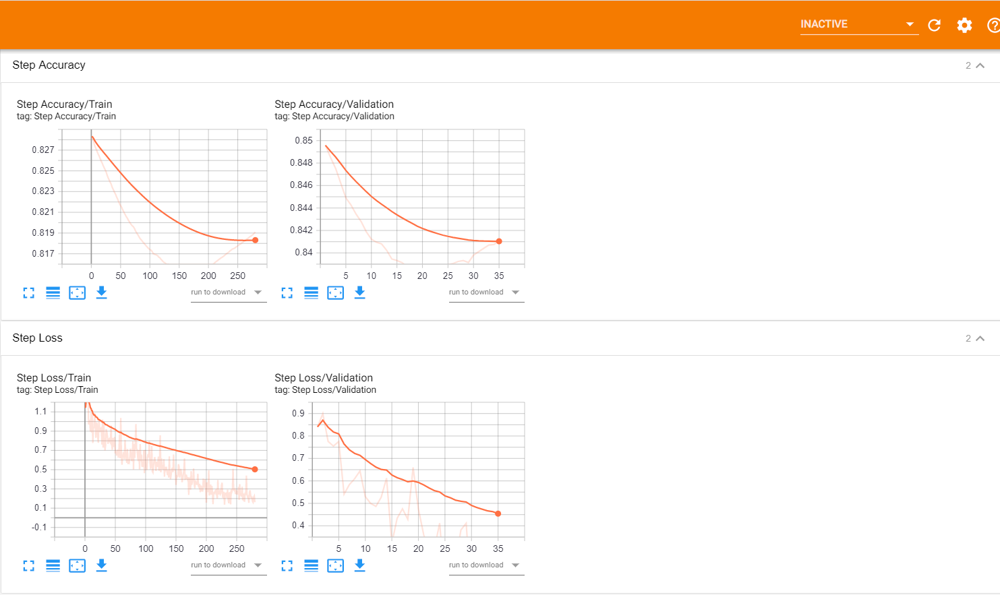

#### Model Using Dropout_Rate=0.3, Learning Rate=0.0001 and Epochs=7

In [75]:
K.clear_session()
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_D169(Init_LR=0.0001,Dropout_Rate=0.3,Img_Height=96,Img_Width=96,Epochs=7,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/7
[]
Training loss: 0.8653, Training accuracy: 81.4297, Train AUC: 0.5714 Validation loss: 0.9034, Validation accuracy: 83.6482, Validation AUC: 0.7143
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200815-215133\ckpt-1

Epoch 2/7
[]
Training loss: 0.7890, Training accuracy: 81.0636, Train AUC: 0.7156 Validation loss: 0.5545, Validation accuracy: 83.3360, Validation AUC: 0.7429
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200815-215133\ckpt-2

Epoch 3/7
[]
Training loss: 0.7193, Training accuracy: 80.7808, Train AUC: 0.7740 Validation loss: 0.4663, Validation accuracy: 83.0356, Validation AUC: 0.8588
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200815-215133\ckpt-3

Epoch 4/7
[]
Training loss: 0.7251, Training accuracy: 80.5485, Train AUC: 0.7760 

#### Tensorboard Log Files

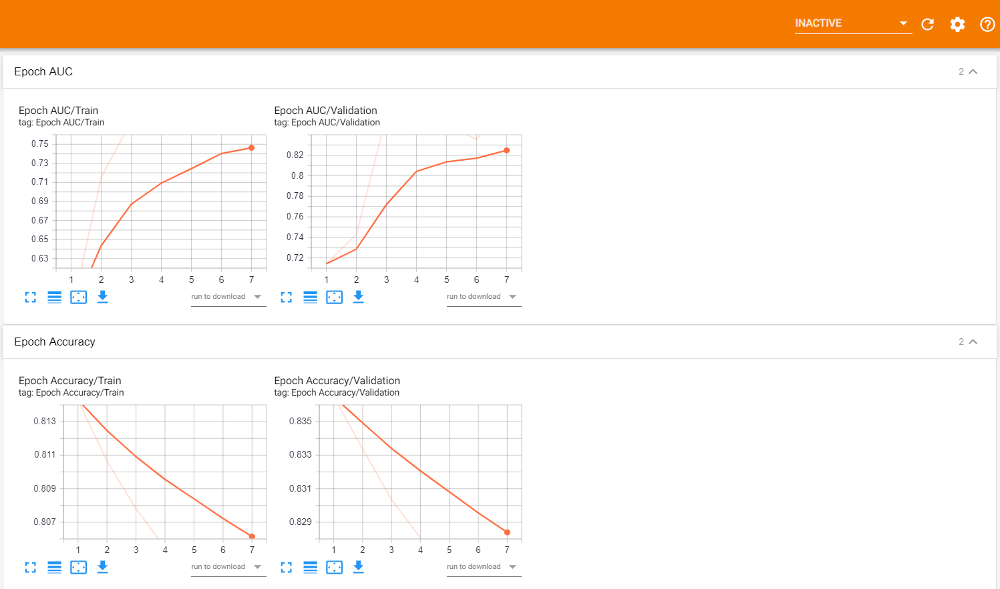

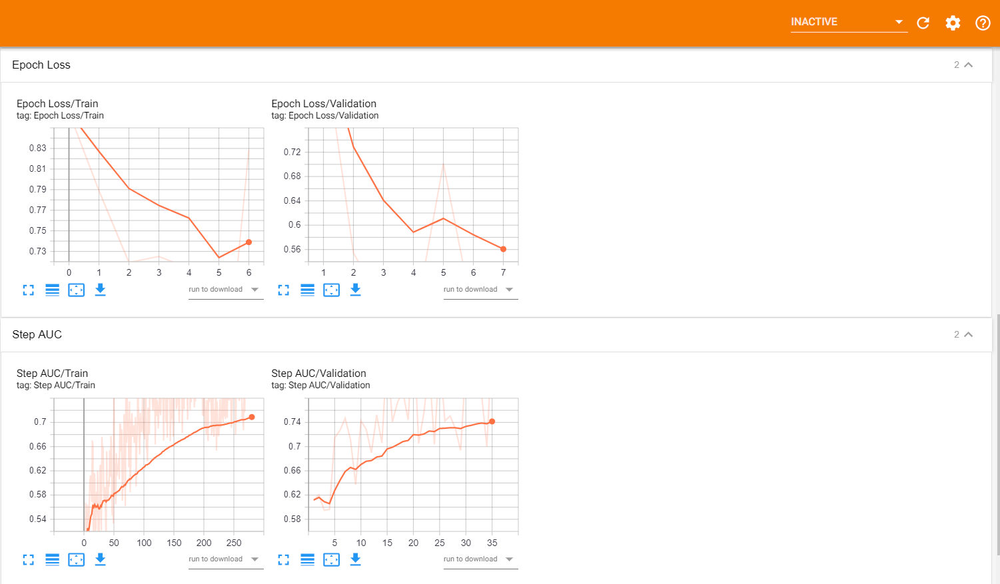

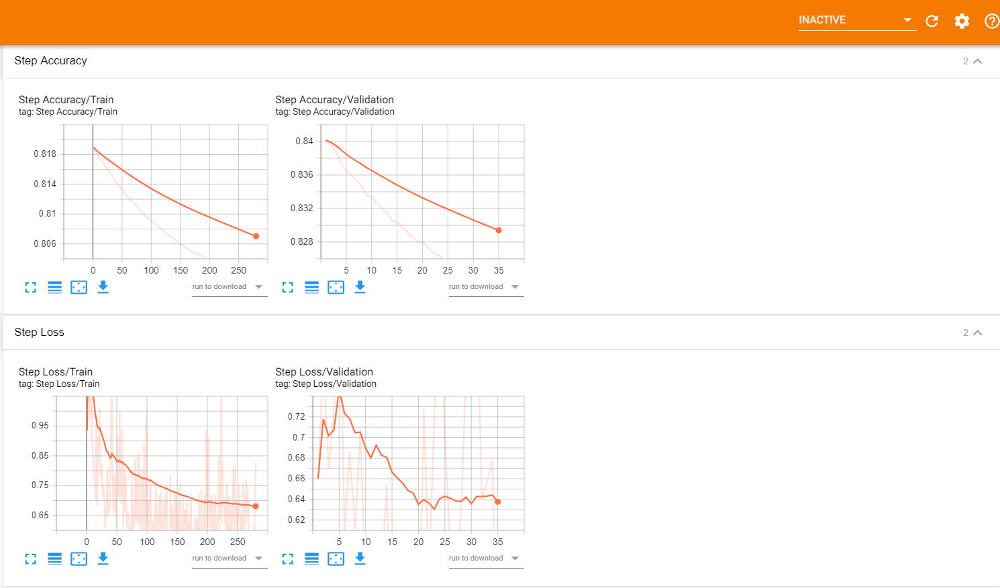

### Modelling with Binary Cross Entropy as Loss Function and F1Score as Metric

In [80]:
import tensorflow_addons as tfa
from tensorflow_addons.metrics import F1Score
F1S=tfa.metrics.F1Score(
    num_classes=2,
    average= "micro",
    name = 'f1_score'
)

In [81]:
class GMP2(tf.keras.layers.Layer):   
    def __init__(self):
        super(GMP2,self).__init__()
        self.GMP=tf.keras.layers.GlobalMaxPooling2D()              
    def call(self,inputs):
        return self.GMP(inputs)
    
class GAP2(tf.keras.layers.Layer):   
    def __init__(self):
        super(GAP2,self).__init__()
        self.GAP=tf.keras.layers.GlobalAveragePooling2D()              
    def call(self,inputs):
        return self.GAP(inputs)
    
class Dr_Den(tf.keras.layers.Layer):
    def __init__(self,rate,**kwargs):
        super(Dr_Den,self).__init__(**kwargs)
        self.rate=rate
        self.Dens=tf.keras.layers.Dense(1,activation='sigmoid')
    def call(self,inputs):
        lay= tf.nn.dropout(inputs,rate=self.rate)
        lay= self.Dens(lay)
        return lay   

class MyModel(tf.keras.Model):
    def __init__(self,rate,**kwargs):
        super(MyModel,self).__init__()
        self.densenet = tf.keras.applications.DenseNet169(input_shape=(Img_Height,Img_Width,3),include_top=False,weights='imagenet')
        self.GMP2D=GMP2()
        self.GAP2D=GAP2()
        self.Flat=tf.keras.layers.Flatten()
        self.Concat=tf.keras.layers.Concatenate(axis=1)
        self.rate=rate
        self.Dens=Dr_Den(rate)
        
    def call(self, inputs, **kwargs):
        model=self.densenet(inputs)
        m1=self.GMP2D(model)
        m2=self.GAP2D(model)
        m3=self.Flat(model)
        model=self.Concat([m1,m2,m3])
        model=self.Dens(model)
        return model

In [85]:
#https://www.tensorflow.org/tutorials/distribute/save_and_load
def UNSModelGT(Epochs,checkpoint,manager,File_Name,modelc):
    
    start_time=time.clock()
    
    print("\nInitializing Parameters . . .")


    train_loss_results = []
    train_accuracy_results = []

    val_loss_results = []
    val_accuracy_results = []
    
    train_f1_score=[]
    val_f1_score=[]
    
    iepoch=0
    T_step=0
    V_step=0
    
    # Defining GradientTape
    
    @tf.function
    def GT(modelc,X_batch,Y_batch):    
        with tf.GradientTape() as tape:
            Y_Pred=modelc(X_batch, training=True)
            loss_values=loss(Y_batch, Y_Pred)
            gradients=tape.gradient(loss_values, modelc.trainable_weights)
            Opt_Adam.apply_gradients(zip(gradients, modelc.trainable_weights))
        
            return loss_values,Y_Pred
        
    
    
    # Initializing the Identifiers
    
    train_log_dir = 'logs/GT/UNS_D169_' + File_Name + '/train'
    summary_writer = tf.summary.create_file_writer(train_log_dir)
    save_path='ModelsGT/UNS_D169_' + File_Name
    
    # Training the Model
    
    print("\nTraining the Model . . .")
    print("\nChecking for the Checkpoint Files . . .")
    
    # Checking for the Checkpoints
    checkpoint.restore(manager.latest_checkpoint)
    if manager.latest_checkpoint:
        print("\nFound . .  !\nRestoring . . ")
        print("\nRestored from {}".format(manager.latest_checkpoint))
        ind=manager.latest_checkpoint.find("ckpt")
        iepoch=int(manager.latest_checkpoint[(ind+5):])
        print("\nTraining from Epoch {}".format(int(iepoch)+1))
        T_step=iepoch*(len(x_train)//Batch_Size)
        V_step=iepoch*(len(x_test)//Batch_Size)
    else:
        print("\nNot Found . . !")
        print("\nTraining the Model From Scratch . . .")
    
    Epochs=Epochs+int(iepoch)
    for epoch in range(int(iepoch),Epochs):

        print("\nEpoch {}/{}".format(epoch+1, Epochs))
        print("[", end ="")
        c=0
        # for loop iterate over batches
        for (X_batch, y_batch) in (T_Data):
        
            
               
        
            # GradientTape
            loss_values,y_pred=GT(modelc,X_batch,y_batch)

            train_loss(loss_values)
            train_accuracy(y_batch, y_pred)
            train_f1_SCORE=F1S(y_batch,y_pred)
            

            train_loss_results.append(loss_values)
            train_accuracy_results.append(train_accuracy.result())
            train_f1_score.append(train_f1_SCORE)
            
            c+=1
            T_step+=1
            #train_accuracy.reset_states
            with summary_writer.as_default():
                tf.summary.scalar(f'Step Loss/Train', loss_values, step=T_step)
                tf.summary.scalar(f'Step Accuracy/Train', train_accuracy.result(), step=T_step)
                tf.summary.scalar(f'Step AUC/Train', train_f1_SCORE, step=T_step)
        # Tensorboard Summary Writer    
        with summary_writer.as_default():
            tf.summary.scalar(f'Epoch Loss/Train', loss_values, step=epoch)
            tf.summary.scalar(f'Epoch Accuracy/Train', train_accuracy.result(), step=epoch+1)
            tf.summary.scalar(f'Epoch AUC/Train', train_f1_SCORE, step=epoch+1)
        
        # For Loop Iterating ove Validation Data Batches
        for (X_batch, y_batch) in (V_Data):
        
            
                

            # GradientTape
            val_loss_values,y_pred=GT(modelc,X_batch,y_batch)

            val_loss(val_loss_values)
            val_accuracy(y_batch, y_pred)
            val_f1_SCORE=F1S(y_batch,y_pred)


            val_loss_results.append(val_loss_values)
            val_accuracy_results.append(val_accuracy.result())
            val_f1_score.append(val_f1_SCORE)
            
            c+=1
            V_step+=1
            #val_accuracy.reset_states
            
            with summary_writer.as_default():
                tf.summary.scalar(f'Step Loss/Validation', val_loss_values, step=V_step)
                tf.summary.scalar(f'Step Accuracy/Validation', val_accuracy.result(), step=V_step)
                tf.summary.scalar(f'Step AUC/Validation', val_f1_SCORE, step=V_step)
        
        # Tensorboard Summary Writer
        with summary_writer.as_default():
            tf.summary.scalar(f'Epoch Loss/Validation', val_loss_values, step=epoch+1)
            tf.summary.scalar(f'Epoch Accuracy/Validation', val_accuracy.result(), step=epoch+1)
            tf.summary.scalar(f'Epoch AUC/Validation', val_f1_SCORE, step=epoch+1)

        # Creating Checkpoint using tf.train.Checkpoint
        checkpoint = tf.train.Checkpoint(optimizer=Opt_Adam, model=modelc)
        print("]")
        Epoch_Stats = 'Training loss: {:.4f}, Training accuracy: {:.4f}, Train f1 SCORE: {:.4f} Validation loss: {:.4f}, Validation accuracy: {:.4f}, Validation F1 SCORE: {:.4f}'
        print(Epoch_Stats.format(loss_values,train_accuracy.result() * 100,train_f1_SCORE,val_loss_values,val_accuracy.result()*100,val_f1_SCORE))
    
        Checkpoint_save_path = manager.save()
        print("Saved Checkpoint for Epoch {}: {}".format(epoch+1, Checkpoint_save_path))
    #checkpoint.save(checkpoint_path+'/')
    z=modelc.predict(V_Data)
    # Saving the Model using tf.saved_model
    tf.saved_model.save(modelc,save_path+'/')
    
    # Displaying Information related to this run
    print("\n\nCorresponding Files to this Run : ")
    print("\nTensorBoard Log Files : logs/GT/UNS_D169_{}".format(File_Name))
    print("\nCheckpoint Files : CheckponitsGT/{}".format(File_Name))
    print("\nModel Files : {}".format(save_path))
        
    print("\n\nTime Taken For This Process : "+ str((time.clock()-start_time)) + " Sec")

In [86]:
def UNS_D169(Init_LR,Dropout_Rate,Img_Height,Img_Width,Epochs,File_Name):
    
    # Initializing Optimizer
    
    print("\nInitializing Optimizer . . .")
    Opt_Adam =Adam(lr=Init_LR)
    
    # Building Model
    print("\nBuilding Model . . .")
    modelx = MyModel(rate=Dropout_Rate)
    modelx.build(input_shape=(None, Img_Height,Img_Width,3))
    
    # Creating Checkpoint Objects
    checkpoint = tf.train.Checkpoint(optimizer=Opt_Adam,model=modelx)
    manager = tf.train.CheckpointManager(checkpoint, 'CheckponitsGT/UNS_D169_' + File_Name, max_to_keep=None)
    
    # Calling the Training Module
    K.clear_session()
    UNSModelGT(Epochs=Epochs,checkpoint=checkpoint,manager=manager,File_Name=File_Name,modelc=modelx)

#### Model Using Dropout_Rate=0.5, Learning Rate=0.001 and Epochs=8

In [90]:
K.clear_session()
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_D169(Init_LR=0.001,Dropout_Rate=0.5,Img_Height=96,Img_Width=96,Epochs=8,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/8
[]
Training loss: 0.8162, Training accuracy: 80.8433, Train f1 SCORE: 0.5838 Validation loss: 0.6427, Validation accuracy: 82.6610, Validation F1 SCORE: 0.5838
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200816-082423\ckpt-1

Epoch 2/8
[]
Training loss: 0.8145, Training accuracy: 80.3941, Train f1 SCORE: 0.5838 Validation loss: 0.8484, Validation accuracy: 82.2402, Validation F1 SCORE: 0.5838
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200816-082423\ckpt-2

Epoch 3/8
[]
Training loss: 0.6063, Training accuracy: 80.0439, Train f1 SCORE: 0.5837 Validation loss: 0.8471, Validation accuracy: 81.9053, Validation F1 SCORE: 0.5838
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200816-082423\ckpt-3

Epoch 4/8
[]
Training loss: 0.6999, Training accurac

#### Tensor logs

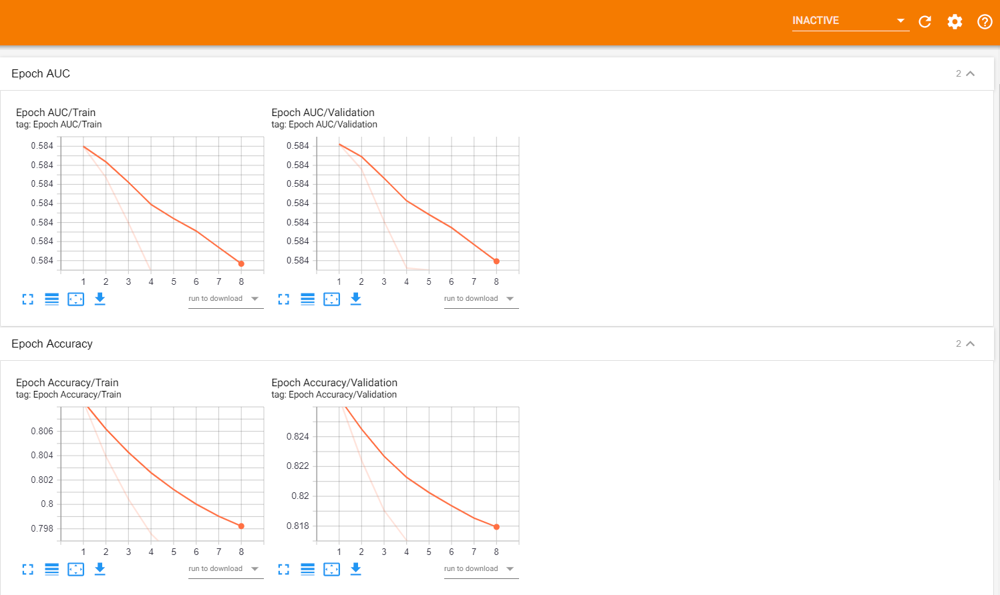

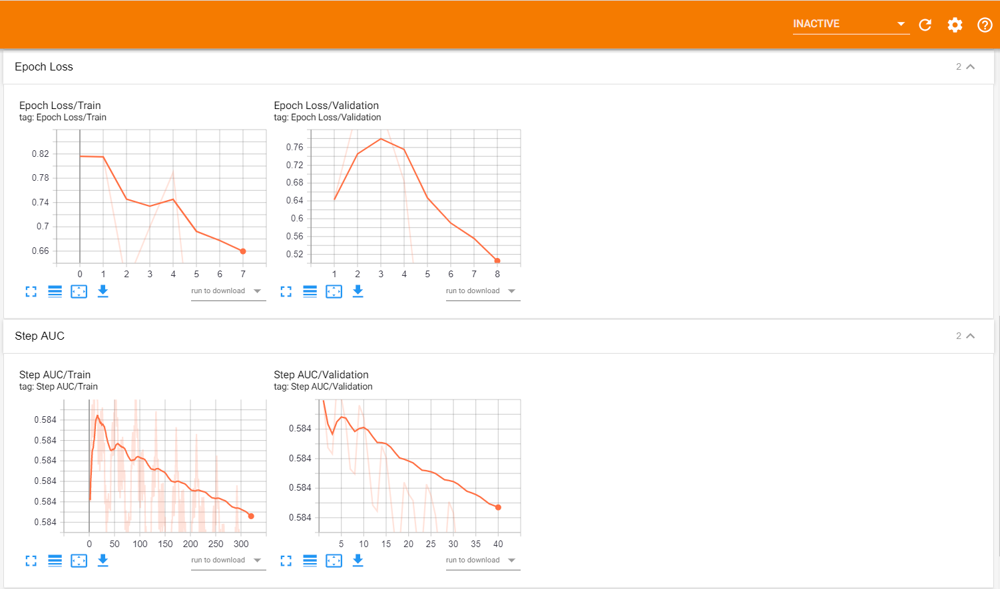

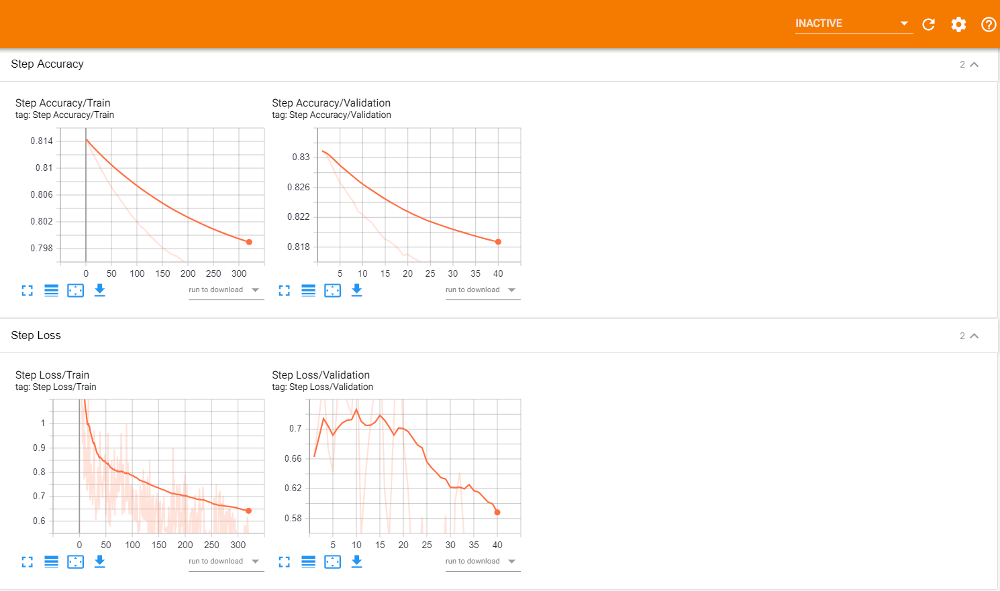

#### Model Using Dropout_Rate=0.5, Learning Rate=0.0001 and Epochs=10

In [88]:
K.clear_session()
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_D169(Init_LR=0.0001,Dropout_Rate=0.5,Img_Height=96,Img_Width=96,Epochs=10,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/10
[]
Training loss: 0.8383, Training accuracy: 77.9110, Train f1 SCORE: 0.5842 Validation loss: 0.9419, Validation accuracy: 78.8656, Validation F1 SCORE: 0.5843
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200816-075422\ckpt-1

Epoch 2/10
[]
Training loss: 0.6065, Training accuracy: 77.0514, Train f1 SCORE: 0.5841 Validation loss: 0.5783, Validation accuracy: 77.7438, Validation F1 SCORE: 0.5842
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200816-075422\ckpt-2

Epoch 3/10
[]
Training loss: 0.7327, Training accuracy: 76.3999, Train f1 SCORE: 0.5840 Validation loss: 0.4608, Validation accuracy: 77.0857, Validation F1 SCORE: 0.5841
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200816-075422\ckpt-3

Epoch 4/10
[]
Training loss: 0.4532, Training acc

### Tensorboard Log files

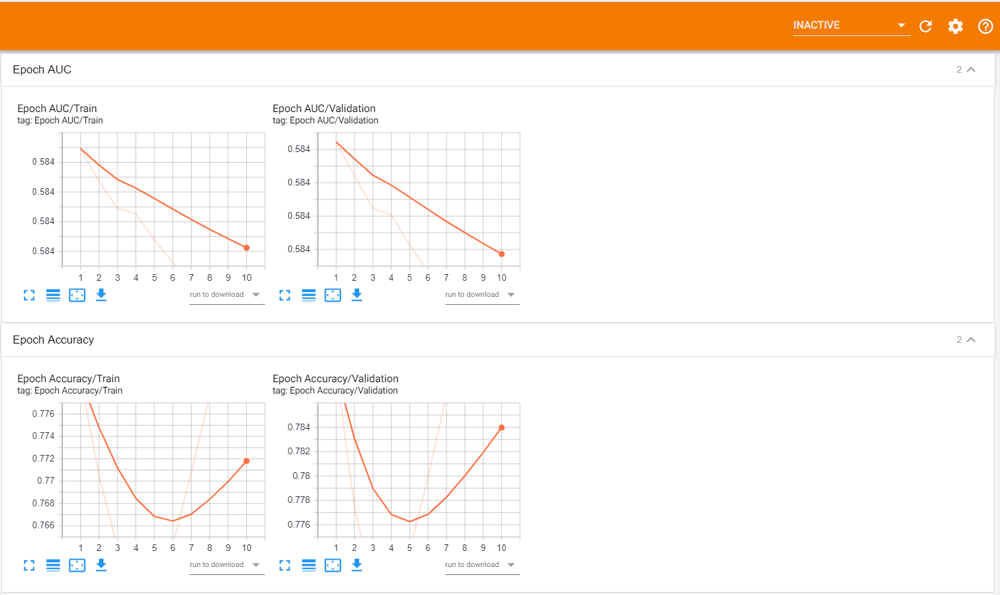

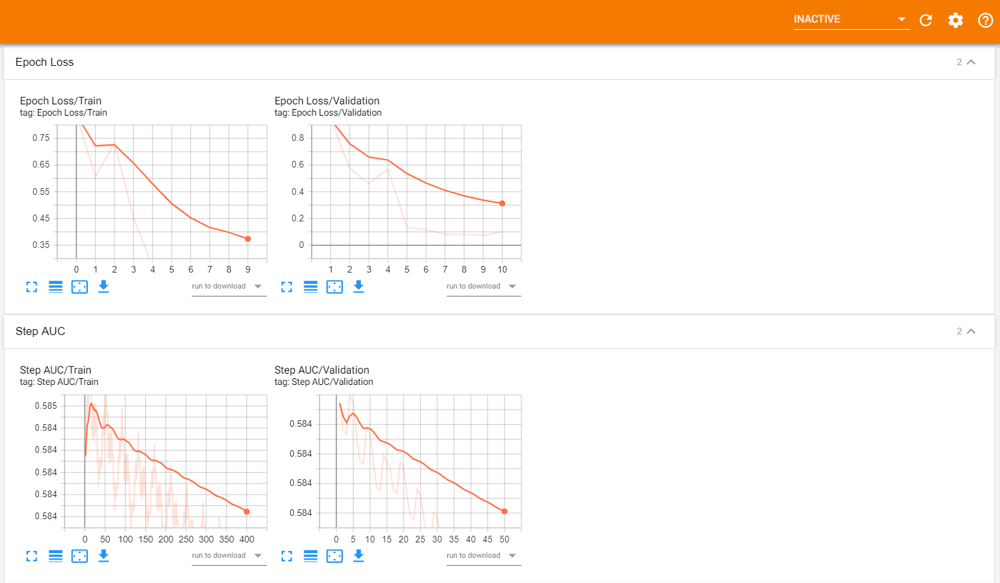

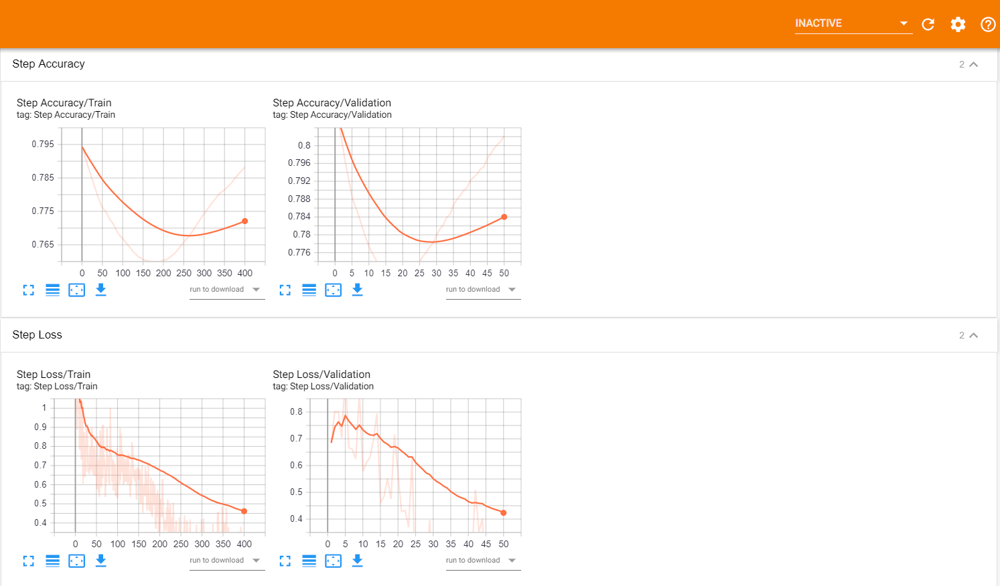

#### Model Using Dropout_Rate=0.5, Learning Rate=0.01 and Epochs=10

In [89]:
K.clear_session()
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_D169(Init_LR=0.01,Dropout_Rate=0.5,Img_Height=96,Img_Width=96,Epochs=15,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/15
[]
Training loss: 0.9747, Training accuracy: 77.8830, Train f1 SCORE: 0.5837 Validation loss: 0.6350, Validation accuracy: 79.4283, Validation F1 SCORE: 0.5837
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200816-081736\ckpt-1

Epoch 2/15
[]
Training loss: 0.6521, Training accuracy: 77.2356, Train f1 SCORE: 0.5837 Validation loss: 0.4844, Validation accuracy: 78.8917, Validation F1 SCORE: 0.5837
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200816-081736\ckpt-2

Epoch 3/15
[]
Training loss: 0.4630, Training accuracy: 76.9140, Train f1 SCORE: 0.5837 Validation loss: 0.2762, Validation accuracy: 78.7346, Validation F1 SCORE: 0.5837
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200816-081736\ckpt-3

Epoch 4/15
[]
Training loss: 0.3849, Training acc

#### Tensorboard Log Files

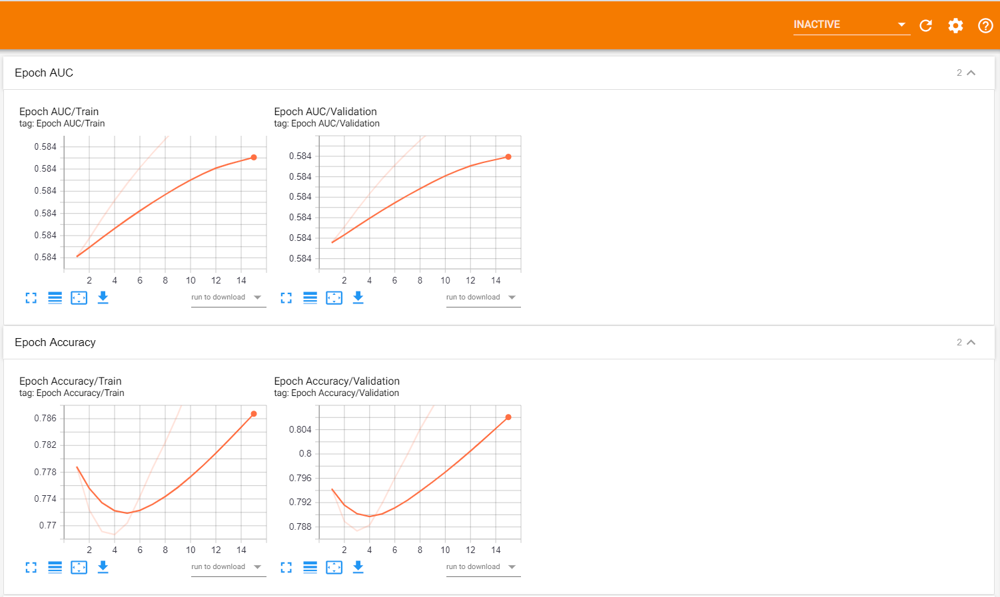

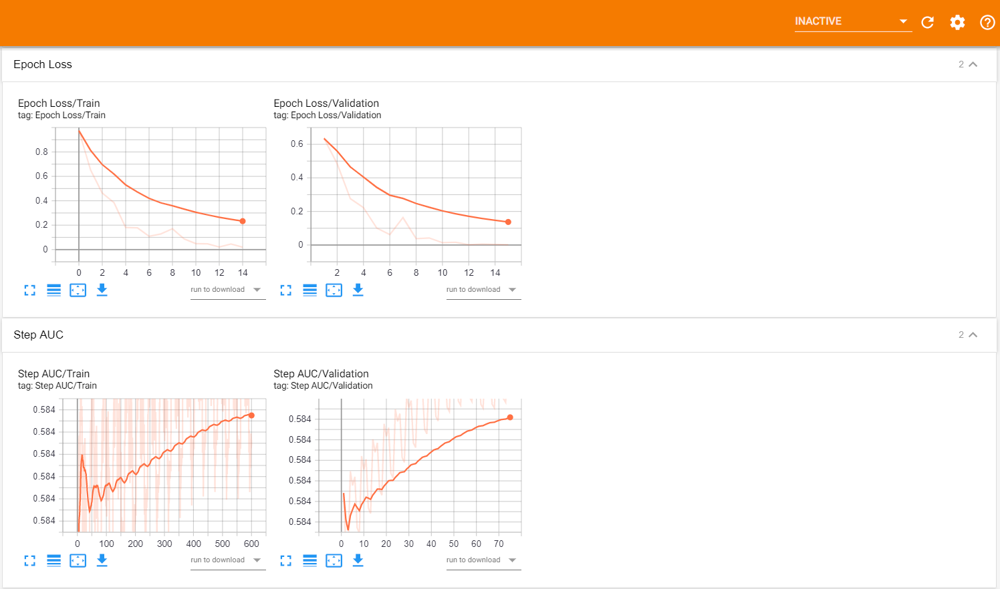

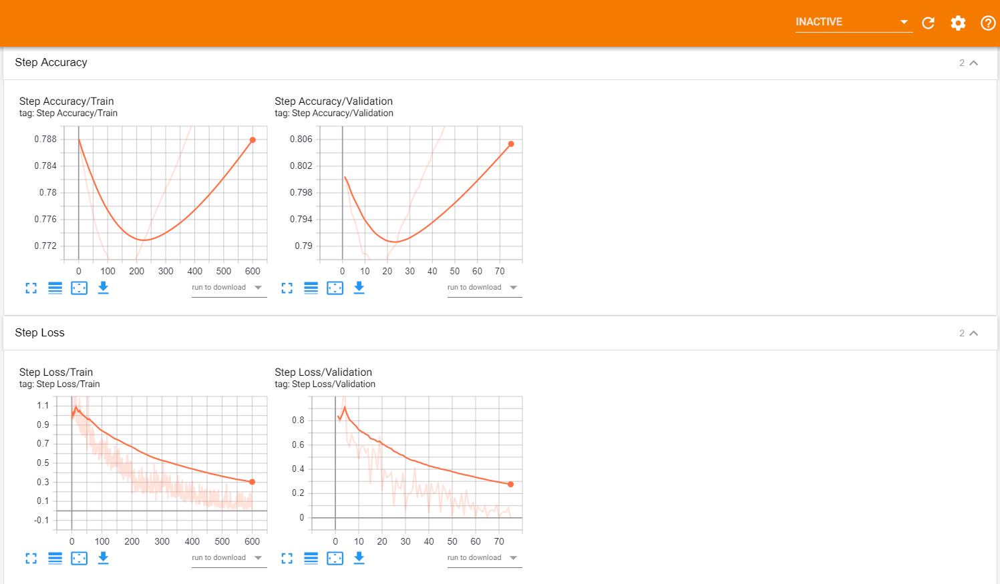

#### Model Using Dropout_Rate=0.4, Learning Rate=0.0001 and Epochs=10

In [91]:
K.clear_session()
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_D169(Init_LR=0.0001,Dropout_Rate=0.4,Img_Height=96,Img_Width=96,Epochs=10,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/10
[]
Training loss: 0.8470, Training accuracy: 78.7932, Train f1 SCORE: 0.5837 Validation loss: 0.5273, Validation accuracy: 80.9574, Validation F1 SCORE: 0.5837
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200816-082936\ckpt-1

Epoch 2/10
[]
Training loss: 0.6906, Training accuracy: 78.5026, Train f1 SCORE: 0.5836 Validation loss: 0.9490, Validation accuracy: 80.6222, Validation F1 SCORE: 0.5837
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200816-082936\ckpt-2

Epoch 3/10
[]
Training loss: 0.5028, Training accuracy: 78.2531, Train f1 SCORE: 0.5836 Validation loss: 0.6702, Validation accuracy: 80.4537, Validation F1 SCORE: 0.5836
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200816-082936\ckpt-3

Epoch 4/10
[]
Training loss: 0.5123, Training acc

#### Tensorboard Log Files

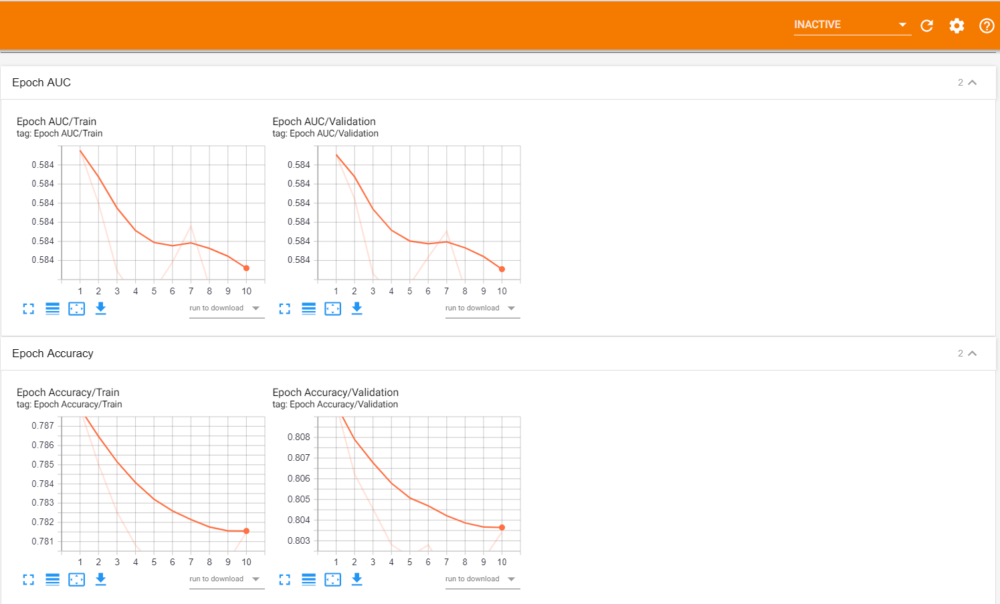

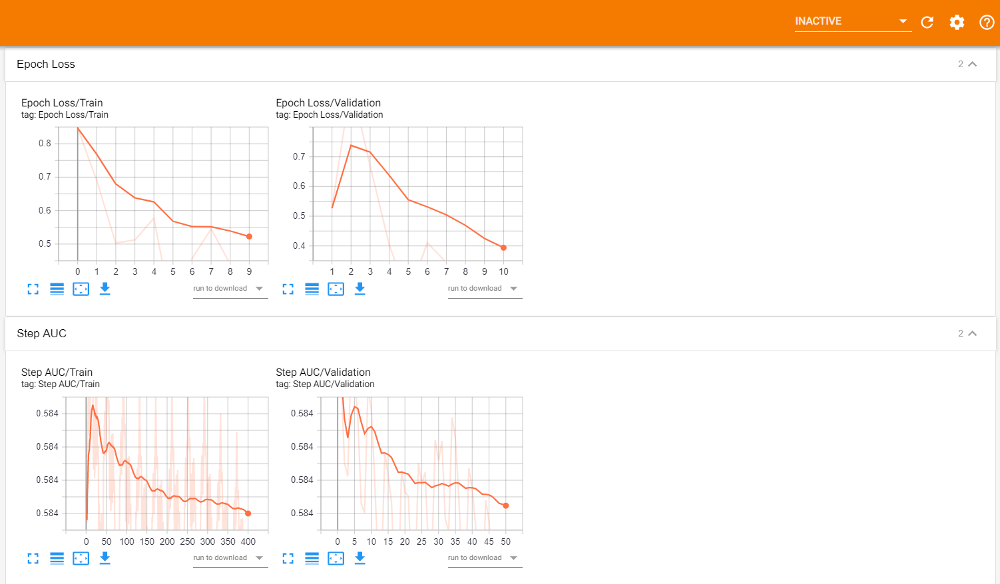

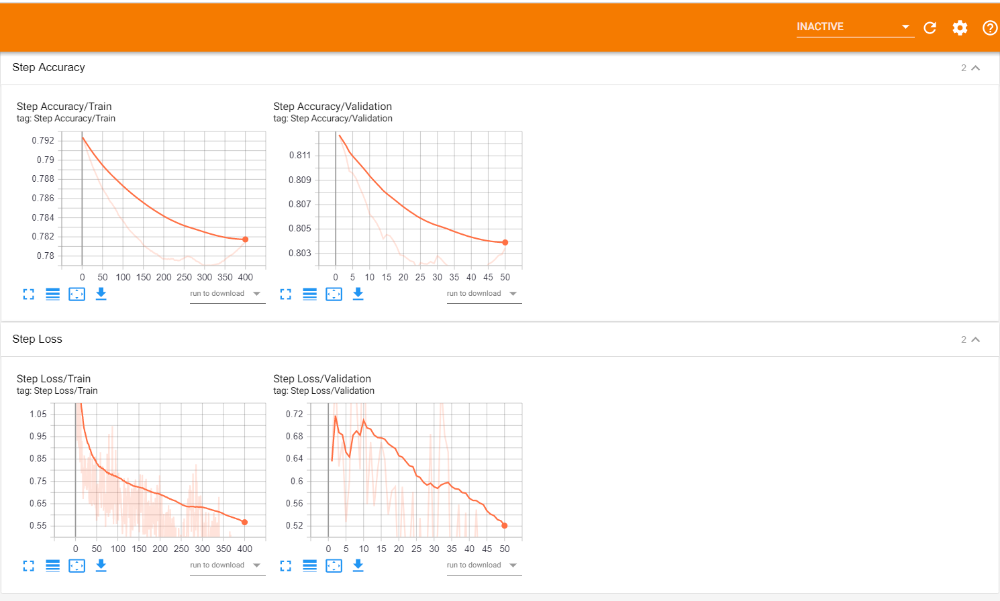

#### Model Using Dropout_Rate=0.4, Learning Rate=0.001 and Epochs=7

In [92]:
K.clear_session()
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_D169(Init_LR=0.001,Dropout_Rate=0.4,Img_Height=96,Img_Width=96,Epochs=7,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/7
[]
Training loss: 0.6469, Training accuracy: 77.8013, Train f1 SCORE: 0.5836 Validation loss: 0.5543, Validation accuracy: 80.0760, Validation F1 SCORE: 0.5836
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200816-083409\ckpt-1

Epoch 2/7
[]
Training loss: 0.5649, Training accuracy: 77.5863, Train f1 SCORE: 0.5836 Validation loss: 0.4733, Validation accuracy: 79.8225, Validation F1 SCORE: 0.5836
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200816-083409\ckpt-2

Epoch 3/7
[]
Training loss: 0.5313, Training accuracy: 77.4194, Train f1 SCORE: 0.5836 Validation loss: 0.6476, Validation accuracy: 79.6943, Validation F1 SCORE: 0.5836
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200816-083409\ckpt-3

Epoch 4/7
[]
Training loss: 0.5513, Training accurac

#### Tensorboard Log Files

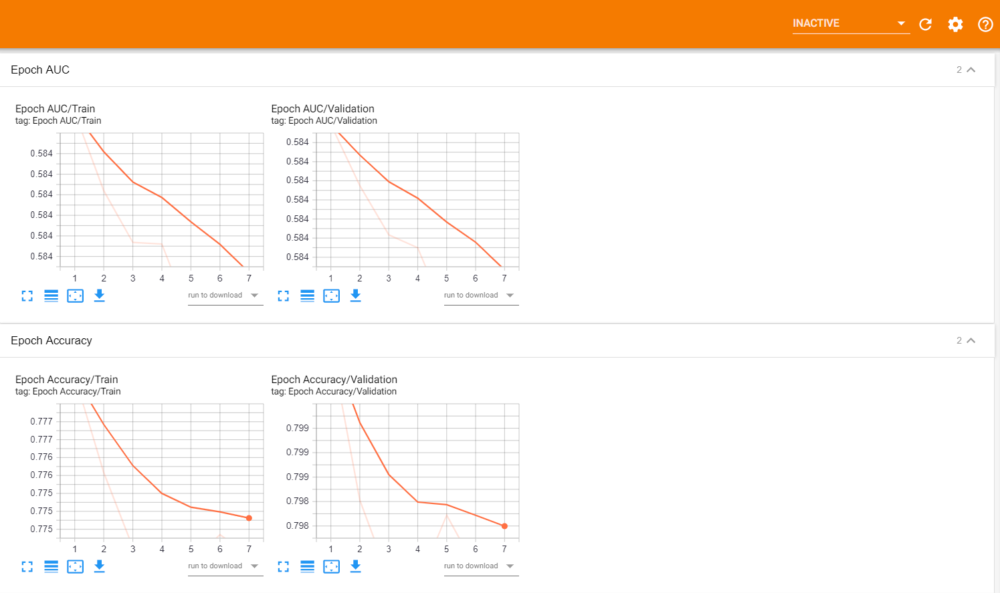

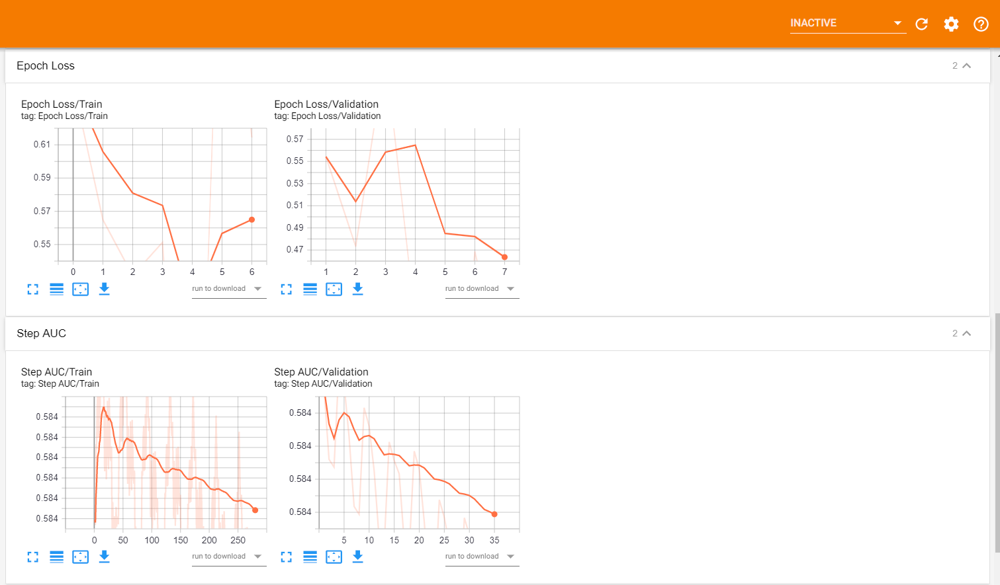

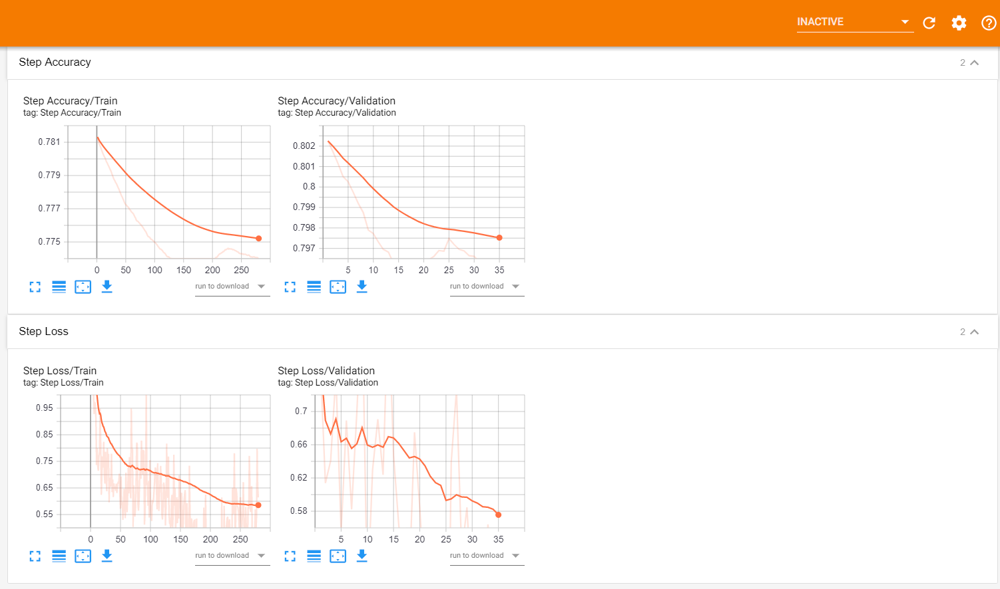

#### Model Using Dropout_Rate=0.3, Learning Rate=0.0001 and Epochs=7

In [93]:
K.clear_session()
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_D169(Init_LR=0.0001,Dropout_Rate=0.3,Img_Height=96,Img_Width=96,Epochs=7,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/7
[]
Training loss: 0.9297, Training accuracy: 77.0877, Train f1 SCORE: 0.5835 Validation loss: 0.6670, Validation accuracy: 79.3777, Validation F1 SCORE: 0.5835
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200816-083756\ckpt-1

Epoch 2/7
[]
Training loss: 0.5430, Training accuracy: 76.8832, Train f1 SCORE: 0.5835 Validation loss: 0.7321, Validation accuracy: 79.1742, Validation F1 SCORE: 0.5836
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200816-083756\ckpt-2

Epoch 3/7
[]
Training loss: 0.6705, Training accuracy: 76.7680, Train f1 SCORE: 0.5835 Validation loss: 0.4513, Validation accuracy: 79.0884, Validation F1 SCORE: 0.5835
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200816-083756\ckpt-3

Epoch 4/7
[]
Training loss: 0.4132, Training accurac

#### Tensorboard Log Files

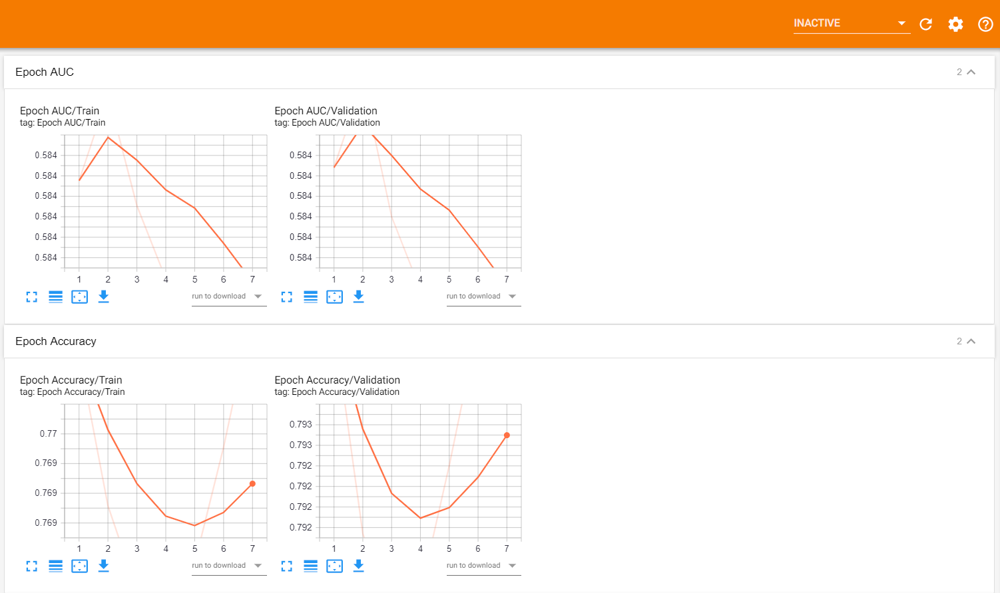

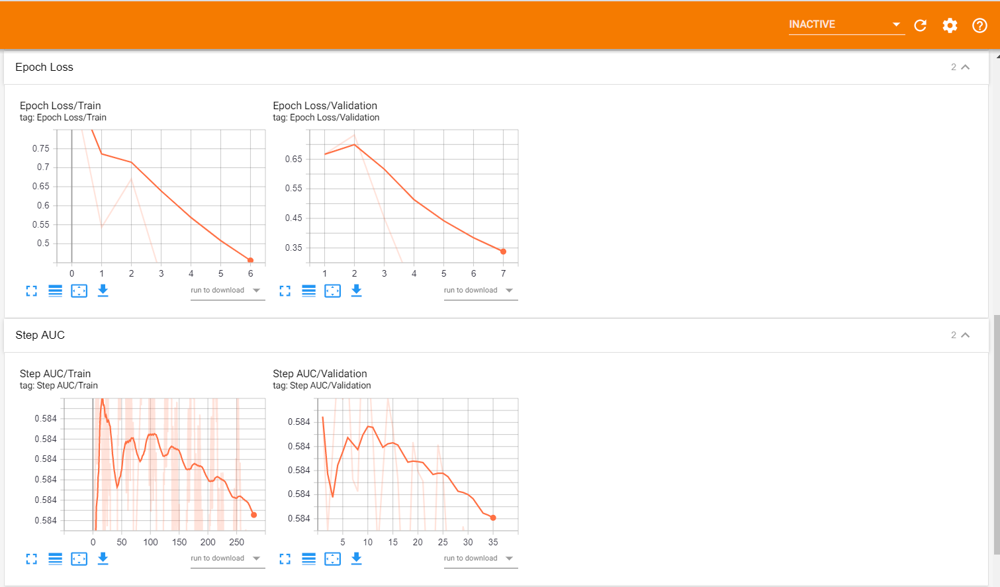

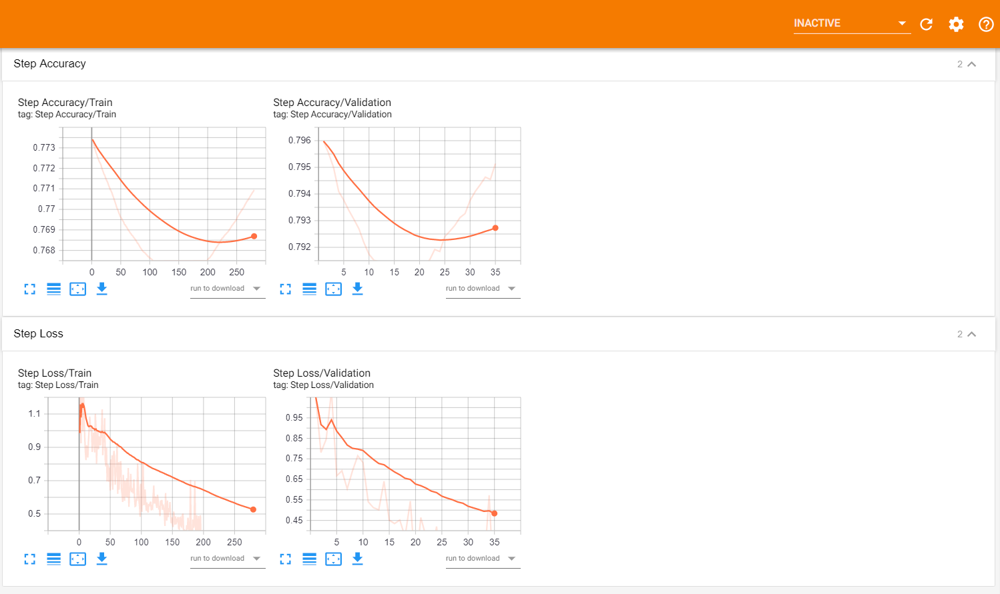

In [31]:
K.clear_session()
Init_LR=0.0001

loss_focal=tfa.losses.SigmoidFocalCrossEntropy(alpha = 0.25, gamma = 2.0,reduction=tf.keras.losses.Reduction.NONE)
optimizer = Adam(lr=Init_LR)
Opt_Adam =Adam(lr=Init_LR)

train_accuracy = tf.keras.metrics.BinaryAccuracy(name='train_accuracy')

val_accuracy = tf.keras.metrics.BinaryAccuracy(name='val_accuracy')

test_accuracy = tf.keras.metrics.BinaryAccuracy(name='test_accuracy')

In [32]:
# ROC-AUC Score
def AUC(y_true, y_pred):
    return tf.py_function(roc_auc_score, (y_true, y_pred), tf.double)

### Modelling with Focal Cross Entropy as Loss Function and AUC as Metric

In [33]:
class GMP2(tf.keras.layers.Layer):   
    def __init__(self):
        super(GMP2,self).__init__()
        self.GMP=tf.keras.layers.GlobalMaxPooling2D()              
    def call(self,inputs):
        return self.GMP(inputs)
    
class GAP2(tf.keras.layers.Layer):   
    def __init__(self):
        super(GAP2,self).__init__()
        self.GAP=tf.keras.layers.GlobalAveragePooling2D()              
    def call(self,inputs):
        return self.GAP(inputs)
    
class Dr_Den(tf.keras.layers.Layer):
    def __init__(self,rate,**kwargs):
        super(Dr_Den,self).__init__(**kwargs)
        self.rate=rate
        self.Dens=tf.keras.layers.Dense(1,activation='sigmoid')
    def call(self,inputs):
        lay= tf.nn.dropout(inputs,rate=self.rate)
        lay= self.Dens(lay)
        return lay   

class MyModel(tf.keras.Model):
    def __init__(self,rate,**kwargs):
        super(MyModel,self).__init__()
        self.densenet = tf.keras.applications.DenseNet169(input_shape=(Img_Height,Img_Width,3),include_top=False,weights='imagenet')
        self.GMP2D=GMP2()
        self.GAP2D=GAP2()
        self.Flat=tf.keras.layers.Flatten()
        self.Concat=tf.keras.layers.Concatenate(axis=1)
        self.rate=rate
        self.Dens=Dr_Den(rate)
        
    def call(self, inputs, **kwargs):
        model=self.densenet(inputs)
        m1=self.GMP2D(model)
        m2=self.GAP2D(model)
        m3=self.Flat(model)
        model=self.Concat([m1,m2,m3])
        model=self.Dens(model)
        return model

In [41]:
#https://www.tensorflow.org/tutorials/distribute/save_and_load
def UNSModelGT(Epochs,checkpoint,manager,File_Name,modelc):
    
    start_time=time.clock()
    
    print("\nInitializing Parameters . . .")


    train_loss_results = []
    train_accuracy_results = []

    val_loss_results = []
    val_accuracy_results = []
    
    train_auc=[]
    val_auc=[]
    
    iepoch=0
    T_step=0
    V_step=0
    
    # Defining GradientTape
    
    @tf.function
    def GT(modelc,X_batch,Y_batch):    
        with tf.GradientTape() as tape:
            Y_Pred=modelc(X_batch, training=True)
            Y_batch=tf.cast(Y_batch,tf.float32)
            loss_values=loss_focal(Y_batch, Y_Pred)
            loss_values = tf.reduce_sum(loss_values) * (1. / 128)
            gradients=tape.gradient(loss_values, modelc.trainable_weights)
            Opt_Adam.apply_gradients(zip(gradients, modelc.trainable_weights))
        
            return loss_values,Y_Pred
        
    
    
    # Initializing the Identifiers
    
    train_log_dir = 'logs/GT/UNS_D169_' + File_Name + '/train'
    summary_writer = tf.summary.create_file_writer(train_log_dir)
    save_path='ModelsGT/UNS_D169_' + File_Name
    
    # Training the Model
    
    print("\nTraining the Model . . .")
    print("\nChecking for the Checkpoint Files . . .")
    
    # Checking for the Checkpoints
    checkpoint.restore(manager.latest_checkpoint)
    if manager.latest_checkpoint:
        print("\nFound . .  !\nRestoring . . ")
        print("\nRestored from {}".format(manager.latest_checkpoint))
        ind=manager.latest_checkpoint.find("ckpt")
        iepoch=int(manager.latest_checkpoint[(ind+5):])
        print("\nTraining from Epoch {}".format(int(iepoch)+1))
        T_step=iepoch*(len(x_train)//Batch_Size)
        V_step=iepoch*(len(x_test)//Batch_Size)
    else:
        print("\nNot Found . . !")
        print("\nTraining the Model From Scratch . . .")
    
    Epochs=Epochs+int(iepoch)
    for epoch in range(int(iepoch),Epochs):

        print("\nEpoch {}/{}".format(epoch+1, Epochs))
        print("[", end ="")
        c=0
        # for loop iterate over batches
        for (X_batch, y_batch) in (T_Data):
            y_batch=tf.reshape(y_batch, [-1,1])
            
               
        
            # GradientTape
            loss_values,y_pred=GT(modelc,X_batch,y_batch)

            train_loss(loss_values)
            y_batch = tf.cast(y_batch, tf.float32)
            train_accuracy(y_batch, y_pred)
            train_AUC=AUC(y_batch,y_pred)
            

            train_loss_results.append(loss_values)
            train_accuracy_results.append(train_accuracy.result())
            train_auc.append(train_AUC)
            
            c+=1
            T_step+=1
            #train_accuracy.reset_states
            with summary_writer.as_default():
                tf.summary.scalar(f'Step Loss/Train', loss_values, step=T_step)
                tf.summary.scalar(f'Step Accuracy/Train', train_accuracy.result(), step=T_step)
                tf.summary.scalar(f'Step AUC/Train', train_AUC, step=T_step)
        # Tensorboard Summary Writer    
        #with summary_writer.as_default():
            #tf.summary.scalar(f'Epoch Loss/Train', loss_values, step=epoch)
            #tf.summary.scalar(f'Epoch Accuracy/Train', train_accuracy.result(), step=epoch+1)
            #tf.summary.scalar(f'Epoch AUC/Train', train_AUC, step=epoch+1)
        
        # For Loop Iterating ove Validation Data Batches
        for (X_batch, y_batch) in (V_Data):
        
            
                

            # GradientTape
            val_loss_values,y_pred=GT(modelc,X_batch,y_batch)

            val_loss(val_loss_values)
            val_accuracy(y_batch, y_pred)
            val_AUC=AUC(y_batch,y_pred)


            val_loss_results.append(val_loss_values)
            val_accuracy_results.append(val_accuracy.result())
            val_auc.append(val_AUC)
            
            c+=1
            V_step+=1
            #val_accuracy.reset_states
            
            with summary_writer.as_default():
                tf.summary.scalar(f'Step Loss/Validation', val_loss_values, step=V_step)
                tf.summary.scalar(f'Step Accuracy/Validation', val_accuracy.result(), step=V_step)
                tf.summary.scalar(f'Step AUC/Validation', val_AUC, step=V_step)
        
        # Tensorboard Summary Writer
        with summary_writer.as_default():
            tf.summary.scalar(f'Epoch Loss/Train', loss_values, step=epoch)
            tf.summary.scalar(f'Epoch Accuracy/Train', train_accuracy.result(), step=epoch+1)
            tf.summary.scalar(f'Epoch AUC/Train', train_AUC, step=epoch+1)
            tf.summary.scalar(f'Epoch Loss/Validation', val_loss_values, step=epoch+1)
            tf.summary.scalar(f'Epoch Accuracy/Validation', val_accuracy.result(), step=epoch+1)
            tf.summary.scalar(f'Epoch AUC/Validation', val_AUC, step=epoch+1)

        # Creating Checkpoint using tf.train.Checkpoint
        checkpoint = tf.train.Checkpoint(optimizer=Opt_Adam, model=modelc)
        print("]")
        Epoch_Stats = 'Training loss: {:.4f}, Training accuracy: {:.4f}, Train AUC: {:.4f} Validation loss: {:.4f}, Validation accuracy: {:.4f}, Validation AUC: {:.4f}'
        print(Epoch_Stats.format(loss_values,train_accuracy.result() * 100,train_AUC,val_loss_values,val_accuracy.result()*100,val_AUC))
    
        Checkpoint_save_path = manager.save()
        print("Saved Checkpoint for Epoch {}: {}".format(epoch+1, Checkpoint_save_path))
    #checkpoint.save(checkpoint_path+'/')
    z=modelc.predict(V_Data)
    # Saving the Model using tf.saved_model
    tf.saved_model.save(modelc,save_path+'/')
    
    # Displaying Information related to this run
    print("\n\nCorresponding Files to this Run : ")
    print("\nTensorBoard Log Files : logs/GT/UNS_D169_{}".format(File_Name))
    print("\nCheckpoint Files : CheckponitsGT/{}".format(File_Name))
    print("\nModel Files : {}".format(save_path))
        
    print("\n\nTime Taken For This Process : "+ str((time.clock()-start_time)) + " Sec")

In [42]:
def UNS_D169(Init_LR,Dropout_Rate,Img_Height,Img_Width,Epochs,File_Name):
    
    # Initializing Optimizer
    
    print("\nInitializing Optimizer . . .")
    Opt_Adam =Adam(lr=Init_LR)
    
    # Building Model
    print("\nBuilding Model . . .")
    modelx = MyModel(rate=Dropout_Rate)
    modelx.build(input_shape=(None, Img_Height,Img_Width,3))
    
    # Creating Checkpoint Objects
    checkpoint = tf.train.Checkpoint(optimizer=Opt_Adam,model=modelx)
    manager = tf.train.CheckpointManager(checkpoint, 'CheckponitsGT/UNS_D169_' + File_Name, max_to_keep=None)
    
    # Calling the Training Module
    K.clear_session()
    UNSModelGT(Epochs=Epochs,checkpoint=checkpoint,manager=manager,File_Name=File_Name,modelc=modelx)

#### Model Using Dropout_Rate=0.5, Learning Rate=0.001 and Epochs=8

In [43]:
K.clear_session()
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_D169(Init_LR=0.001,Dropout_Rate=0.5,Img_Height=96,Img_Width=96,Epochs=8,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/8
[

NameError: name 'train_loss' is not defined

#### Tensor logs

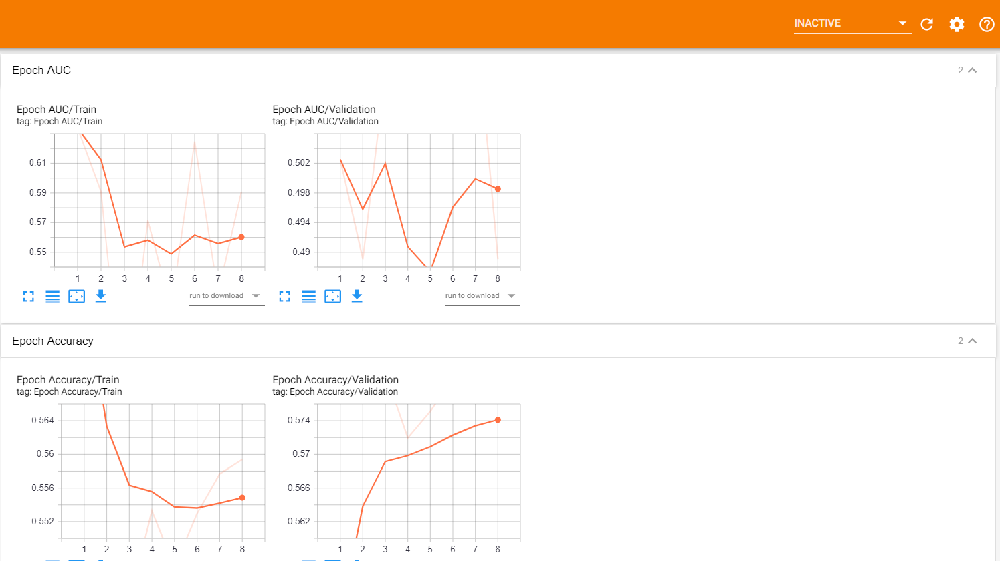

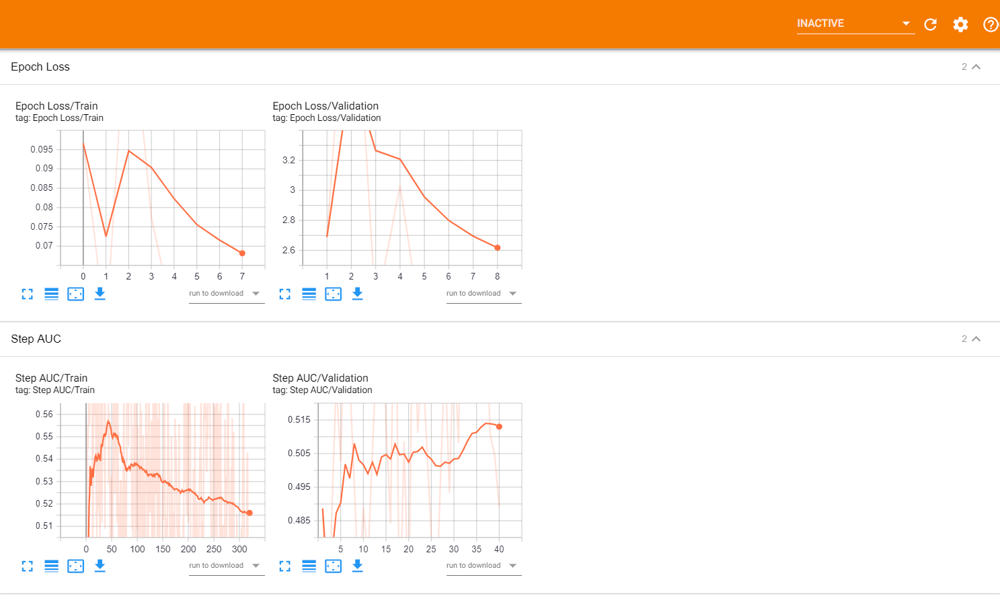

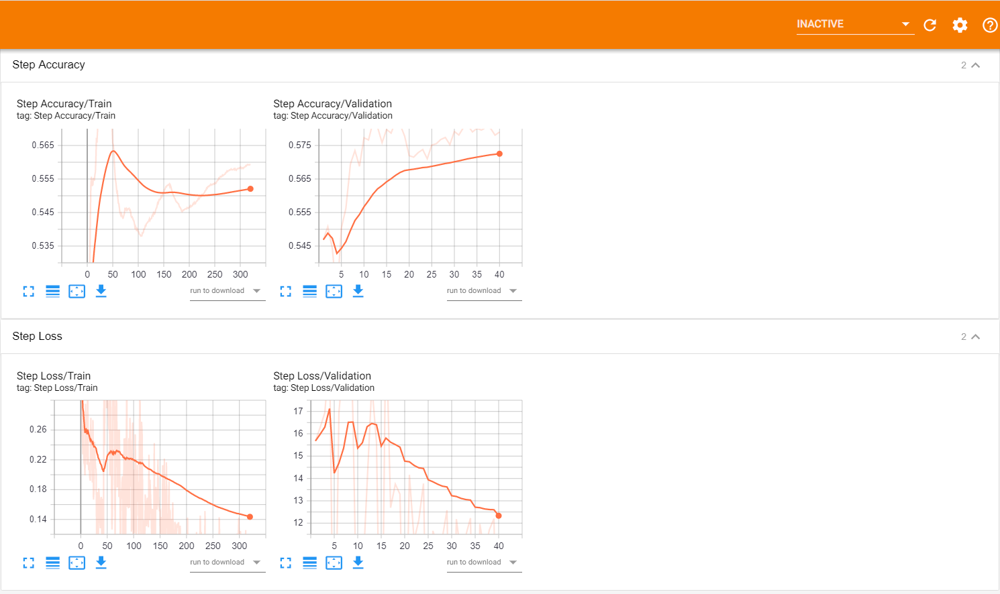

#### Model Using Dropout_Rate=0.5, Learning Rate=0.0001 and Epochs=10

In [100]:
K.clear_session()
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_D169(Init_LR=0.0001,Dropout_Rate=0.5,Img_Height=96,Img_Width=96,Epochs=10,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/10
[]
Training loss: 0.0747, Training accuracy: 56.0244, Train AUC: 0.6455 Validation loss: 9.3511, Validation accuracy: 57.3317, Validation AUC: 0.5983
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200816-085800\ckpt-1

Epoch 2/10
[]
Training loss: 0.0527, Training accuracy: 56.2118, Train AUC: 0.5338 Validation loss: 1.6500, Validation accuracy: 57.5000, Validation AUC: 0.3277
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200816-085800\ckpt-2

Epoch 3/10
[]
Training loss: 0.1439, Training accuracy: 55.6354, Train AUC: 0.4721 Validation loss: 4.6700, Validation accuracy: 57.3547, Validation AUC: 0.3445
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200816-085800\ckpt-3

Epoch 4/10
[]
Training loss: 0.0502, Training accuracy: 55.8338, Train AUC: 0.5

### Tensorboard Log files

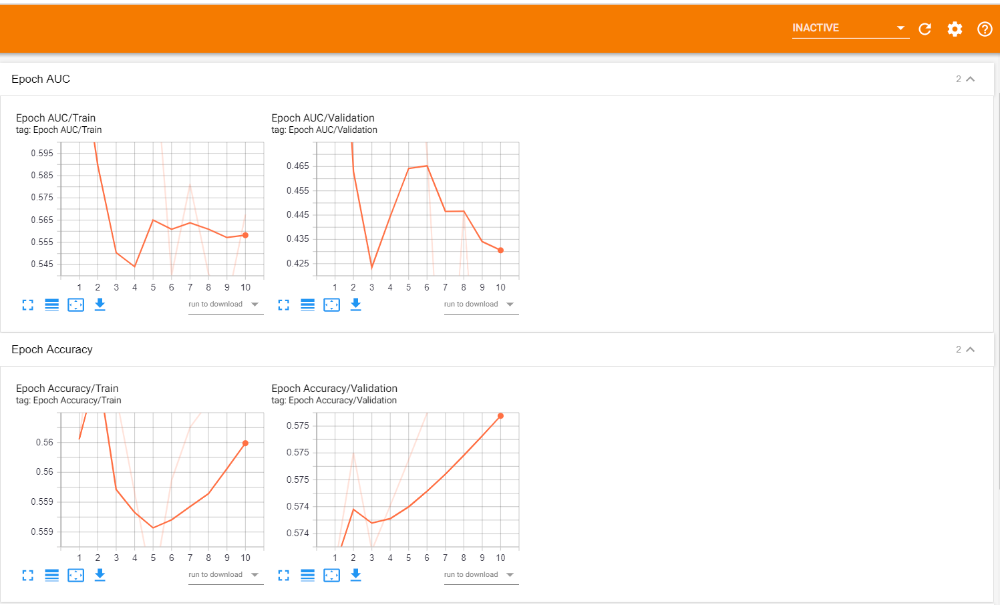

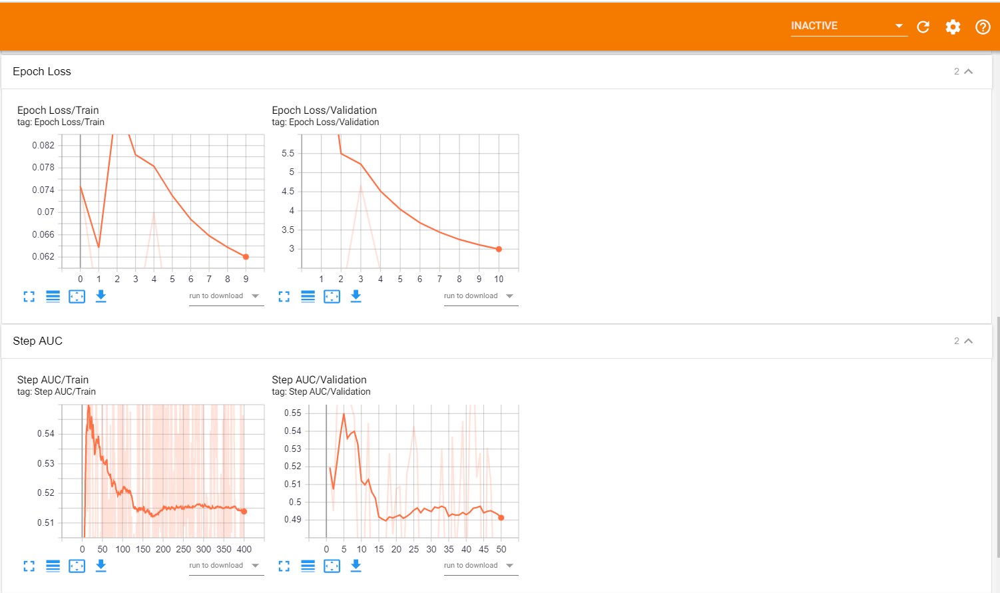

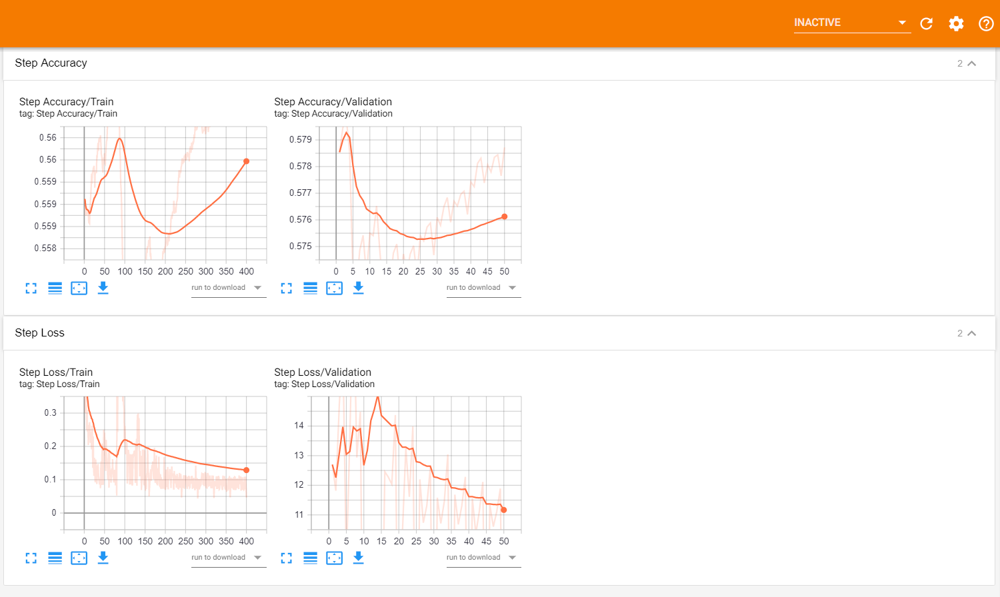

#### Model Using Dropout_Rate=0.5, Learning Rate=0.01 and Epochs=10

In [101]:
K.clear_session()
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_D169(Init_LR=0.01,Dropout_Rate=0.5,Img_Height=96,Img_Width=96,Epochs=15,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/15
[]
Training loss: 0.0871, Training accuracy: 56.4043, Train AUC: 0.4961 Validation loss: 3.1314, Validation accuracy: 57.7347, Validation AUC: 0.5916
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200816-090242\ckpt-1

Epoch 2/15
[]
Training loss: 0.1429, Training accuracy: 56.1309, Train AUC: 0.5201 Validation loss: 2.4086, Validation accuracy: 57.7536, Validation AUC: 0.4588
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200816-090242\ckpt-2

Epoch 3/15
[]
Training loss: 0.1075, Training accuracy: 55.8639, Train AUC: 0.4487 Validation loss: 4.7219, Validation accuracy: 57.7278, Validation AUC: 0.3966
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200816-090242\ckpt-3

Epoch 4/15
[]
Training loss: 0.0932, Training accuracy: 55.9877, Train AUC: 0.4

#### Tensorboard Log Files

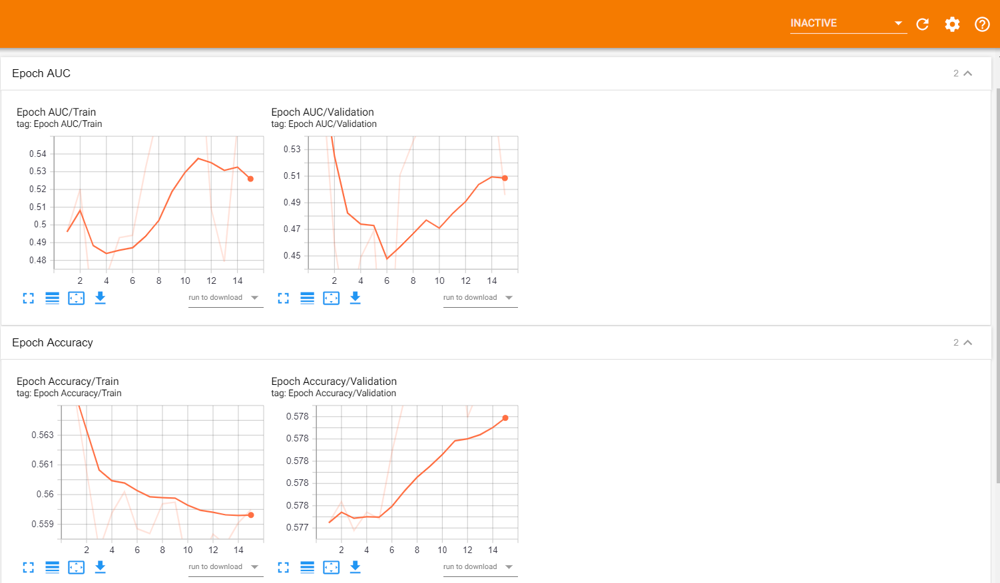

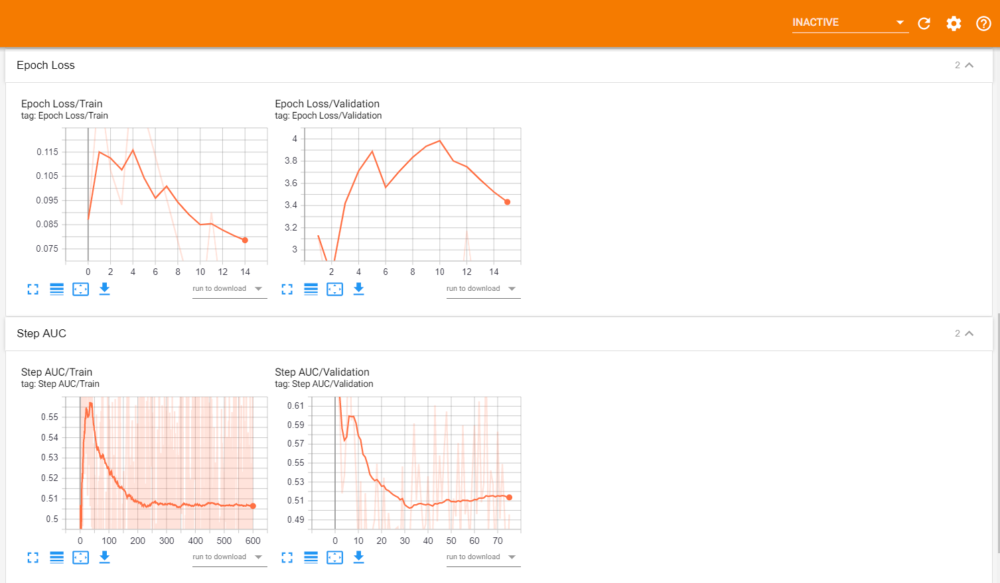

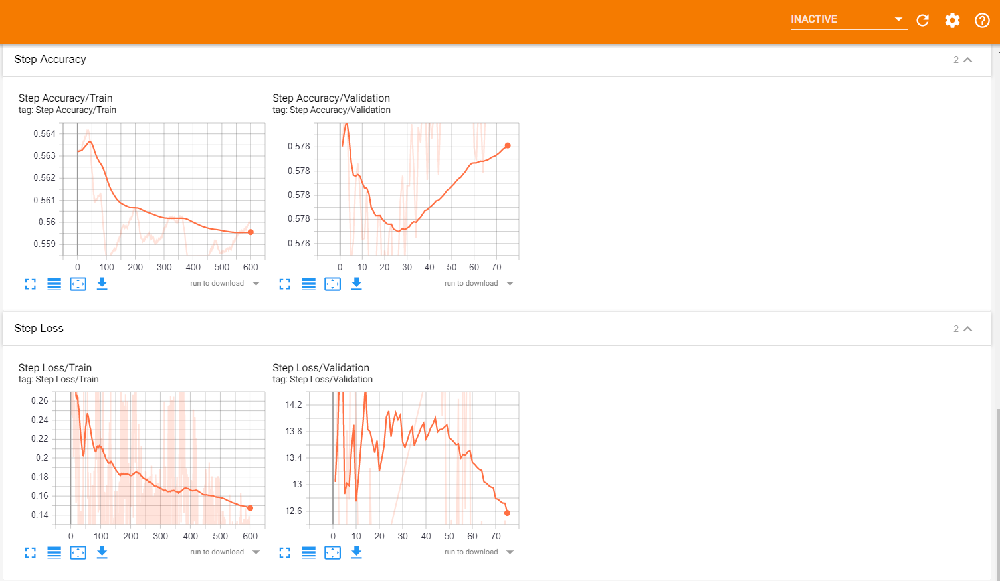

#### Model Using Dropout_Rate=0.4, Learning Rate=0.0001 and Epochs=10

In [102]:
K.clear_session()
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_D169(Init_LR=0.0001,Dropout_Rate=0.4,Img_Height=96,Img_Width=96,Epochs=10,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/10
[]
Training loss: 0.0836, Training accuracy: 56.0569, Train AUC: 0.5727 Validation loss: 2.6644, Validation accuracy: 57.8860, Validation AUC: 0.6017
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200816-090919\ckpt-1

Epoch 2/10
[]
Training loss: 0.0698, Training accuracy: 55.8780, Train AUC: 0.4604 Validation loss: 3.2336, Validation accuracy: 57.8760, Validation AUC: 0.5042
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200816-090919\ckpt-2

Epoch 3/10
[]
Training loss: 0.0651, Training accuracy: 55.9478, Train AUC: 0.5208 Validation loss: 4.0515, Validation accuracy: 57.8138, Validation AUC: 0.4521
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200816-090919\ckpt-3

Epoch 4/10
[]
Training loss: 0.0468, Training accuracy: 55.6951, Train AUC: 0.5

#### Tensorboard Log Files

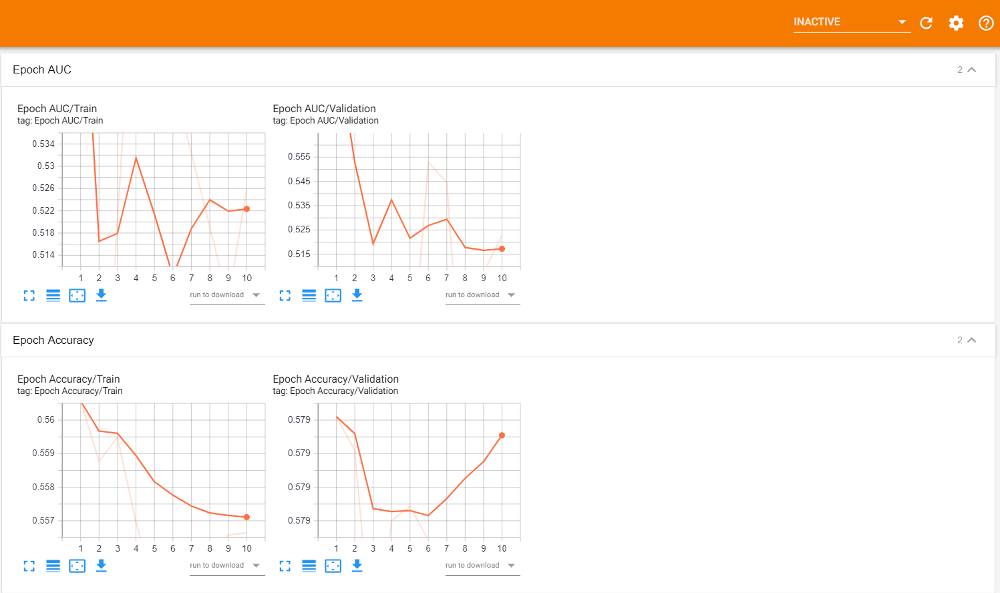

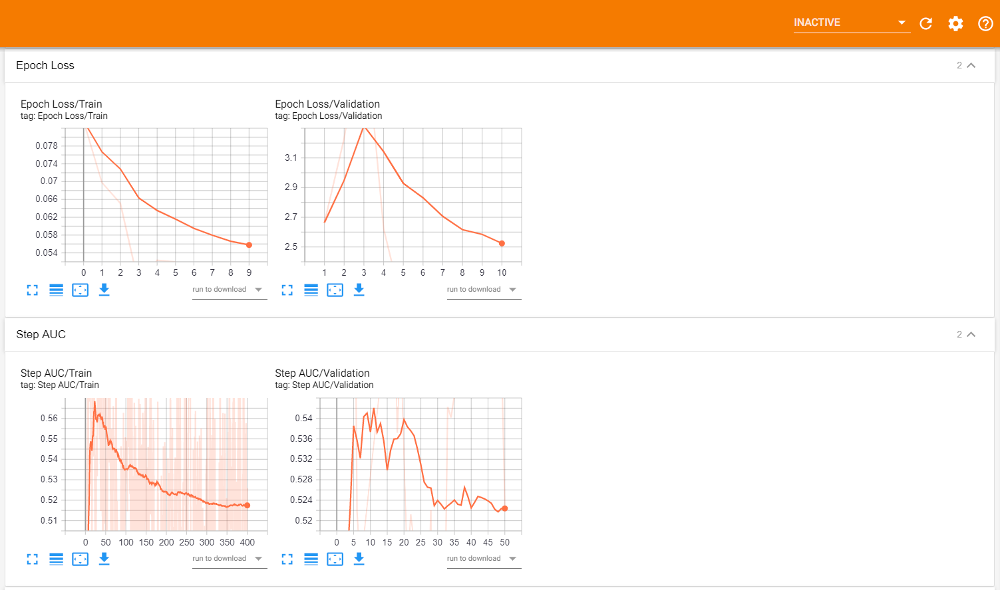

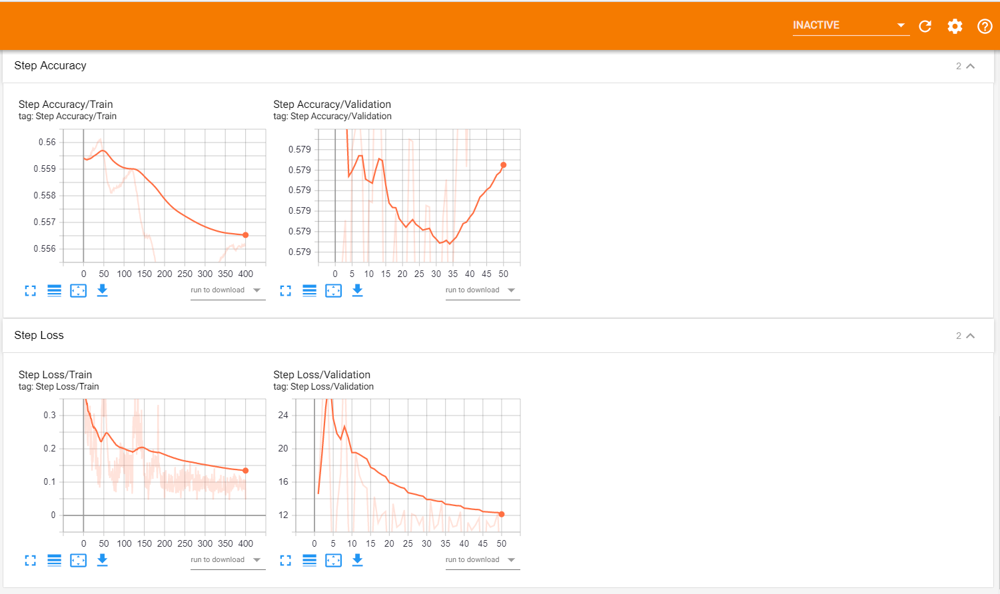

#### Model Using Dropout_Rate=0.4, Learning Rate=0.001 and Epochs=7

In [103]:
K.clear_session()
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_D169(Init_LR=0.001,Dropout_Rate=0.4,Img_Height=96,Img_Width=96,Epochs=7,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/7
[]
Training loss: 0.0761, Training accuracy: 55.7161, Train AUC: 0.5922 Validation loss: 3.7643, Validation accuracy: 57.8385, Validation AUC: 0.5815
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200816-091416\ckpt-1

Epoch 2/7
[]
Training loss: 0.0785, Training accuracy: 55.7782, Train AUC: 0.4403 Validation loss: 2.0283, Validation accuracy: 57.8750, Validation AUC: 0.3832
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200816-091416\ckpt-2

Epoch 3/7
[]
Training loss: 0.0759, Training accuracy: 55.7861, Train AUC: 0.4779 Validation loss: 2.8224, Validation accuracy: 57.8478, Validation AUC: 0.6017
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200816-091416\ckpt-3

Epoch 4/7
[]
Training loss: 0.0435, Training accuracy: 55.8335, Train AUC: 0.5779 

#### Tensorboard Log Files

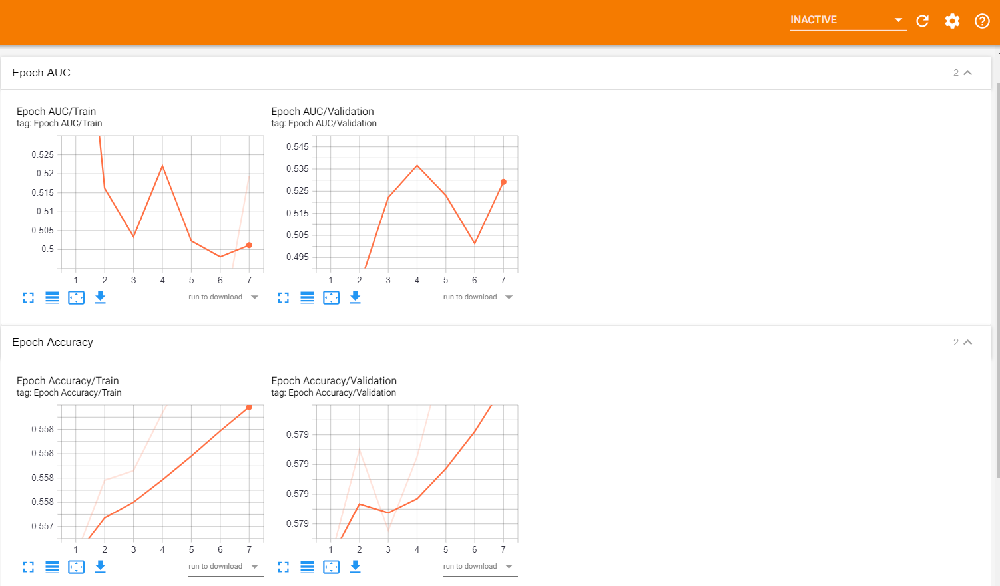

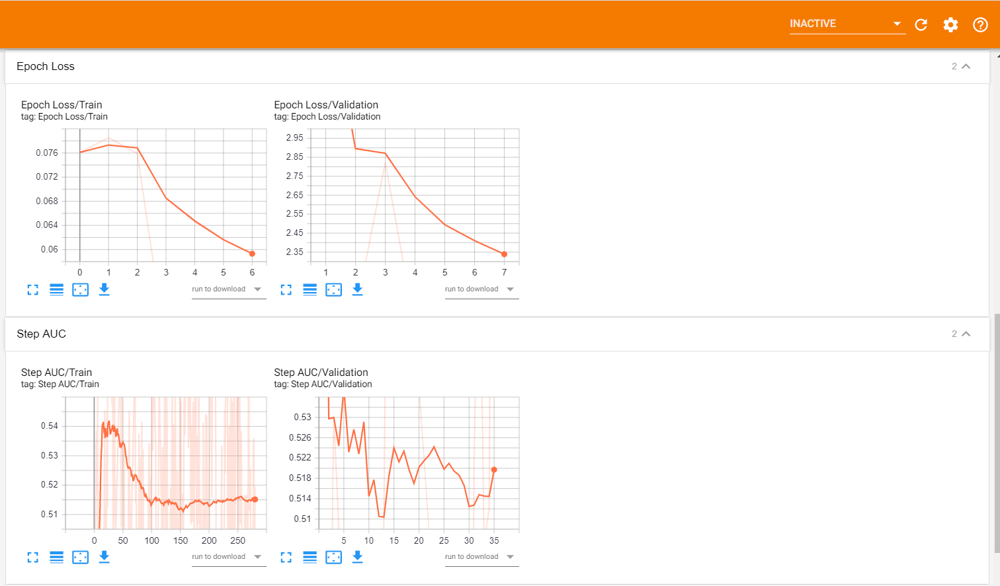

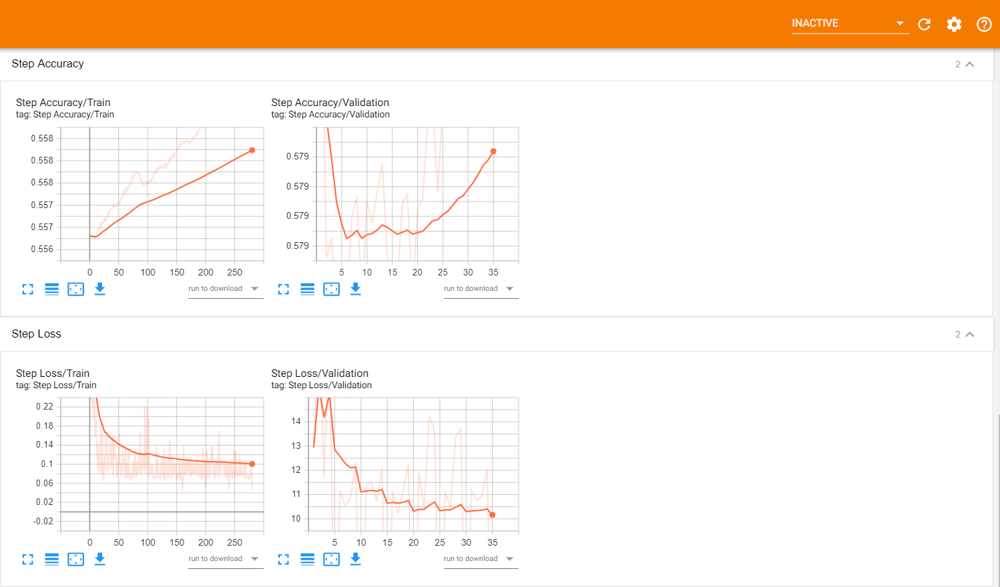

#### Model Using Dropout_Rate=0.3, Learning Rate=0.0001 and Epochs=7

In [104]:
K.clear_session()
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_D169(Init_LR=0.0001,Dropout_Rate=0.3,Img_Height=96,Img_Width=96,Epochs=7,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/7
[]
Training loss: 0.0769, Training accuracy: 55.9869, Train AUC: 0.5831 Validation loss: 1.9007, Validation accuracy: 57.9848, Validation AUC: 0.4790
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200816-091813\ckpt-1

Epoch 2/7
[]
Training loss: 0.1085, Training accuracy: 55.9433, Train AUC: 0.4351 Validation loss: 3.1373, Validation accuracy: 58.0046, Validation AUC: 0.5815
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200816-091813\ckpt-2

Epoch 3/7
[]
Training loss: 0.1041, Training accuracy: 55.8016, Train AUC: 0.4981 Validation loss: 3.9939, Validation accuracy: 58.0513, Validation AUC: 0.5748
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200816-091813\ckpt-3

Epoch 4/7
[]
Training loss: 0.0789, Training accuracy: 55.8565, Train AUC: 0.4195 

#### Tensorboard Log Files

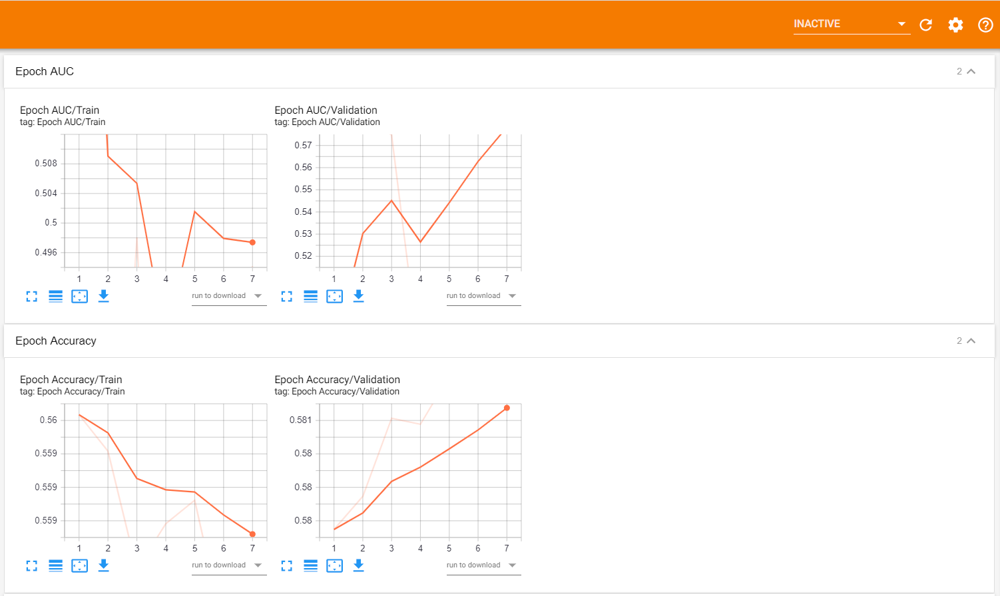

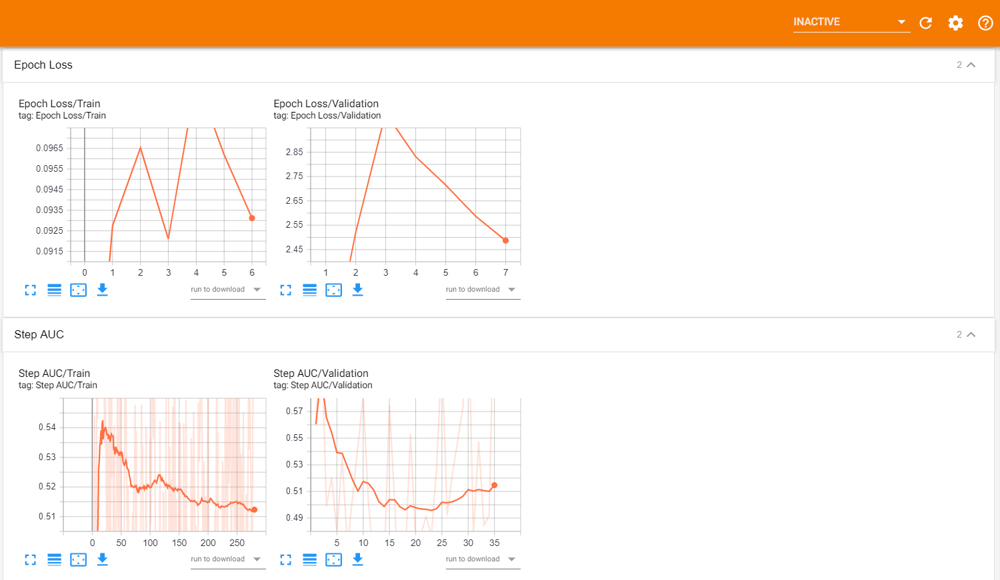

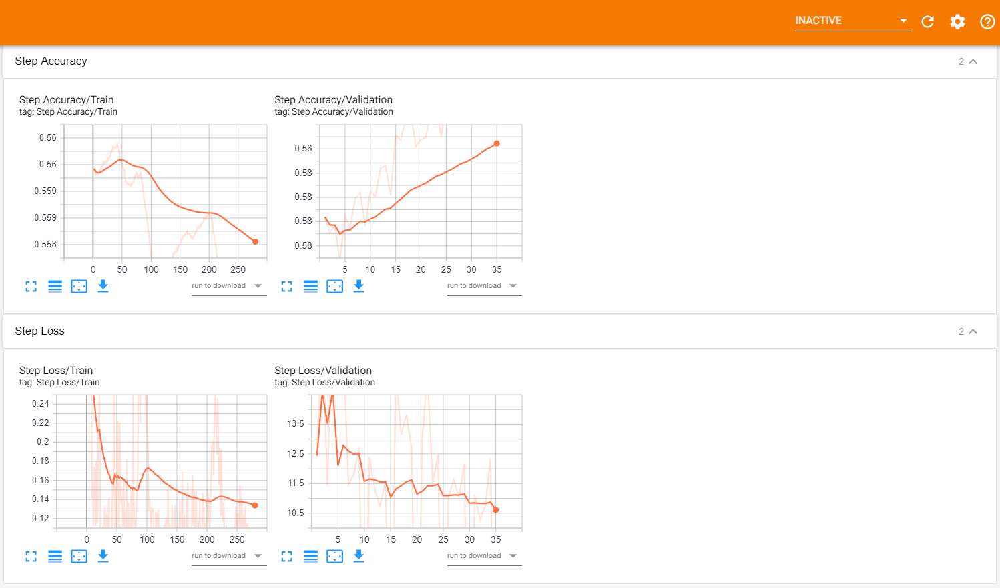

### Modelling with Focal Cross Entropy as Loss Function and F1Score as Metric

In [105]:
import tensorflow_addons as tfa
from tensorflow_addons.metrics import F1Score
F1S=tfa.metrics.F1Score(
    num_classes=2,
    average= "micro",
    name = 'f1_score'
)

In [106]:
class GMP2(tf.keras.layers.Layer):   
    def __init__(self):
        super(GMP2,self).__init__()
        self.GMP=tf.keras.layers.GlobalMaxPooling2D()              
    def call(self,inputs):
        return self.GMP(inputs)
    
class GAP2(tf.keras.layers.Layer):   
    def __init__(self):
        super(GAP2,self).__init__()
        self.GAP=tf.keras.layers.GlobalAveragePooling2D()              
    def call(self,inputs):
        return self.GAP(inputs)
    
class Dr_Den(tf.keras.layers.Layer):
    def __init__(self,rate,**kwargs):
        super(Dr_Den,self).__init__(**kwargs)
        self.rate=rate
        self.Dens=tf.keras.layers.Dense(1,activation='sigmoid')
    def call(self,inputs):
        lay= tf.nn.dropout(inputs,rate=self.rate)
        lay= self.Dens(lay)
        return lay   

class MyModel(tf.keras.Model):
    def __init__(self,rate,**kwargs):
        super(MyModel,self).__init__()
        self.densenet = tf.keras.applications.DenseNet169(input_shape=(Img_Height,Img_Width,3),include_top=False,weights='imagenet')
        self.GMP2D=GMP2()
        self.GAP2D=GAP2()
        self.Flat=tf.keras.layers.Flatten()
        self.Concat=tf.keras.layers.Concatenate(axis=1)
        self.rate=rate
        self.Dens=Dr_Den(rate)
        
    def call(self, inputs, **kwargs):
        model=self.densenet(inputs)
        m1=self.GMP2D(model)
        m2=self.GAP2D(model)
        m3=self.Flat(model)
        model=self.Concat([m1,m2,m3])
        model=self.Dens(model)
        return model

In [107]:
#https://www.tensorflow.org/tutorials/distribute/save_and_load
def UNSModelGT(Epochs,checkpoint,manager,File_Name,modelc):
    
    start_time=time.clock()
    
    print("\nInitializing Parameters . . .")


    train_loss_results = []
    train_accuracy_results = []

    val_loss_results = []
    val_accuracy_results = []
    
    train_f1_score=[]
    val_f1_score=[]
    
    iepoch=0
    T_step=0
    V_step=0
    
    # Defining GradientTape
    
    @tf.function
    def GT(modelc,X_batch,Y_batch):    
        with tf.GradientTape() as tape:
            Y_Pred=modelc(X_batch, training=True)
            Y_batch = tf.cast(Y_batch, tf.float32)
            loss_values=loss_focal(Y_batch, Y_Pred)
            loss_values = tf.reduce_sum(loss_values) * (1. / 128)
            gradients=tape.gradient(loss_values, modelc.trainable_weights)
            Opt_Adam.apply_gradients(zip(gradients, modelc.trainable_weights))
        
            return loss_values,Y_Pred
        
    
    
    # Initializing the Identifiers
    
    train_log_dir = 'logs/GT/UNS_D169_' + File_Name + '/train'
    summary_writer = tf.summary.create_file_writer(train_log_dir)
    save_path='ModelsGT/UNS_D169_' + File_Name
    
    # Training the Model
    
    print("\nTraining the Model . . .")
    print("\nChecking for the Checkpoint Files . . .")
    
    # Checking for the Checkpoints
    checkpoint.restore(manager.latest_checkpoint)
    if manager.latest_checkpoint:
        print("\nFound . .  !\nRestoring . . ")
        print("\nRestored from {}".format(manager.latest_checkpoint))
        ind=manager.latest_checkpoint.find("ckpt")
        iepoch=int(manager.latest_checkpoint[(ind+5):])
        print("\nTraining from Epoch {}".format(int(iepoch)+1))
        T_step=iepoch*(len(x_train)//Batch_Size)
        V_step=iepoch*(len(x_test)//Batch_Size)
    else:
        print("\nNot Found . . !")
        print("\nTraining the Model From Scratch . . .")
    
    Epochs=Epochs+int(iepoch)
    for epoch in range(int(iepoch),Epochs):

        print("\nEpoch {}/{}".format(epoch+1, Epochs))
        print("[", end ="")
        c=0
        # for loop iterate over batches
        for (X_batch, y_batch) in (T_Data):
            y_batch=tf.reshape(y_batch, [-1,1])
            
               
        
            # GradientTape
            loss_values,y_pred=GT(modelc,X_batch,y_batch)
            
            train_loss(loss_values)
            y_batch = tf.cast(y_batch, tf.float32)
            train_accuracy(y_batch, y_pred)
            train_f1_SCORE=F1S(y_batch,y_pred)
            

            train_loss_results.append(loss_values)
            train_accuracy_results.append(train_accuracy.result())
            train_f1_score.append(train_f1_SCORE)
            
            c+=1
            T_step+=1
            #train_accuracy.reset_states
            with summary_writer.as_default():
                tf.summary.scalar(f'Step Loss/Train', loss_values, step=T_step)
                tf.summary.scalar(f'Step Accuracy/Train', train_accuracy.result(), step=T_step)
                tf.summary.scalar(f'Step AUC/Train', train_f1_SCORE, step=T_step)
        # Tensorboard Summary Writer    
        with summary_writer.as_default():
            tf.summary.scalar(f'Epoch Loss/Train', loss_values, step=epoch)
            tf.summary.scalar(f'Epoch Accuracy/Train', train_accuracy.result(), step=epoch+1)
            tf.summary.scalar(f'Epoch AUC/Train', train_f1_SCORE, step=epoch+1)
        
        # For Loop Iterating ove Validation Data Batches
        for (X_batch, y_batch) in (V_Data):
        
            
                

            # GradientTape
            val_loss_values,y_pred=GT(modelc,X_batch,y_batch)

            val_loss(val_loss_values)
            val_accuracy(y_batch, y_pred)
            val_f1_SCORE=F1S(y_batch,y_pred)


            val_loss_results.append(val_loss_values)
            val_accuracy_results.append(val_accuracy.result())
            val_f1_score.append(val_f1_SCORE)
            
            c+=1
            V_step+=1
            #val_accuracy.reset_states
            
            with summary_writer.as_default():
                tf.summary.scalar(f'Step Loss/Validation', val_loss_values, step=V_step)
                tf.summary.scalar(f'Step Accuracy/Validation', val_accuracy.result(), step=V_step)
                tf.summary.scalar(f'Step AUC/Validation', val_f1_SCORE, step=V_step)
        
        # Tensorboard Summary Writer
        with summary_writer.as_default():
            tf.summary.scalar(f'Epoch Loss/Validation', val_loss_values, step=epoch+1)
            tf.summary.scalar(f'Epoch Accuracy/Validation', val_accuracy.result(), step=epoch+1)
            tf.summary.scalar(f'Epoch AUC/Validation', val_f1_SCORE, step=epoch+1)

        # Creating Checkpoint using tf.train.Checkpoint
        checkpoint = tf.train.Checkpoint(optimizer=Opt_Adam, model=modelc)
        print("]")
        Epoch_Stats = 'Training loss: {:.4f}, Training accuracy: {:.4f}, Train f1 SCORE: {:.4f} Validation loss: {:.4f}, Validation accuracy: {:.4f}, Validation F1 SCORE: {:.4f}'
        print(Epoch_Stats.format(loss_values,train_accuracy.result() * 100,train_f1_SCORE,val_loss_values,val_accuracy.result()*100,val_f1_SCORE))
    
        Checkpoint_save_path = manager.save()
        print("Saved Checkpoint for Epoch {}: {}".format(epoch+1, Checkpoint_save_path))
    #checkpoint.save(checkpoint_path+'/')
    z=modelc.predict(V_Data)
    # Saving the Model using tf.saved_model
    tf.saved_model.save(modelc,save_path+'/')
    
    # Displaying Information related to this run
    print("\n\nCorresponding Files to this Run : ")
    print("\nTensorBoard Log Files : logs/GT/UNS_D169_{}".format(File_Name))
    print("\nCheckpoint Files : CheckponitsGT/{}".format(File_Name))
    print("\nModel Files : {}".format(save_path))
        
    print("\n\nTime Taken For This Process : "+ str((time.clock()-start_time)) + " Sec")

In [108]:
def UNS_D169(Init_LR,Dropout_Rate,Img_Height,Img_Width,Epochs,File_Name):
    
    # Initializing Optimizer
    
    print("\nInitializing Optimizer . . .")
    Opt_Adam =Adam(lr=Init_LR)
    
    # Building Model
    print("\nBuilding Model . . .")
    modelx = MyModel(rate=Dropout_Rate)
    modelx.build(input_shape=(None, Img_Height,Img_Width,3))
    
    # Creating Checkpoint Objects
    checkpoint = tf.train.Checkpoint(optimizer=Opt_Adam,model=modelx)
    manager = tf.train.CheckpointManager(checkpoint, 'CheckponitsGT/UNS_D169_' + File_Name, max_to_keep=None)
    
    # Calling the Training Module
    K.clear_session()
    UNSModelGT(Epochs=Epochs,checkpoint=checkpoint,manager=manager,File_Name=File_Name,modelc=modelx)

#### Model Using Dropout_Rate=0.5, Learning Rate=0.001 and Epochs=8

In [109]:
K.clear_session()
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_D169(Init_LR=0.001,Dropout_Rate=0.5,Img_Height=96,Img_Width=96,Epochs=8,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/8
[]
Training loss: 0.1462, Training accuracy: 55.7412, Train f1 SCORE: 0.5818 Validation loss: 3.5501, Validation accuracy: 58.0483, Validation F1 SCORE: 0.5881
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200816-092240\ckpt-1

Epoch 2/8
[]
Training loss: 0.0488, Training accuracy: 55.6625, Train f1 SCORE: 0.5877 Validation loss: 2.0060, Validation accuracy: 58.0739, Validation F1 SCORE: 0.5880
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200816-092240\ckpt-2

Epoch 3/8
[]
Training loss: 0.0506, Training accuracy: 55.5840, Train f1 SCORE: 0.5878 Validation loss: 1.9631, Validation accuracy: 58.0751, Validation F1 SCORE: 0.5878
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200816-092240\ckpt-3

Epoch 4/8
[]
Training loss: 0.0461, Training accurac

#### Tensor logs

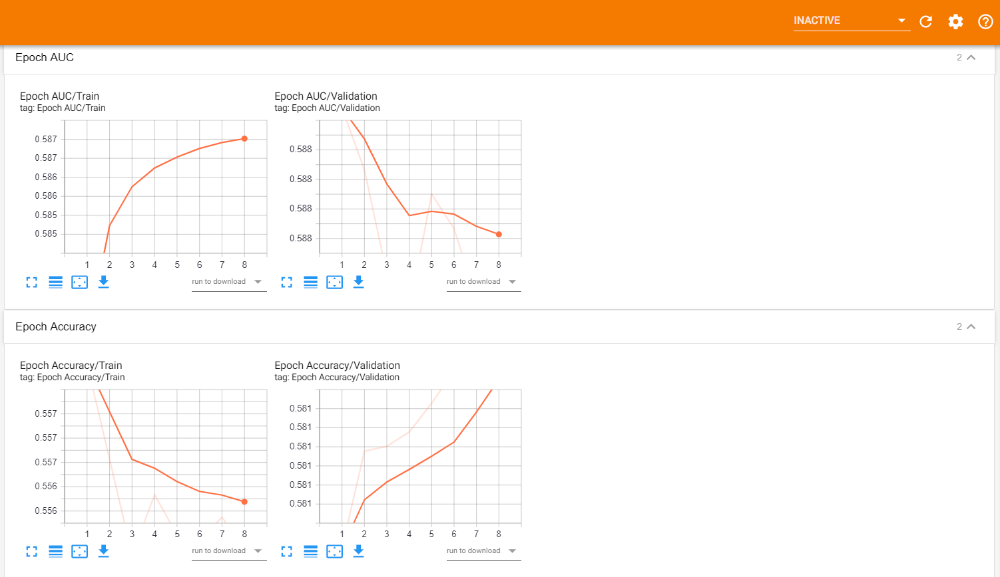

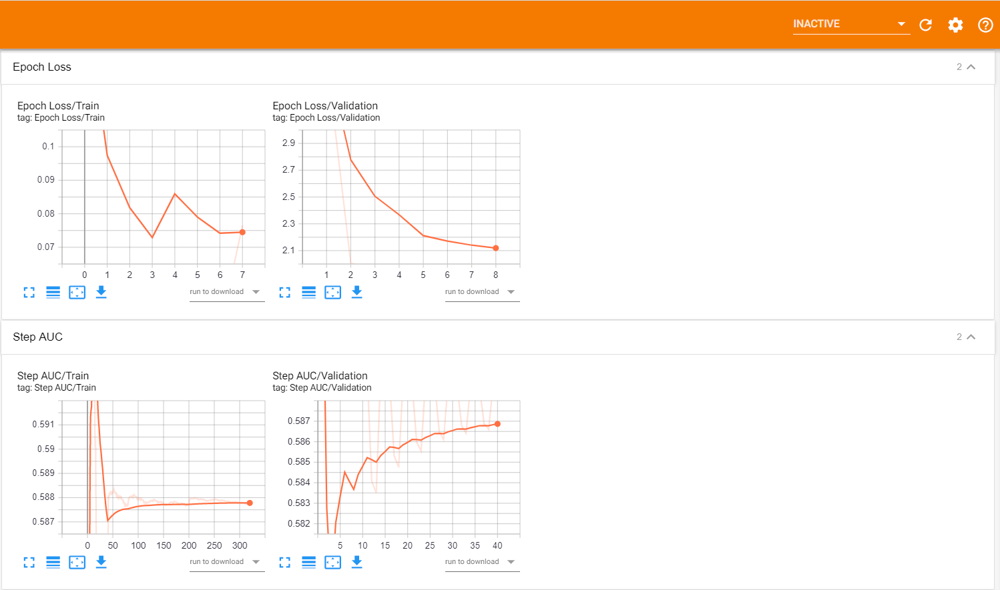

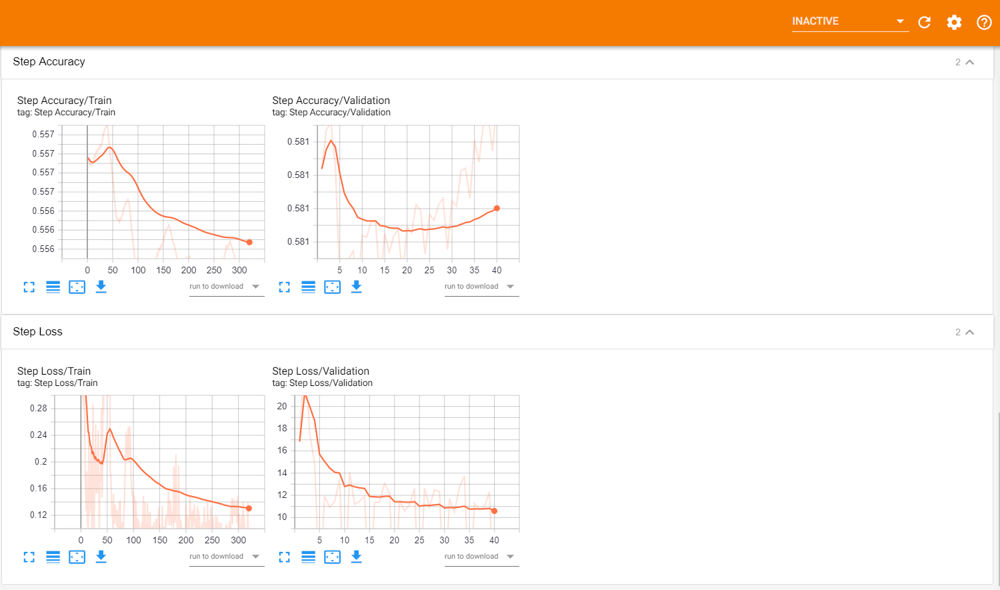

#### Model Using Dropout_Rate=0.5, Learning Rate=0.0001 and Epochs=10

In [110]:
K.clear_session()
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_D169(Init_LR=0.0001,Dropout_Rate=0.5,Img_Height=96,Img_Width=96,Epochs=10,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/10
[]
Training loss: 0.0558, Training accuracy: 55.6130, Train f1 SCORE: 0.5878 Validation loss: 2.4521, Validation accuracy: 58.0842, Validation F1 SCORE: 0.5878
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200816-092703\ckpt-1

Epoch 2/10
[]
Training loss: 0.0456, Training accuracy: 55.6595, Train f1 SCORE: 0.5878 Validation loss: 2.0289, Validation accuracy: 58.0821, Validation F1 SCORE: 0.5878
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200816-092703\ckpt-2

Epoch 3/10
[]
Training loss: 0.0438, Training accuracy: 55.6321, Train f1 SCORE: 0.5878 Validation loss: 4.4062, Validation accuracy: 58.0856, Validation F1 SCORE: 0.5879
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200816-092703\ckpt-3

Epoch 4/10
[]
Training loss: 0.1368, Training acc

### Tensorboard Log files

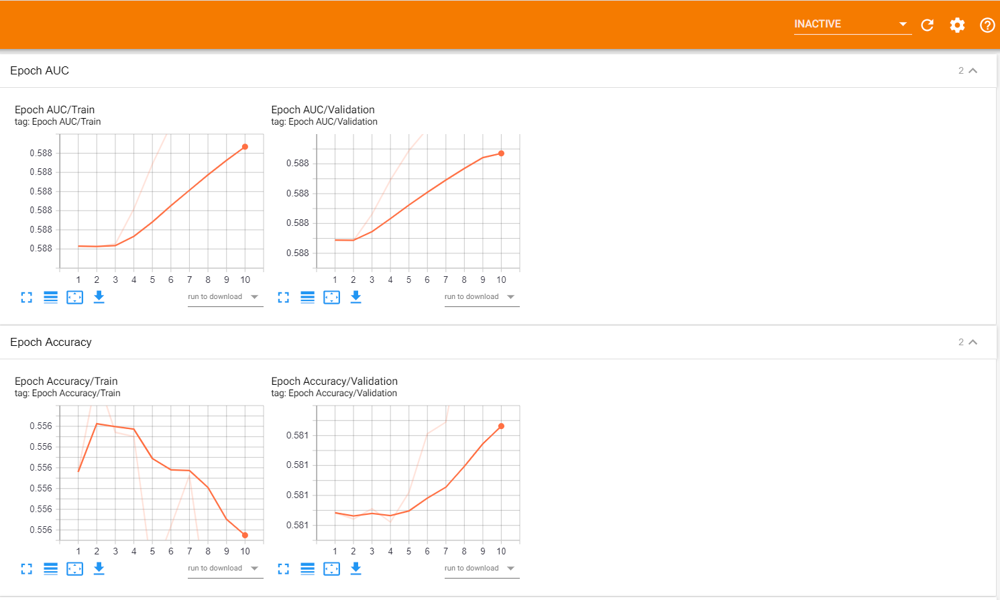

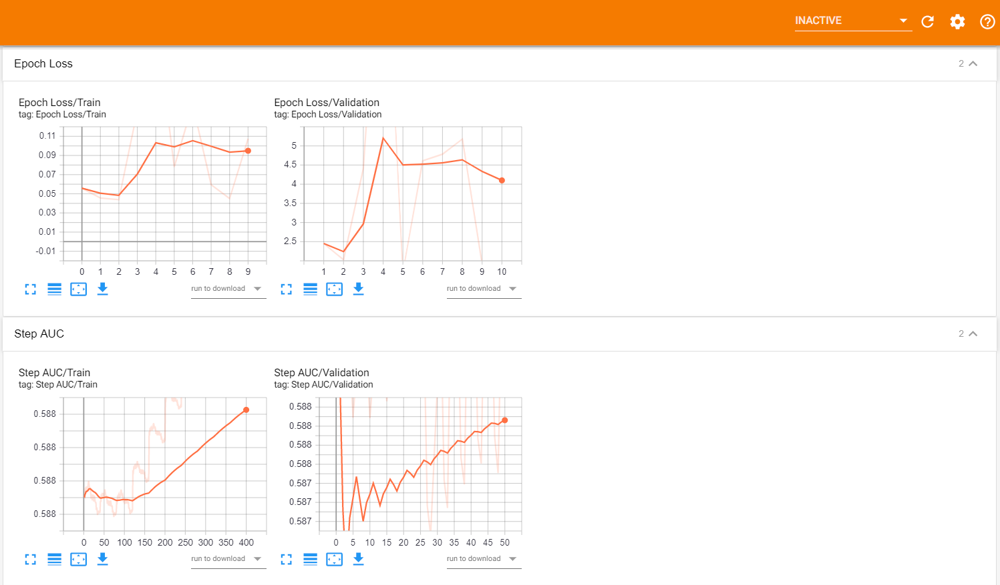

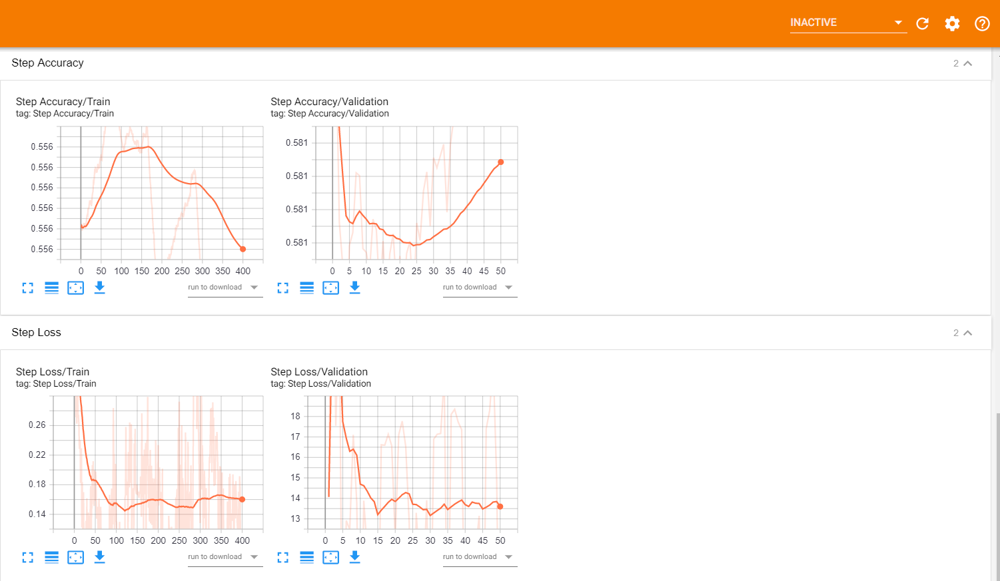

#### Model Using Dropout_Rate=0.5, Learning Rate=0.01 and Epochs=10

In [111]:
K.clear_session()
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_D169(Init_LR=0.01,Dropout_Rate=0.5,Img_Height=96,Img_Width=96,Epochs=15,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/15
[]
Training loss: 0.0812, Training accuracy: 55.5398, Train f1 SCORE: 0.5882 Validation loss: 2.1178, Validation accuracy: 58.1514, Validation F1 SCORE: 0.5882
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200816-093159\ckpt-1

Epoch 2/15
[]
Training loss: 0.0469, Training accuracy: 55.5804, Train f1 SCORE: 0.5882 Validation loss: 2.5500, Validation accuracy: 58.1467, Validation F1 SCORE: 0.5881
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200816-093159\ckpt-2

Epoch 3/15
[]
Training loss: 0.0451, Training accuracy: 55.6217, Train f1 SCORE: 0.5881 Validation loss: 4.9008, Validation accuracy: 58.1369, Validation F1 SCORE: 0.5881
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200816-093159\ckpt-3

Epoch 4/15
[]
Training loss: 0.1407, Training acc

#### Tensorboard Log Files

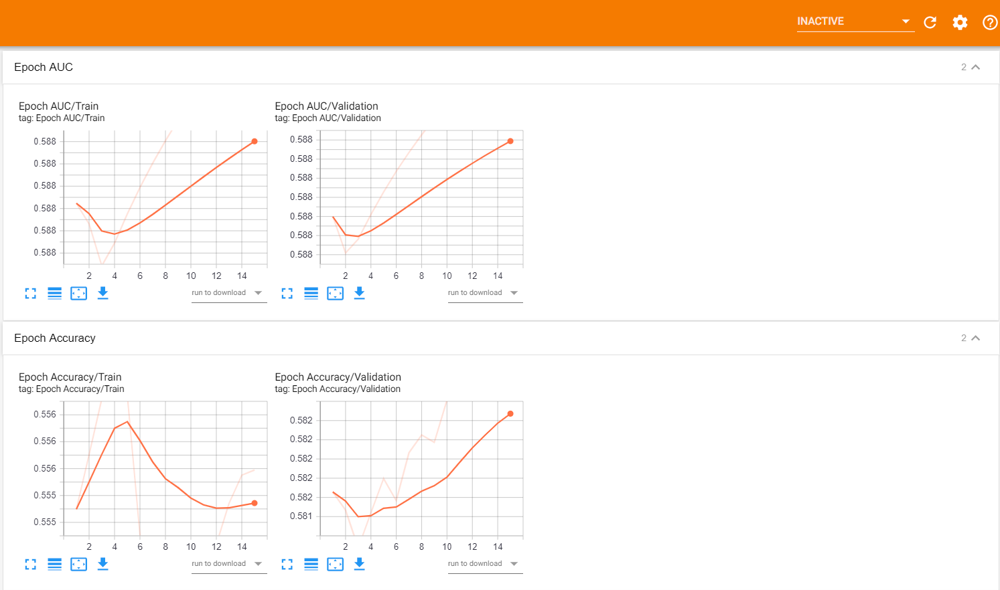

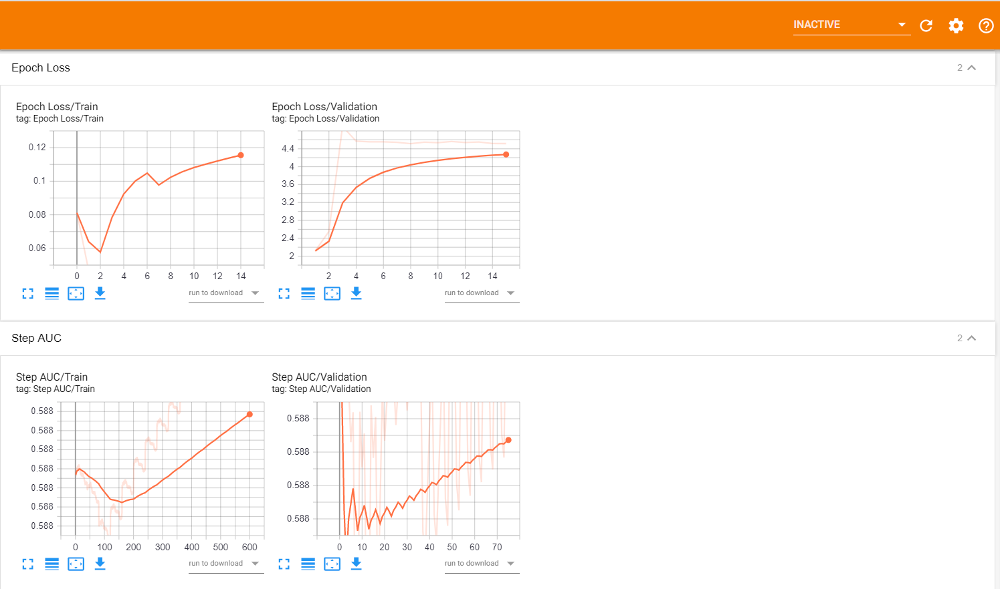

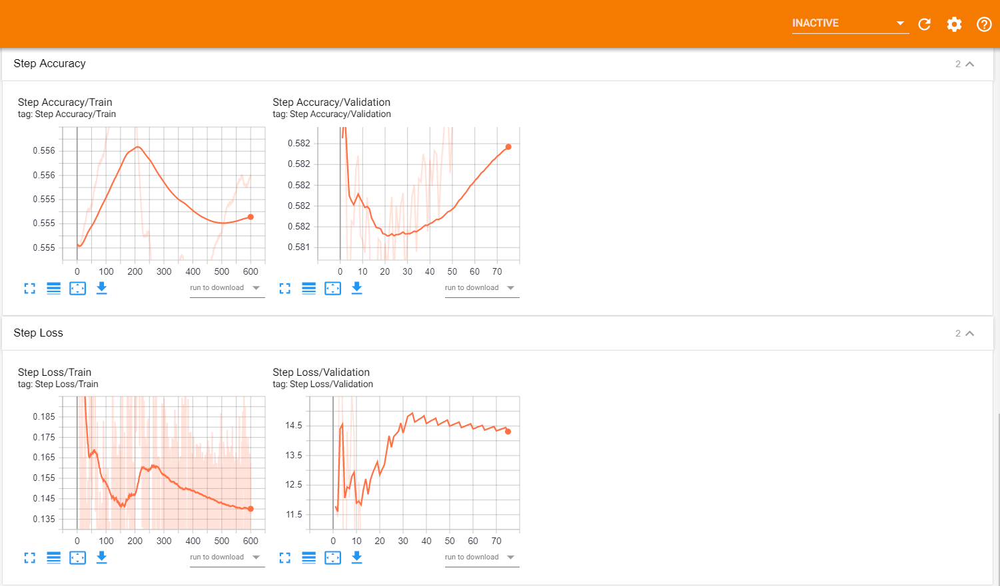

#### Model Using Dropout_Rate=0.4, Learning Rate=0.0001 and Epochs=10

In [112]:
K.clear_session()
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_D169(Init_LR=0.0001,Dropout_Rate=0.4,Img_Height=96,Img_Width=96,Epochs=10,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/10
[]
Training loss: 0.0392, Training accuracy: 55.5917, Train f1 SCORE: 0.5885 Validation loss: 3.4394, Validation accuracy: 58.1749, Validation F1 SCORE: 0.5885
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200816-093819\ckpt-1

Epoch 2/10
[]
Training loss: 0.1556, Training accuracy: 55.5480, Train f1 SCORE: 0.5885 Validation loss: 3.3016, Validation accuracy: 58.1712, Validation F1 SCORE: 0.5885
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200816-093819\ckpt-2

Epoch 3/10
[]
Training loss: 0.0828, Training accuracy: 55.5828, Train f1 SCORE: 0.5885 Validation loss: 3.0961, Validation accuracy: 58.1331, Validation F1 SCORE: 0.5885
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200816-093819\ckpt-3

Epoch 4/10
[]
Training loss: 0.0469, Training acc

#### Tensorboard Log Files

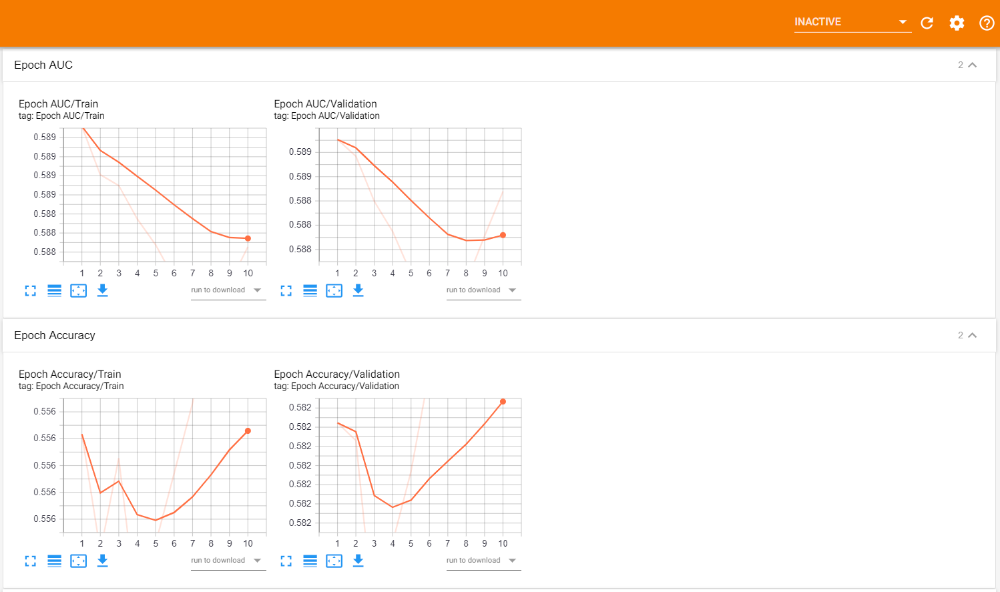

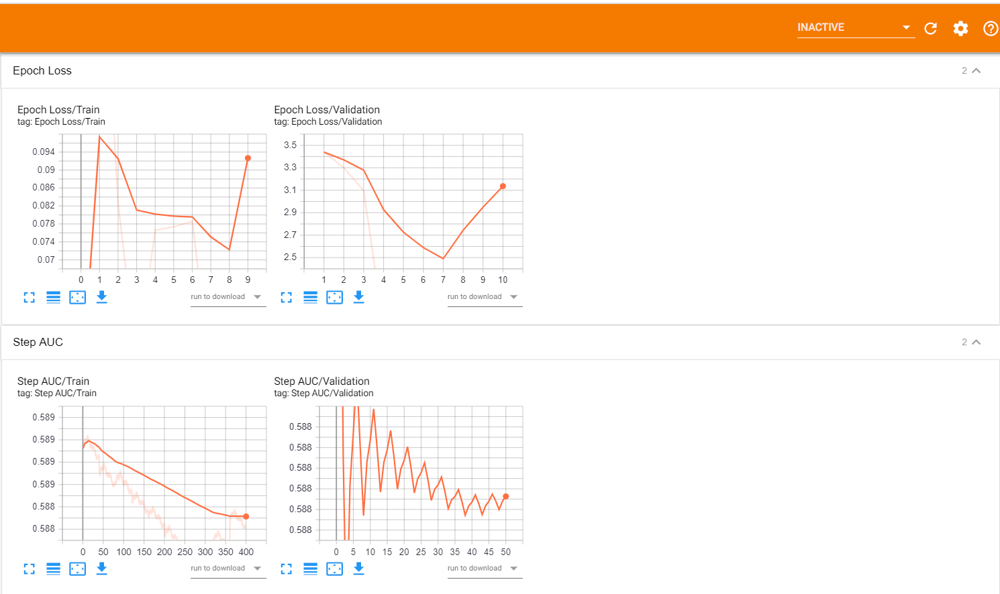

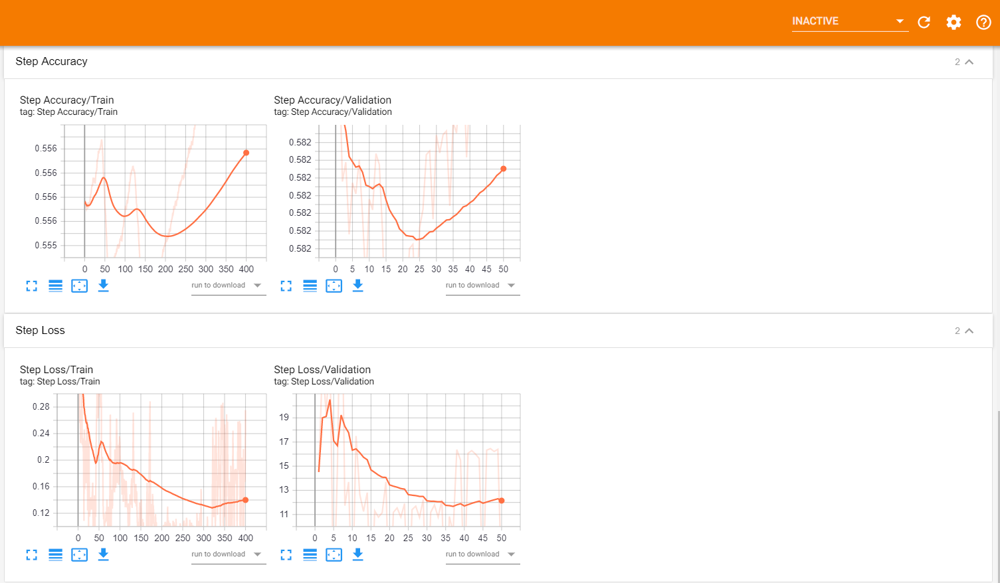

#### Model Using Dropout_Rate=0.4, Learning Rate=0.001 and Epochs=7

In [113]:
K.clear_session()
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_D169(Init_LR=0.001,Dropout_Rate=0.4,Img_Height=96,Img_Width=96,Epochs=7,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/7
[]
Training loss: 0.0570, Training accuracy: 55.6740, Train f1 SCORE: 0.5885 Validation loss: 2.1900, Validation accuracy: 58.1926, Validation F1 SCORE: 0.5885
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200816-094312\ckpt-1

Epoch 2/7
[]
Training loss: 0.0779, Training accuracy: 55.7057, Train f1 SCORE: 0.5885 Validation loss: 4.2040, Validation accuracy: 58.1431, Validation F1 SCORE: 0.5884
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200816-094312\ckpt-2

Epoch 3/7
[]
Training loss: 0.0551, Training accuracy: 55.7350, Train f1 SCORE: 0.5884 Validation loss: 1.6398, Validation accuracy: 58.1523, Validation F1 SCORE: 0.5884
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200816-094312\ckpt-3

Epoch 4/7
[]
Training loss: 0.0466, Training accurac

#### Tensorboard Log Files

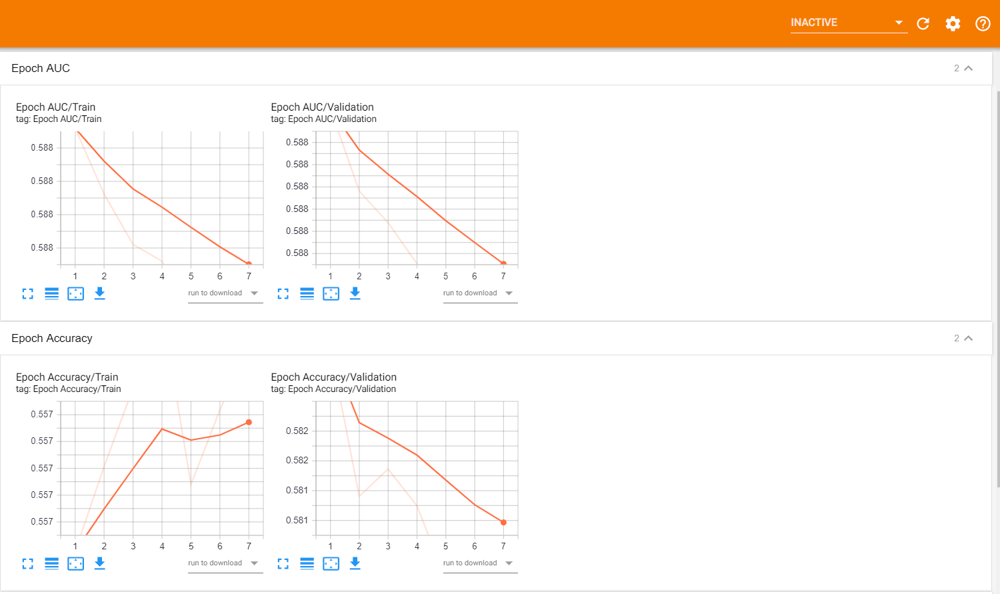

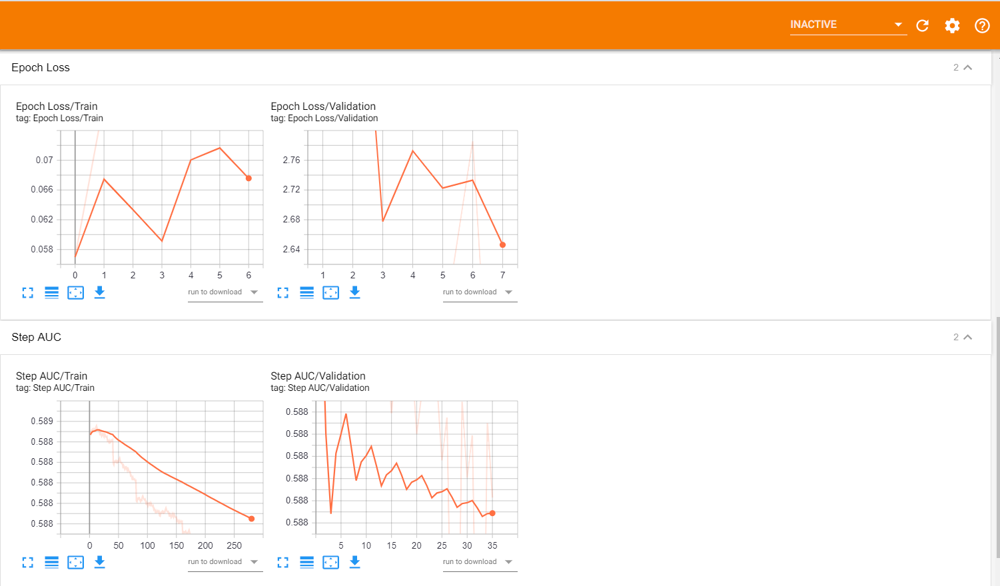

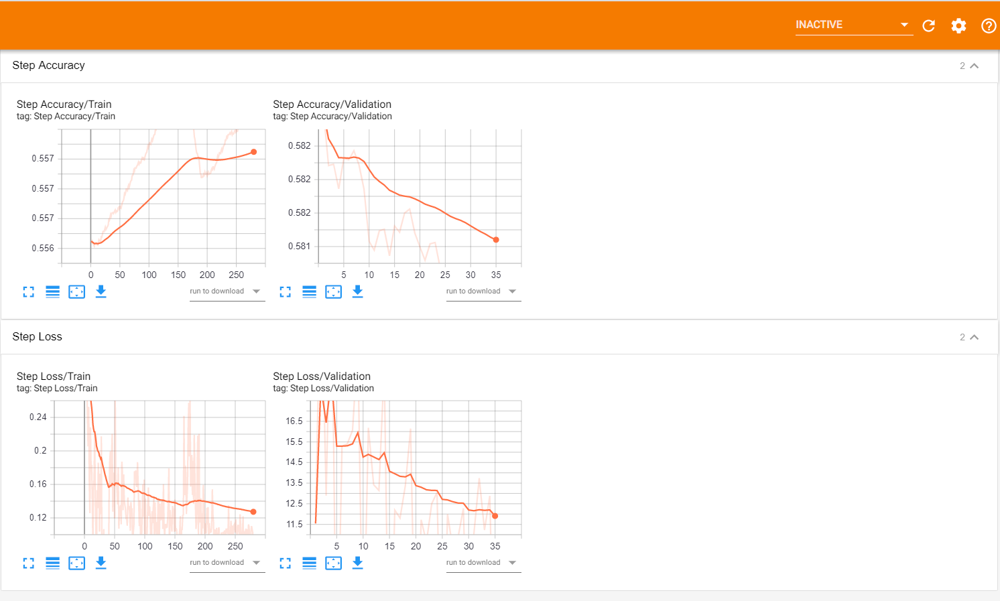

#### Model Using Dropout_Rate=0.3, Learning Rate=0.0001 and Epochs=7

In [114]:
K.clear_session()
Model_Name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
UNS_D169(Init_LR=0.0001,Dropout_Rate=0.3,Img_Height=96,Img_Width=96,Epochs=7,File_Name=Model_Name)


Initializing Optimizer . . .

Building Model . . .

Initializing Parameters . . .

Training the Model . . .

Checking for the Checkpoint Files . . .

Not Found . . !

Training the Model From Scratch . . .

Epoch 1/7
[]
Training loss: 0.0434, Training accuracy: 55.7842, Train f1 SCORE: 0.5883 Validation loss: 2.5515, Validation accuracy: 58.0775, Validation F1 SCORE: 0.5884
Saved Checkpoint for Epoch 1: CheckponitsGT/UNS_D169_20200816-094712\ckpt-1

Epoch 2/7
[]
Training loss: 0.0591, Training accuracy: 55.8075, Train f1 SCORE: 0.5883 Validation loss: 8.8626, Validation accuracy: 58.0225, Validation F1 SCORE: 0.5883
Saved Checkpoint for Epoch 2: CheckponitsGT/UNS_D169_20200816-094712\ckpt-2

Epoch 3/7
[]
Training loss: 0.0856, Training accuracy: 55.8079, Train f1 SCORE: 0.5883 Validation loss: 2.7077, Validation accuracy: 58.0094, Validation F1 SCORE: 0.5883
Saved Checkpoint for Epoch 3: CheckponitsGT/UNS_D169_20200816-094712\ckpt-3

Epoch 4/7
[]
Training loss: 0.0560, Training accurac

#### Tensorboard Log Files

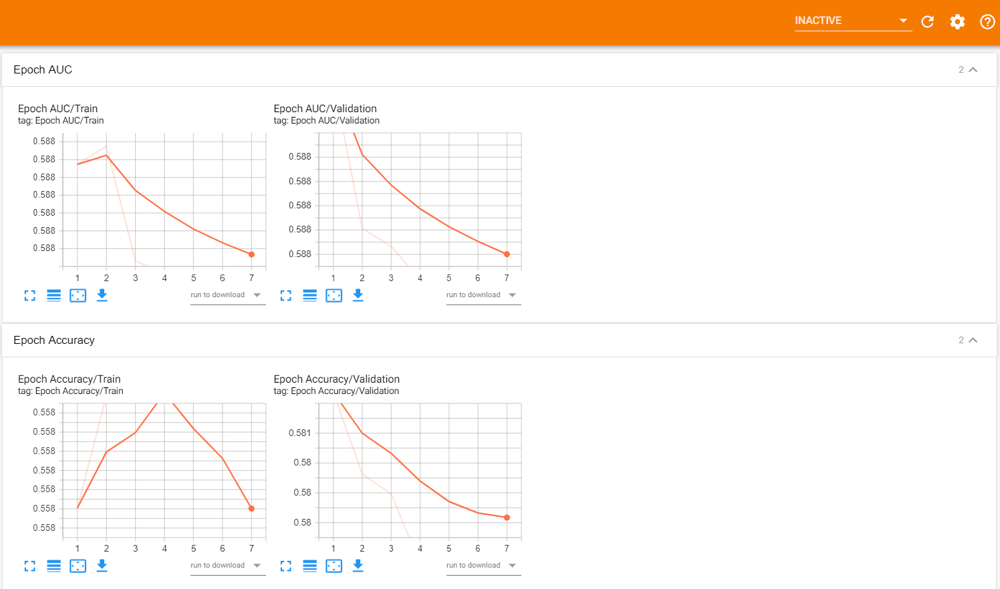

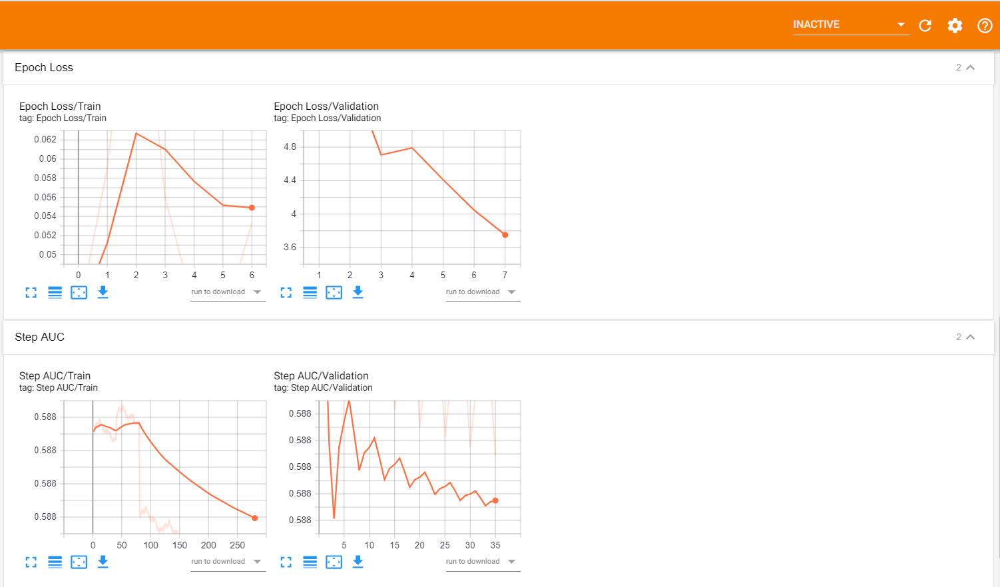

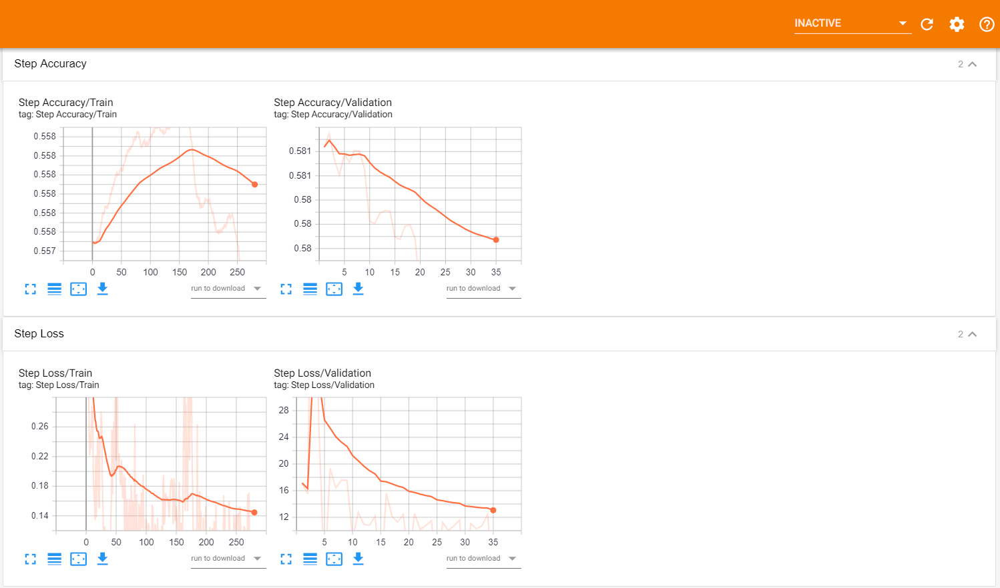

### Testing The Performance of Best Model

 - On observing all the Above Models.
 - The Densenet169 based model with binary cross entropy as loss function and AUC as Metric is the best model.
 - The Best Model is With Model Using Dropout_Rate=0.5, Learning Rate=0.001 and Epochs=8

### Reading The Test Data

In [43]:
import os, sys
from PIL import Image
for infile in tqdm(test):
    if infile[-3:] == "tif" or infile[-3:] == "bmp" :
        outfile = infile[:-3] + "jpeg"
        im = Image.open(infile)
        out = im.convert("RGB")
        out.save(outfile, "JPEG", quality=100)

In [115]:
test = [img for img in glob("test/*.jpeg") if 'mask' not in img]
# f_ultrasounds.sort()  
#f_masks       = [fimg_to_fmask(fimg) for fimg in f_ultrasounds]

In [116]:
len(test)

5508

In [117]:

def _parse_fn_test(ImgFile):
    Img_Path = tf.io.read_file(ImgFile)
    Img_Dec = tf.image.decode_jpeg(Img_Path)
    Img_Nor = (tf.cast(Img_Dec, tf.float32)/255)
    Final_Img = tf.image.resize(Img_Nor, (Img_Height, Img_Width))
    return Final_Img

In [118]:
# Creating Dataset from slices of Image Path's and Labels Using tf.Data
Te_Data = tf.data.Dataset.from_tensor_slices(tf.constant(x_test))
                                            
# Parsing The Images to Pixel Values
Te_Data=Te_Data.map(_parse_fn_test,num_parallel_calls=AT)

# Batch the Images
Te_Data=Te_Data.batch(Batch_Size)

# Prefetching Batch
Te_Data=Te_Data.prefetch(buffer_size=AT)

#### Loading The Best Model

In [119]:
K.clear_session()
modelx=tf.keras.models.load_model('ModelsGT/UNS_D169_20200815-213414')

#### Predicting The Data 

In [120]:
results=modelx.predict(Te_Data)

In [121]:
results=results.ravel().tolist()

In [122]:
len(results)

564

#### To get Threshold and classifying images

In [128]:
from sklearn.metrics import roc_auc_score,confusion_matrix

In [135]:
from tqdm.notebook import tqdm


for x in tqdm(range(1,10)):
    Y_Pred=[]
    x=x*0.1
    for i in results:
        if i>x:
            Y_Pred.append(1)
        else:
            Y_Pred.append(0)
    print("\n")
    print("*"*60)
    print("Threshold : ",x)
    print("*"*60)
    print("Confusion Matrix")
    print("-"*30)
    print(confusion_matrix(y_test,Y_Pred))
    print("-"*30)
    print("AUC Score : ",roc_auc_score(y_test,Y_Pred))



************************************************************
Threshold :  0.1
************************************************************
Confusion Matrix
------------------------------
[[154 177]
 [  7 226]]
------------------------------
AUC Score :  0.717606939564073


************************************************************
Threshold :  0.2
************************************************************
Confusion Matrix
------------------------------
[[188 143]
 [ 12 221]]
------------------------------
AUC Score :  0.7582368424464815


************************************************************
Threshold :  0.30000000000000004
************************************************************
Confusion Matrix
------------------------------
[[211 120]
 [ 16 217]]
------------------------------
AUC Score :  0.7843963538762755


************************************************************
Threshold :  0.4
************************************************************
Confusion Matrix
--

In [138]:
from tqdm.notebook import tqdm


for x in tqdm(range(6,8)):
    
    for q in range(1,10):
        t=x*0.1+q*0.01
        
        Y_Pred=[]
        for i in results:
            if i>t:
                Y_Pred.append(1)
            else:
                Y_Pred.append(0)
        print("\n")
        print("*"*60)
        print("Threshold : ",t)
        print("*"*60)
        print("Confusion Matrix")
        print("-"*30)
        print(confusion_matrix(y_test,Y_Pred))
        print("-"*30)
        print("AUC Score : ",roc_auc_score(y_test,Y_Pred))



************************************************************
Threshold :  0.6100000000000001
************************************************************
Confusion Matrix
------------------------------
[[260  71]
 [ 46 187]]
------------------------------
AUC Score :  0.7940367983610597


************************************************************
Threshold :  0.6200000000000001
************************************************************
Confusion Matrix
------------------------------
[[264  67]
 [ 51 182]]
------------------------------
AUC Score :  0.7893494806996616


************************************************************
Threshold :  0.6300000000000001
************************************************************
Confusion Matrix
------------------------------
[[264  67]
 [ 52 181]]
------------------------------
AUC Score :  0.7872035579528804


************************************************************
Threshold :  0.6400000000000001
***********************************

In [30]:
y_test.count(1)

233

### Observation:

- From the best model, I got best threshold as 0.61. 
- Images are Classified as if the BP nerve is present then it is marked as 1 otherwise it is marked as 0
- after this part the images which are marked as 1 are segmented using segmentation techniques and corresponding RLE will be generated.